In [41]:
# Set up autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [42]:
# Sys Imports
import sys
from pathlib import Path

github_root = Path.cwd().resolve().parents[3]
sys.path.append(str(github_root))


In [43]:
# Self-def imports
from src.dl.data import get_data
from src.dl.loaders import *
from src.dl.train import train_model

In [44]:
# Package imports
import torch
import torch.nn as nn
import numpy as np

In [45]:
# Get device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [46]:
# Data hyperparams
save_path = rf"{github_root}\data\simpler_data_rwc.csv"
batch_size = 20
epoch = 80
n_train = 100
n_val = 24
n_test = 20
n_tb_epoch = n_train // batch_size

# Model hyperparam and weights
model_cfg = {'hidden_ch': [16, 32, 64]}
statedict_path = rf"{github_root}\runs\dl\simpler_data\cnn\cnn_64\model_weights.pth"

# Training hyperparams
lr = 1e-4
weight_decay = 1e-2

# Global hyperparams
n_randoms = 50 # Number of random seeds to use to split the data, and to train on. The metrics will be
               # recrded for each random seed, to create distributions of metrics.
master_seed = 1878439041 # The master seed to use to generate the random seeds for data splitting and training. This is used to ensure reproducibility.
seed_generator = np.random.default_rng(master_seed)
mccv_seeds = seed_generator.integers(low=0, high=2**32 - 1, size=n_randoms).tolist()

In [47]:
for i in mccv_seeds:
    save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'cnn_64' / 'results' /str(i)
    save_dir.mkdir(parents=True, exist_ok=True)

C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.025552
Epoch 1/80, Step 2/5, Train Loss: 0.016145
Epoch 1/80, Step 3/5, Train Loss: 0.010081
Epoch 1/80, Step 4/5, Train Loss: 0.014117
Epoch 1/80, Step 5/5, Train Loss: 0.013070
Epoch 1/80 complete. Train Loss: 0.015793, Val Loss: 0.007296
Epoch 2/80, Step 1/5, Train Loss: 0.016407
Epoch 2/80, Step 2/5, Train Loss: 0.020482
Epoch 2/80, Step 3/5, Train Loss: 0.011352
Epoch 2/80, Step 4/5, Train Loss: 0.055337
Epoch 2/80, Step 5/5, Train Loss: 0.023366
Epoch 2/80 complete. Train Loss: 0.025389, Val Loss: 0.006847
Epoch 3/80, Step 1/5, Train Loss: 0.019247
Epoch 3/80, Step 2/5, Train Loss: 0.022486
Epoch 3/80, Step 3/5, Train Loss: 0.008755
Epoch 3/80, Step 4/5, Train Loss: 0.015308
Epoch 3/80, Step 5/5, Train Loss: 0.010899
Epoch 3/80 complete. Train Loss: 0.015339, Val Loss: 0.006917
Epoch 4/80, Step 1/5, Train Loss: 0.010056
Epoch 4/80, Step 2/5, Train Loss: 0.029735
Epoch 4/80, Step 3/5, Train Loss: 0.016170
Epoch 4/80, Step 4/5, Train Loss: 0.0243

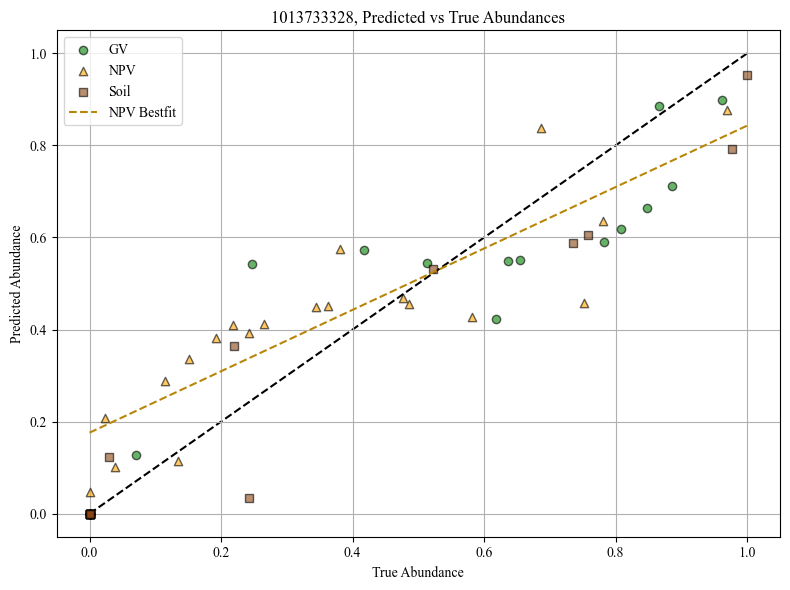

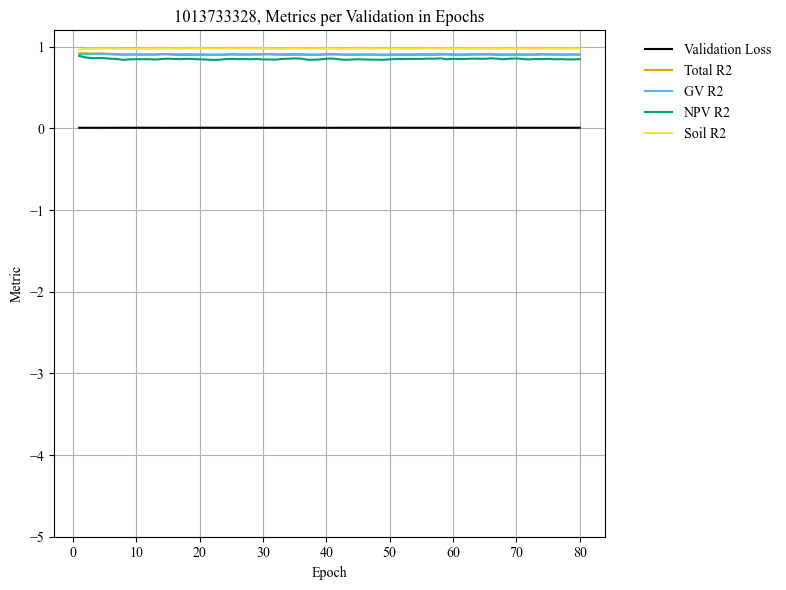

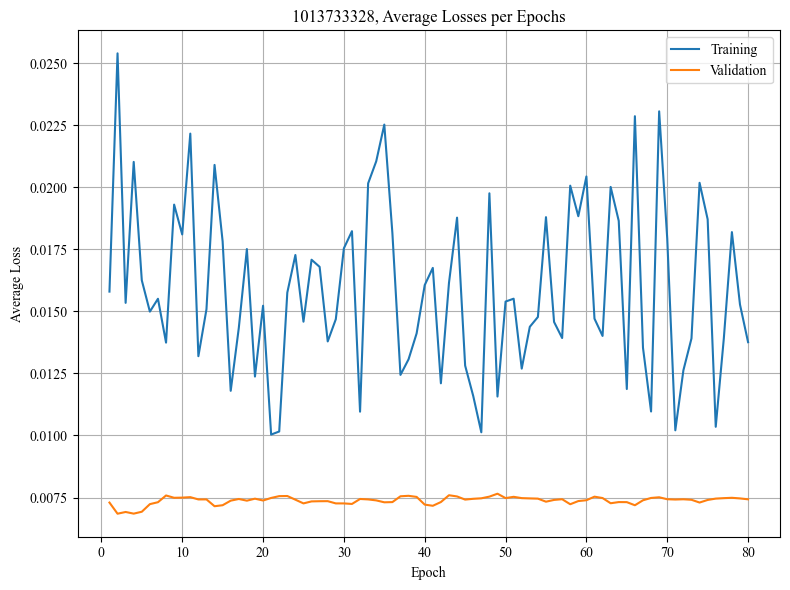

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019952
Epoch 1/80, Step 2/5, Train Loss: 0.009176
Epoch 1/80, Step 3/5, Train Loss: 0.023006
Epoch 1/80, Step 4/5, Train Loss: 0.011928
Epoch 1/80, Step 5/5, Train Loss: 0.007312
Epoch 1/80 complete. Train Loss: 0.014275, Val Loss: 0.008017
Epoch 2/80, Step 1/5, Train Loss: 0.029664
Epoch 2/80, Step 2/5, Train Loss: 0.013480
Epoch 2/80, Step 3/5, Train Loss: 0.012021
Epoch 2/80, Step 4/5, Train Loss: 0.029859
Epoch 2/80, Step 5/5, Train Loss: 0.008729
Epoch 2/80 complete. Train Loss: 0.018751, Val Loss: 0.007778
Epoch 3/80, Step 1/5, Train Loss: 0.011805
Epoch 3/80, Step 2/5, Train Loss: 0.011415
Epoch 3/80, Step 3/5, Train Loss: 0.018271
Epoch 3/80, Step 4/5, Train Loss: 0.010531
Epoch 3/80, Step 5/5, Train Loss: 0.009998
Epoch 3/80 complete. Train Loss: 0.012404, Val Loss: 0.007248
Epoch 4/80, Step 1/5, Train Loss: 0.023866
Epoch 4/80, Step 2/5, Train Loss: 0.012313
Epoch 4/80, Step 3/5, Train Loss: 0.017075
Epoch 4/80, Step 4/5, Train Loss: 0.0115

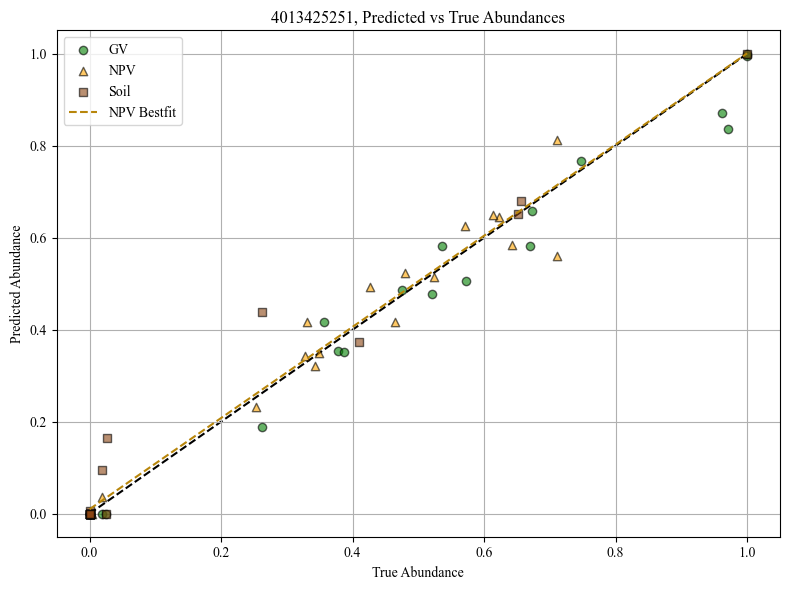

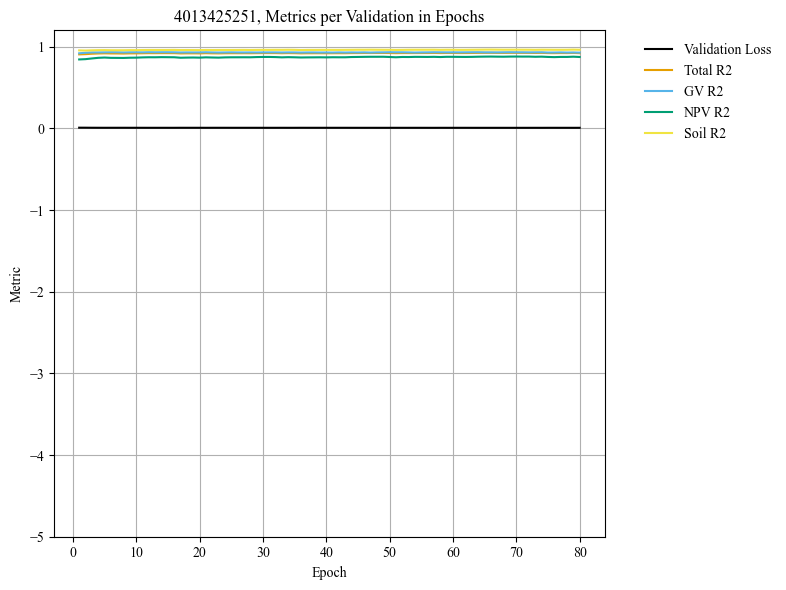

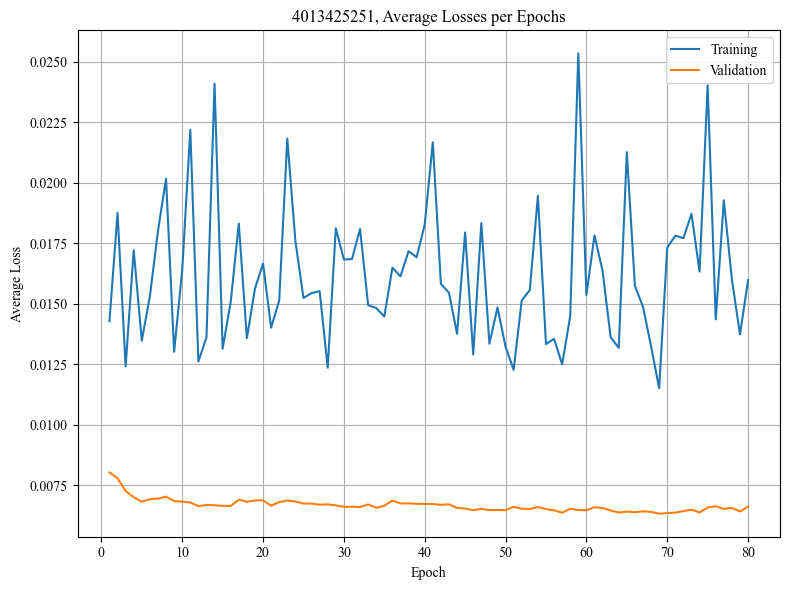

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.026065
Epoch 1/80, Step 2/5, Train Loss: 0.012734
Epoch 1/80, Step 3/5, Train Loss: 0.013795
Epoch 1/80, Step 4/5, Train Loss: 0.010955
Epoch 1/80, Step 5/5, Train Loss: 0.022221
Epoch 1/80 complete. Train Loss: 0.017154, Val Loss: 0.006406
Epoch 2/80, Step 1/5, Train Loss: 0.024250
Epoch 2/80, Step 2/5, Train Loss: 0.011796
Epoch 2/80, Step 3/5, Train Loss: 0.011869
Epoch 2/80, Step 4/5, Train Loss: 0.019197
Epoch 2/80, Step 5/5, Train Loss: 0.013463
Epoch 2/80 complete. Train Loss: 0.016115, Val Loss: 0.006437
Epoch 3/80, Step 1/5, Train Loss: 0.020128
Epoch 3/80, Step 2/5, Train Loss: 0.010892
Epoch 3/80, Step 3/5, Train Loss: 0.009973
Epoch 3/80, Step 4/5, Train Loss: 0.012073
Epoch 3/80, Step 5/5, Train Loss: 0.010670
Epoch 3/80 complete. Train Loss: 0.012747, Val Loss: 0.006404
Epoch 4/80, Step 1/5, Train Loss: 0.016156
Epoch 4/80, Step 2/5, Train Loss: 0.015213
Epoch 4/80, Step 3/5, Train Loss: 0.021248
Epoch 4/80, Step 4/5, Train Loss: 0.0118

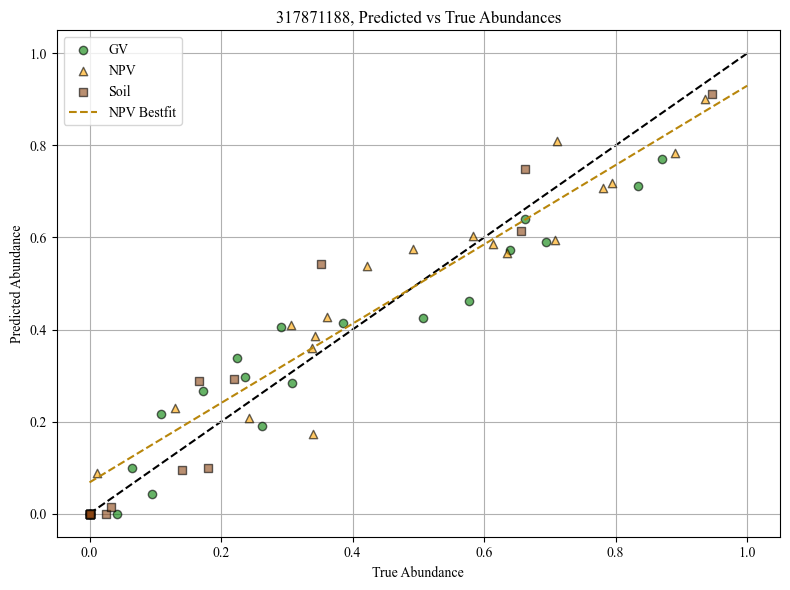

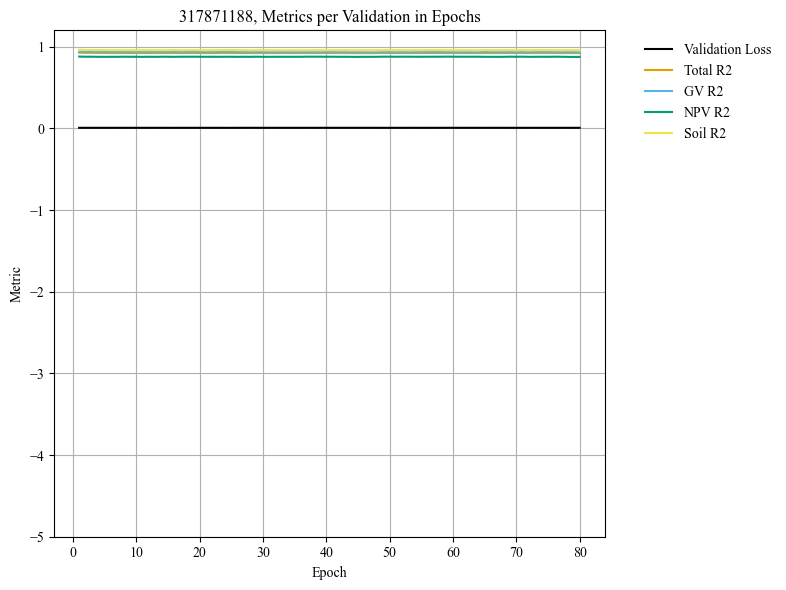

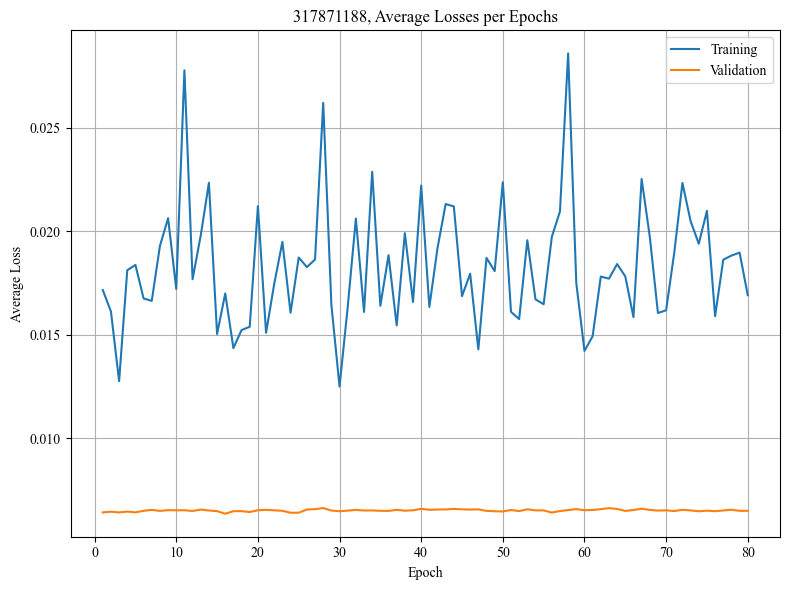

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.029961
Epoch 1/80, Step 2/5, Train Loss: 0.030297
Epoch 1/80, Step 3/5, Train Loss: 0.015995
Epoch 1/80, Step 4/5, Train Loss: 0.008678
Epoch 1/80, Step 5/5, Train Loss: 0.022626
Epoch 1/80 complete. Train Loss: 0.021511, Val Loss: 0.006483
Epoch 2/80, Step 1/5, Train Loss: 0.019526
Epoch 2/80, Step 2/5, Train Loss: 0.021259
Epoch 2/80, Step 3/5, Train Loss: 0.021930
Epoch 2/80, Step 4/5, Train Loss: 0.014817
Epoch 2/80, Step 5/5, Train Loss: 0.008344
Epoch 2/80 complete. Train Loss: 0.017175, Val Loss: 0.006098
Epoch 3/80, Step 1/5, Train Loss: 0.015924
Epoch 3/80, Step 2/5, Train Loss: 0.007565
Epoch 3/80, Step 3/5, Train Loss: 0.045959
Epoch 3/80, Step 4/5, Train Loss: 0.012565
Epoch 3/80, Step 5/5, Train Loss: 0.019076
Epoch 3/80 complete. Train Loss: 0.020218, Val Loss: 0.006000
Epoch 4/80, Step 1/5, Train Loss: 0.013519
Epoch 4/80, Step 2/5, Train Loss: 0.029990
Epoch 4/80, Step 3/5, Train Loss: 0.007686
Epoch 4/80, Step 4/5, Train Loss: 0.0099

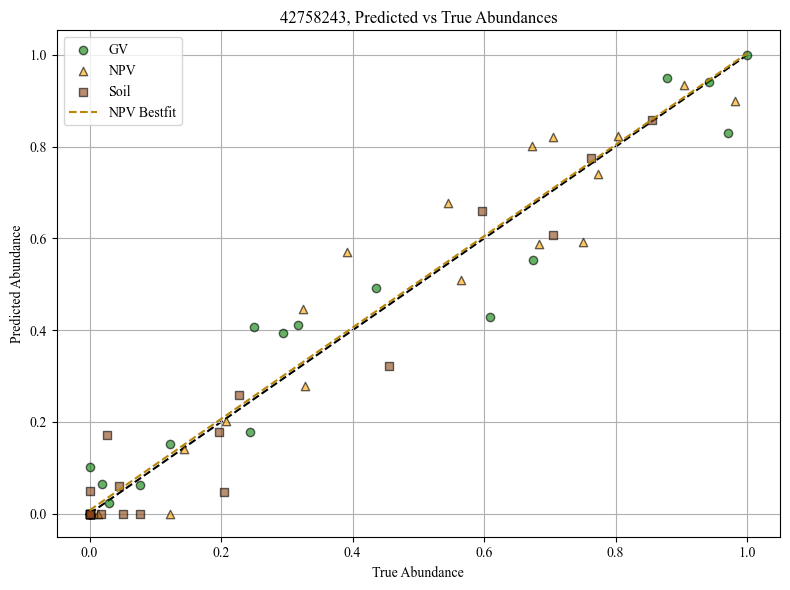

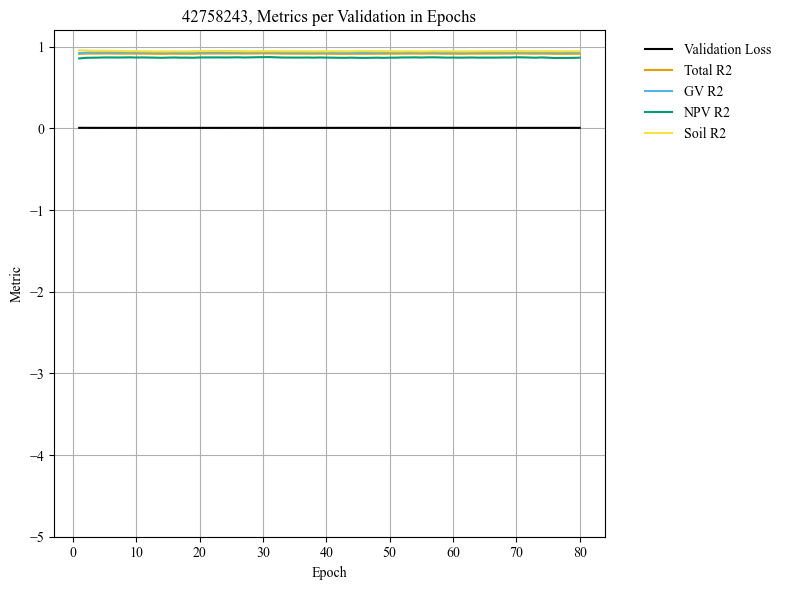

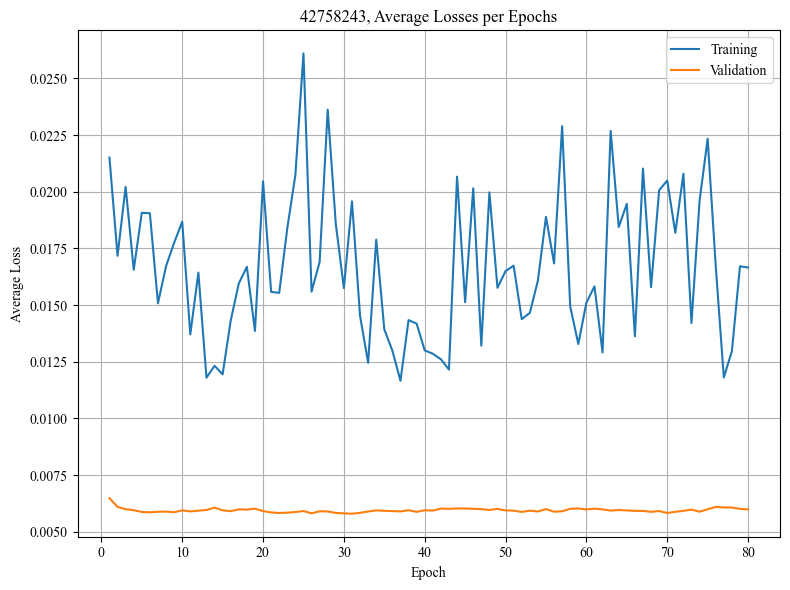

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.043155
Epoch 1/80, Step 2/5, Train Loss: 0.016614
Epoch 1/80, Step 3/5, Train Loss: 0.011469
Epoch 1/80, Step 4/5, Train Loss: 0.004903
Epoch 1/80, Step 5/5, Train Loss: 0.005260
Epoch 1/80 complete. Train Loss: 0.016280, Val Loss: 0.012673
Epoch 2/80, Step 1/5, Train Loss: 0.016827
Epoch 2/80, Step 2/5, Train Loss: 0.008776
Epoch 2/80, Step 3/5, Train Loss: 0.004778
Epoch 2/80, Step 4/5, Train Loss: 0.020592
Epoch 2/80, Step 5/5, Train Loss: 0.022382
Epoch 2/80 complete. Train Loss: 0.014671, Val Loss: 0.012228
Epoch 3/80, Step 1/5, Train Loss: 0.021851
Epoch 3/80, Step 2/5, Train Loss: 0.027933
Epoch 3/80, Step 3/5, Train Loss: 0.016600
Epoch 3/80, Step 4/5, Train Loss: 0.015676
Epoch 3/80, Step 5/5, Train Loss: 0.015882
Epoch 3/80 complete. Train Loss: 0.019589, Val Loss: 0.011900
Epoch 4/80, Step 1/5, Train Loss: 0.009020
Epoch 4/80, Step 2/5, Train Loss: 0.018297
Epoch 4/80, Step 3/5, Train Loss: 0.009266
Epoch 4/80, Step 4/5, Train Loss: 0.0145

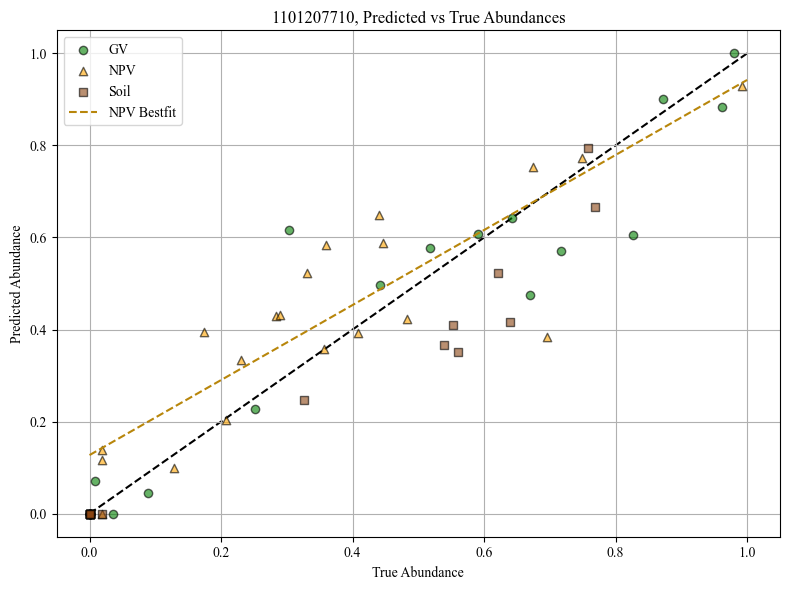

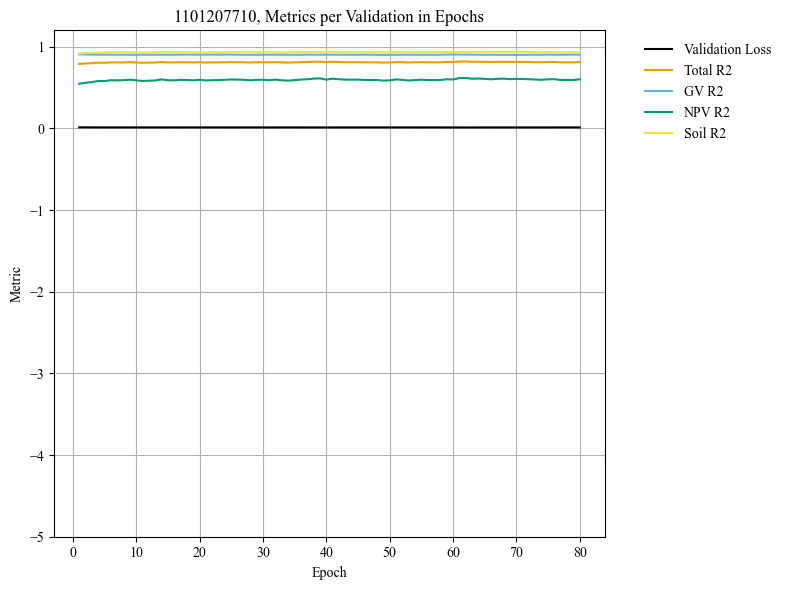

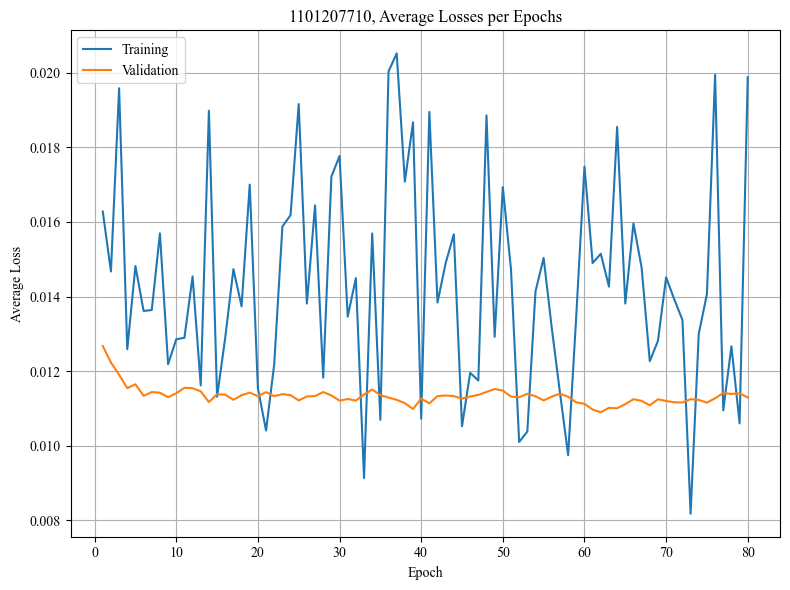

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007487
Epoch 1/80, Step 2/5, Train Loss: 0.016818
Epoch 1/80, Step 3/5, Train Loss: 0.016205
Epoch 1/80, Step 4/5, Train Loss: 0.027723
Epoch 1/80, Step 5/5, Train Loss: 0.003659
Epoch 1/80 complete. Train Loss: 0.014378, Val Loss: 0.010768
Epoch 2/80, Step 1/5, Train Loss: 0.005582
Epoch 2/80, Step 2/5, Train Loss: 0.008025
Epoch 2/80, Step 3/5, Train Loss: 0.014593
Epoch 2/80, Step 4/5, Train Loss: 0.034400
Epoch 2/80, Step 5/5, Train Loss: 0.017784
Epoch 2/80 complete. Train Loss: 0.016077, Val Loss: 0.010616
Epoch 3/80, Step 1/5, Train Loss: 0.012649
Epoch 3/80, Step 2/5, Train Loss: 0.016705
Epoch 3/80, Step 3/5, Train Loss: 0.017363
Epoch 3/80, Step 4/5, Train Loss: 0.022609
Epoch 3/80, Step 5/5, Train Loss: 0.021698
Epoch 3/80 complete. Train Loss: 0.018205, Val Loss: 0.010616
Epoch 4/80, Step 1/5, Train Loss: 0.018063
Epoch 4/80, Step 2/5, Train Loss: 0.010062
Epoch 4/80, Step 3/5, Train Loss: 0.009002
Epoch 4/80, Step 4/5, Train Loss: 0.0156

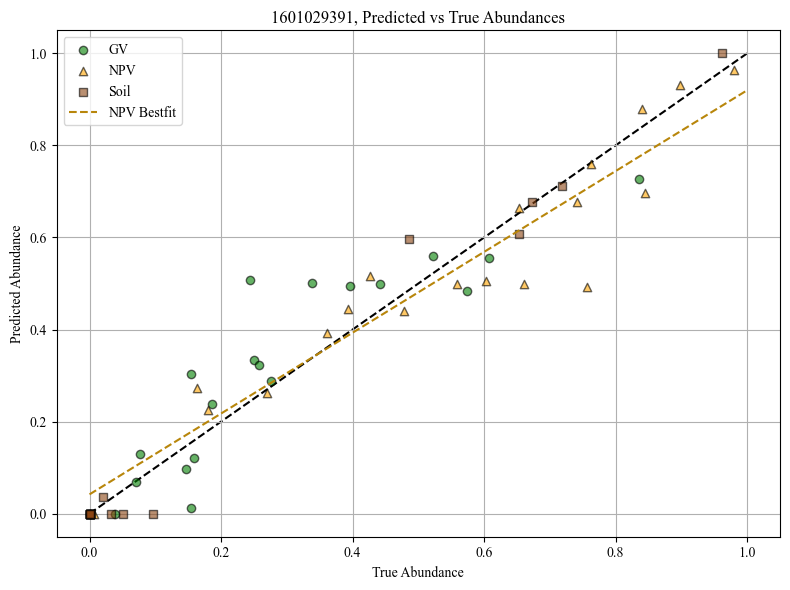

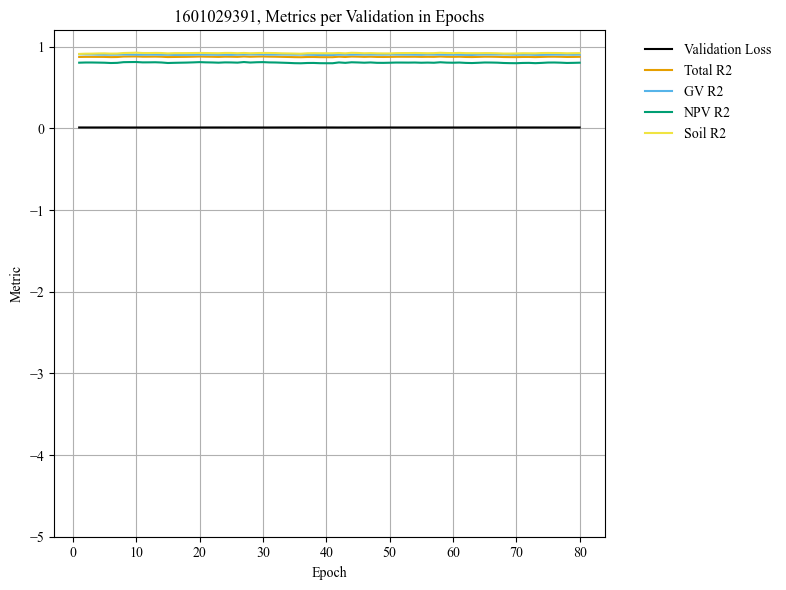

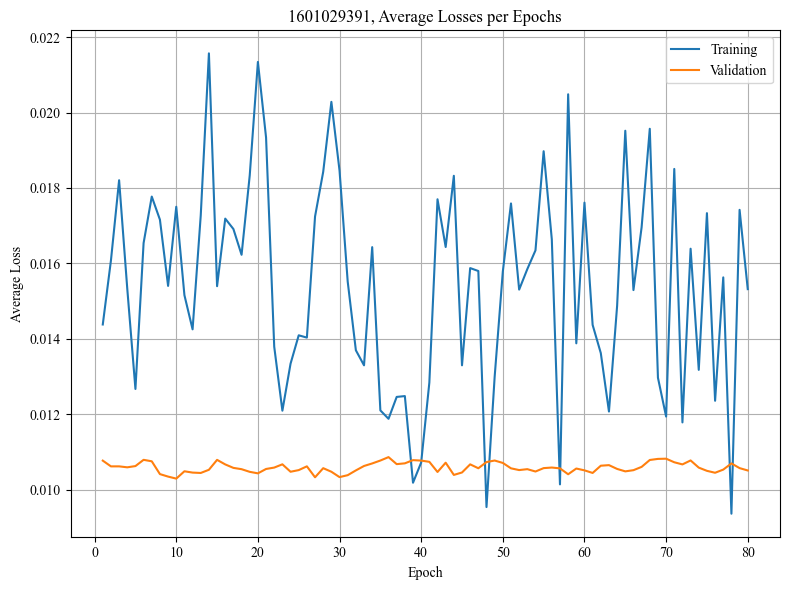

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016207
Epoch 1/80, Step 2/5, Train Loss: 0.029115
Epoch 1/80, Step 3/5, Train Loss: 0.009944
Epoch 1/80, Step 4/5, Train Loss: 0.014435
Epoch 1/80, Step 5/5, Train Loss: 0.023752
Epoch 1/80 complete. Train Loss: 0.018691, Val Loss: 0.013527
Epoch 2/80, Step 1/5, Train Loss: 0.019283
Epoch 2/80, Step 2/5, Train Loss: 0.012406
Epoch 2/80, Step 3/5, Train Loss: 0.025283
Epoch 2/80, Step 4/5, Train Loss: 0.013420
Epoch 2/80, Step 5/5, Train Loss: 0.011602
Epoch 2/80 complete. Train Loss: 0.016399, Val Loss: 0.013449
Epoch 3/80, Step 1/5, Train Loss: 0.016243
Epoch 3/80, Step 2/5, Train Loss: 0.019247
Epoch 3/80, Step 3/5, Train Loss: 0.012252
Epoch 3/80, Step 4/5, Train Loss: 0.013839
Epoch 3/80, Step 5/5, Train Loss: 0.035031
Epoch 3/80 complete. Train Loss: 0.019322, Val Loss: 0.013357
Epoch 4/80, Step 1/5, Train Loss: 0.028365
Epoch 4/80, Step 2/5, Train Loss: 0.016118
Epoch 4/80, Step 3/5, Train Loss: 0.026511
Epoch 4/80, Step 4/5, Train Loss: 0.0052

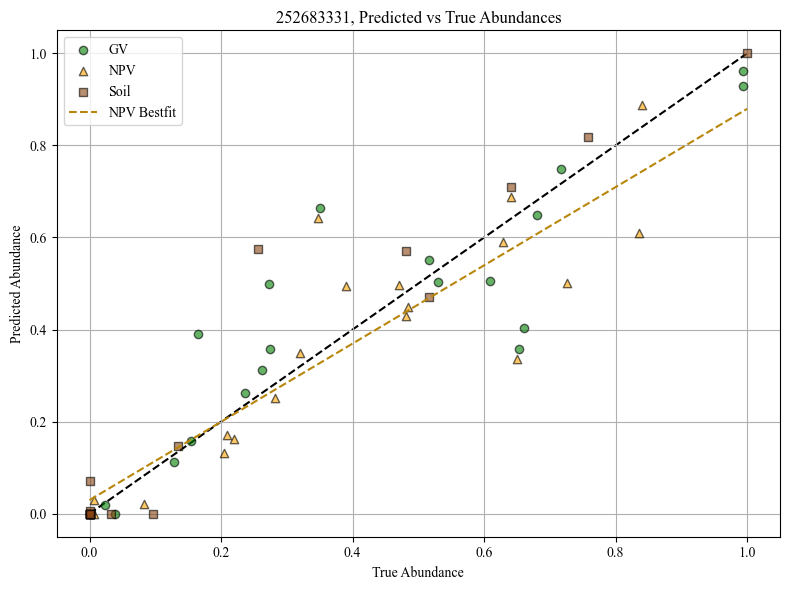

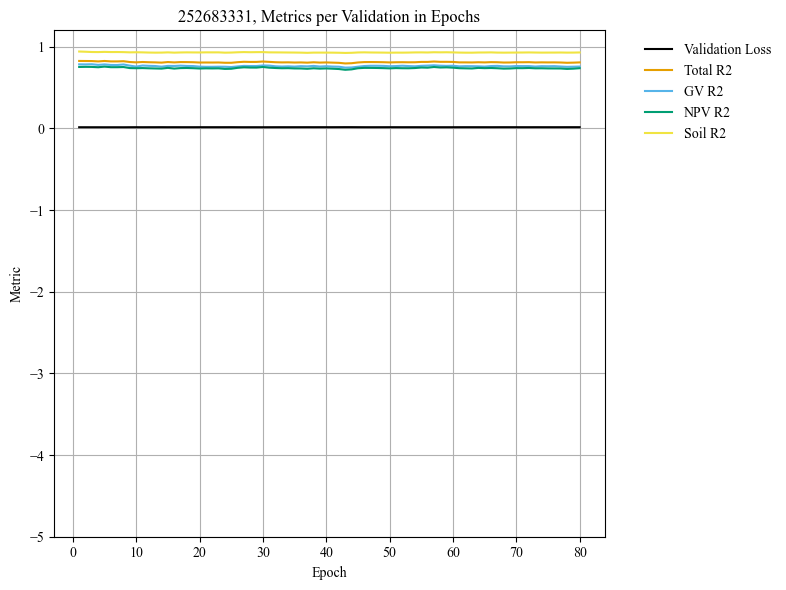

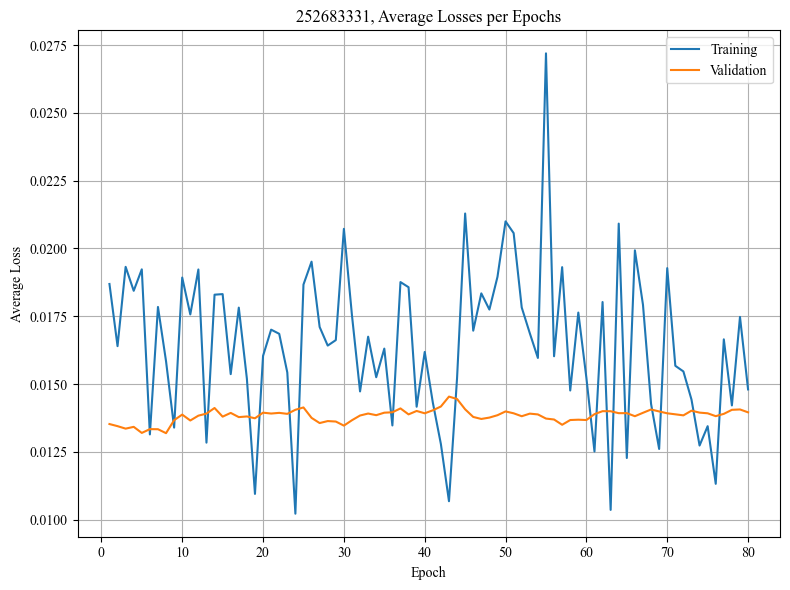

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007077
Epoch 1/80, Step 2/5, Train Loss: 0.007250
Epoch 1/80, Step 3/5, Train Loss: 0.017544
Epoch 1/80, Step 4/5, Train Loss: 0.014536
Epoch 1/80, Step 5/5, Train Loss: 0.017132
Epoch 1/80 complete. Train Loss: 0.012708, Val Loss: 0.006789
Epoch 2/80, Step 1/5, Train Loss: 0.026834
Epoch 2/80, Step 2/5, Train Loss: 0.014481
Epoch 2/80, Step 3/5, Train Loss: 0.008715
Epoch 2/80, Step 4/5, Train Loss: 0.009327
Epoch 2/80, Step 5/5, Train Loss: 0.014428
Epoch 2/80 complete. Train Loss: 0.014757, Val Loss: 0.006750
Epoch 3/80, Step 1/5, Train Loss: 0.018645
Epoch 3/80, Step 2/5, Train Loss: 0.007063
Epoch 3/80, Step 3/5, Train Loss: 0.019970
Epoch 3/80, Step 4/5, Train Loss: 0.017717
Epoch 3/80, Step 5/5, Train Loss: 0.022474
Epoch 3/80 complete. Train Loss: 0.017174, Val Loss: 0.006873
Epoch 4/80, Step 1/5, Train Loss: 0.012598
Epoch 4/80, Step 2/5, Train Loss: 0.026859
Epoch 4/80, Step 3/5, Train Loss: 0.013020
Epoch 4/80, Step 4/5, Train Loss: 0.0126

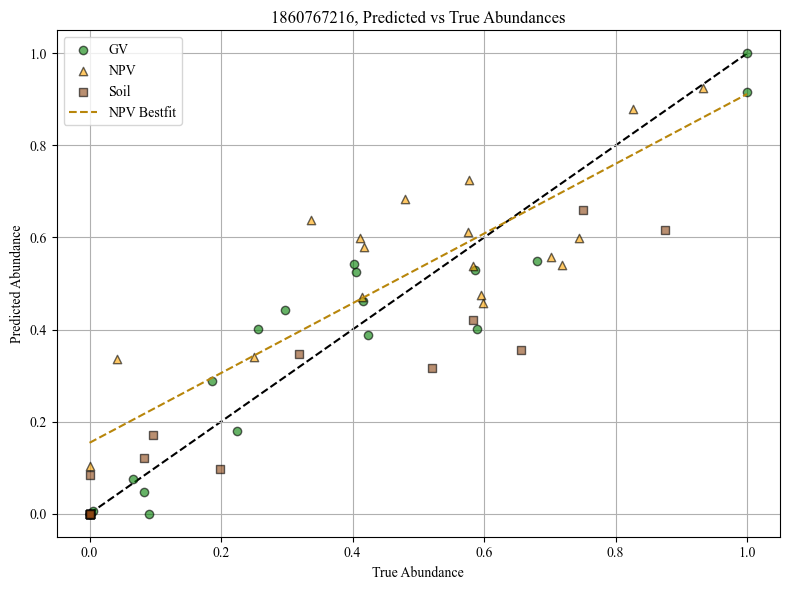

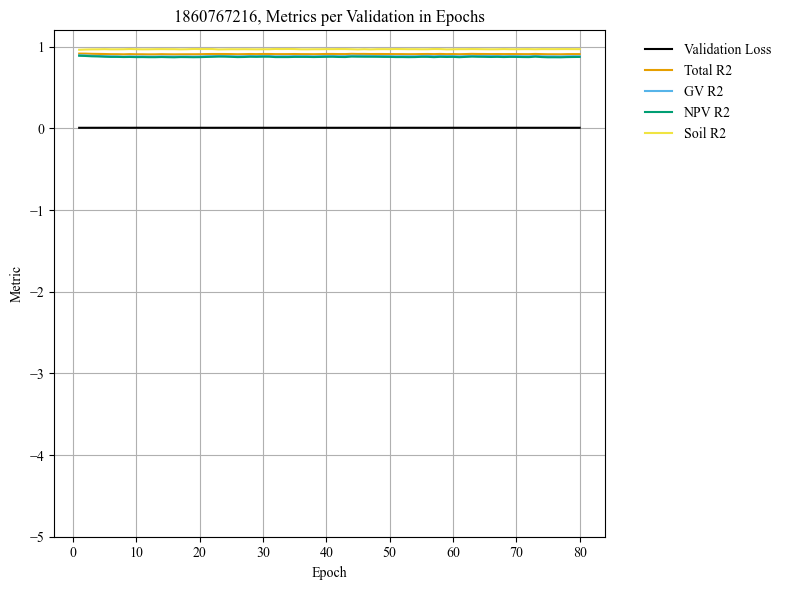

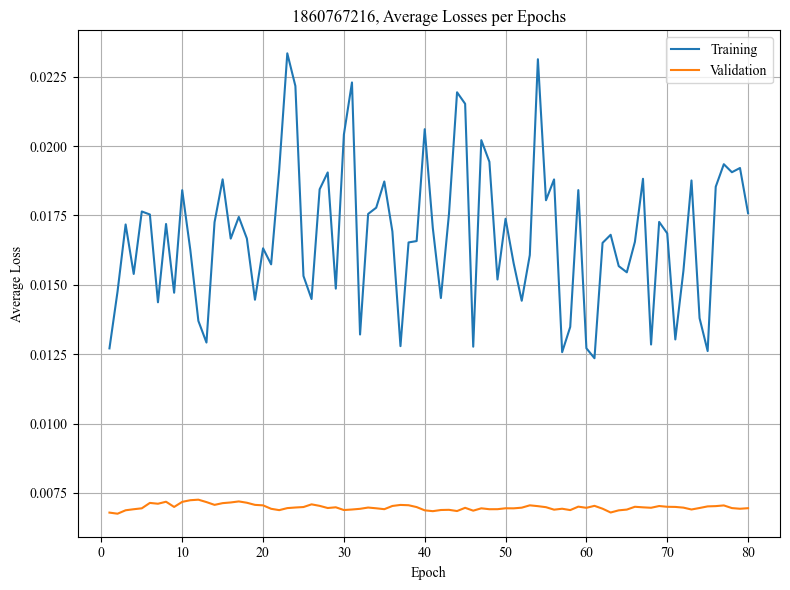

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012013
Epoch 1/80, Step 2/5, Train Loss: 0.013474
Epoch 1/80, Step 3/5, Train Loss: 0.006997
Epoch 1/80, Step 4/5, Train Loss: 0.016752
Epoch 1/80, Step 5/5, Train Loss: 0.010971
Epoch 1/80 complete. Train Loss: 0.012042, Val Loss: 0.006531
Epoch 2/80, Step 1/5, Train Loss: 0.008934
Epoch 2/80, Step 2/5, Train Loss: 0.013271
Epoch 2/80, Step 3/5, Train Loss: 0.026532
Epoch 2/80, Step 4/5, Train Loss: 0.018832
Epoch 2/80, Step 5/5, Train Loss: 0.019372
Epoch 2/80 complete. Train Loss: 0.017388, Val Loss: 0.006384
Epoch 3/80, Step 1/5, Train Loss: 0.013685
Epoch 3/80, Step 2/5, Train Loss: 0.017482
Epoch 3/80, Step 3/5, Train Loss: 0.015997
Epoch 3/80, Step 4/5, Train Loss: 0.015929
Epoch 3/80, Step 5/5, Train Loss: 0.026407
Epoch 3/80 complete. Train Loss: 0.017900, Val Loss: 0.006478
Epoch 4/80, Step 1/5, Train Loss: 0.018149
Epoch 4/80, Step 2/5, Train Loss: 0.008610
Epoch 4/80, Step 3/5, Train Loss: 0.018161
Epoch 4/80, Step 4/5, Train Loss: 0.0091

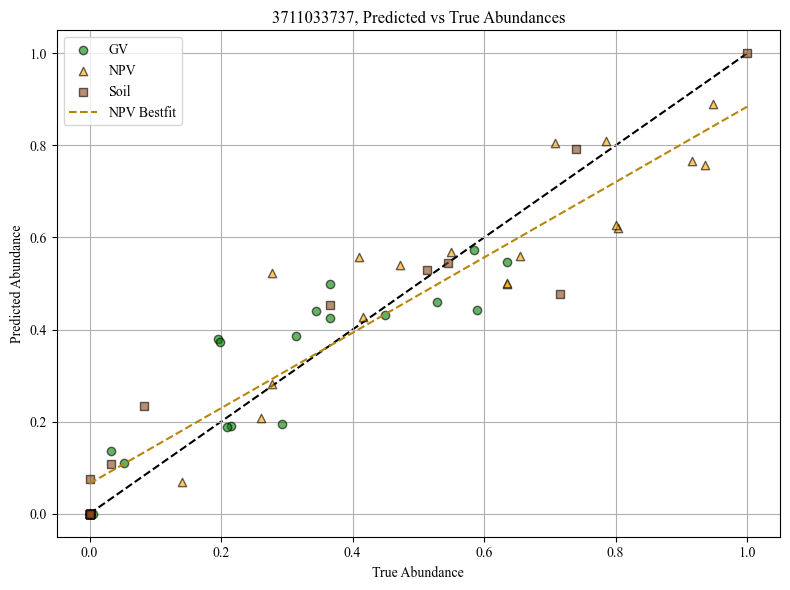

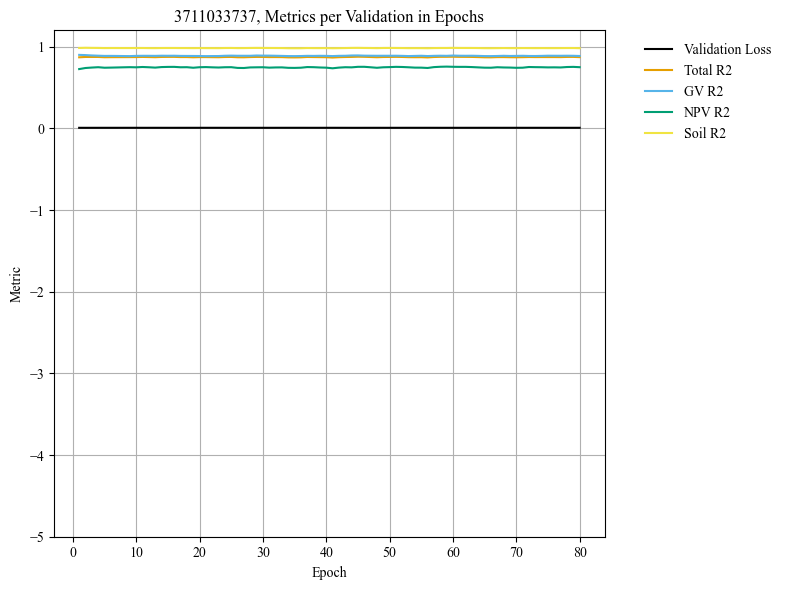

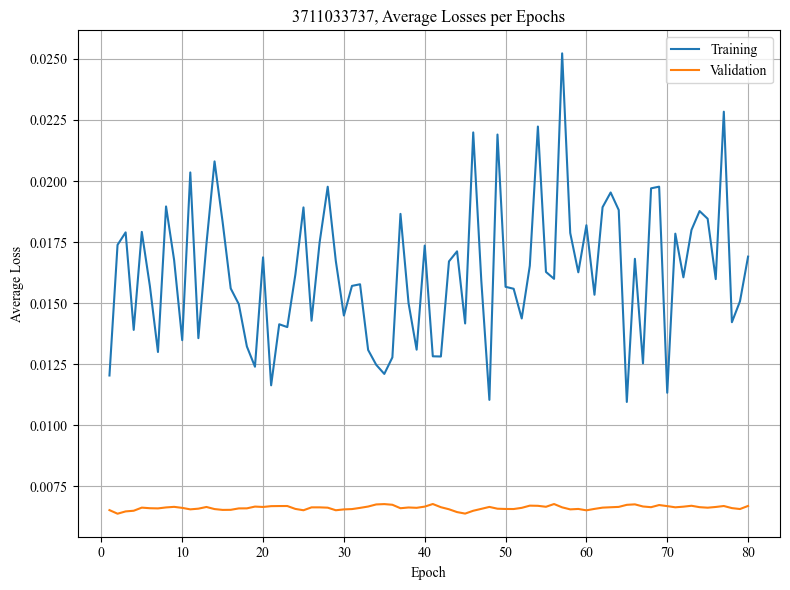

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010271
Epoch 1/80, Step 2/5, Train Loss: 0.017086
Epoch 1/80, Step 3/5, Train Loss: 0.007739
Epoch 1/80, Step 4/5, Train Loss: 0.020089
Epoch 1/80, Step 5/5, Train Loss: 0.018223
Epoch 1/80 complete. Train Loss: 0.014682, Val Loss: 0.006113
Epoch 2/80, Step 1/5, Train Loss: 0.009495
Epoch 2/80, Step 2/5, Train Loss: 0.043232
Epoch 2/80, Step 3/5, Train Loss: 0.015769
Epoch 2/80, Step 4/5, Train Loss: 0.011051
Epoch 2/80, Step 5/5, Train Loss: 0.010059
Epoch 2/80 complete. Train Loss: 0.017921, Val Loss: 0.005941
Epoch 3/80, Step 1/5, Train Loss: 0.010990
Epoch 3/80, Step 2/5, Train Loss: 0.051446
Epoch 3/80, Step 3/5, Train Loss: 0.015843
Epoch 3/80, Step 4/5, Train Loss: 0.020369
Epoch 3/80, Step 5/5, Train Loss: 0.045991
Epoch 3/80 complete. Train Loss: 0.028928, Val Loss: 0.005916
Epoch 4/80, Step 1/5, Train Loss: 0.025914
Epoch 4/80, Step 2/5, Train Loss: 0.023411
Epoch 4/80, Step 3/5, Train Loss: 0.007327
Epoch 4/80, Step 4/5, Train Loss: 0.0162

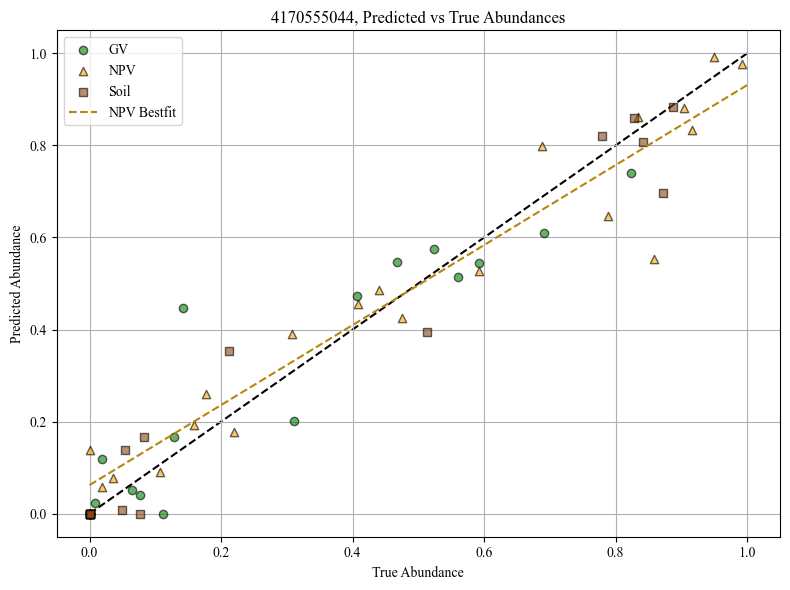

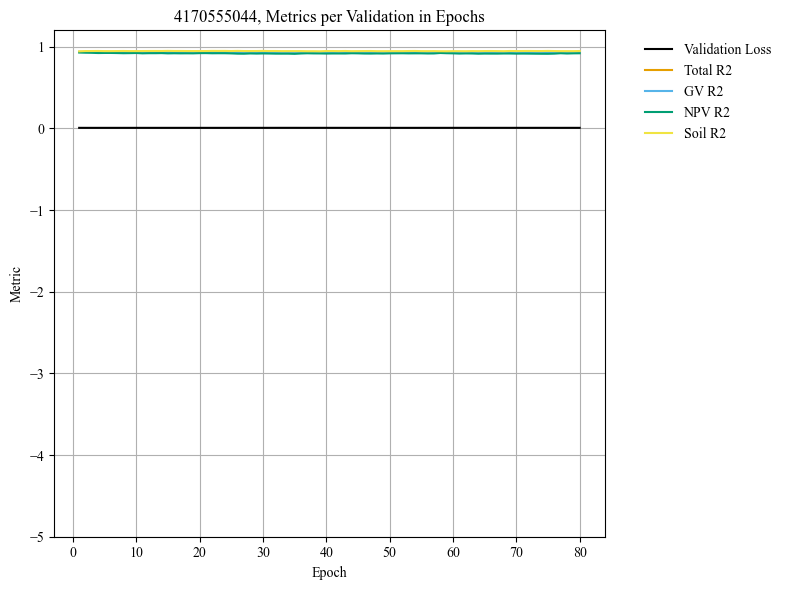

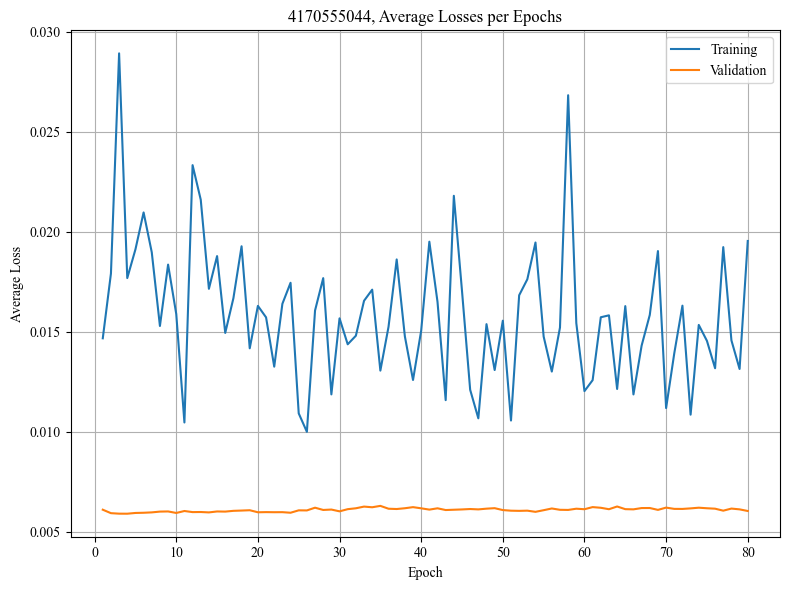

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021313
Epoch 1/80, Step 2/5, Train Loss: 0.019511
Epoch 1/80, Step 3/5, Train Loss: 0.027537
Epoch 1/80, Step 4/5, Train Loss: 0.014646
Epoch 1/80, Step 5/5, Train Loss: 0.016607
Epoch 1/80 complete. Train Loss: 0.019923, Val Loss: 0.007645
Epoch 2/80, Step 1/5, Train Loss: 0.009275
Epoch 2/80, Step 2/5, Train Loss: 0.015145
Epoch 2/80, Step 3/5, Train Loss: 0.006624
Epoch 2/80, Step 4/5, Train Loss: 0.012180
Epoch 2/80, Step 5/5, Train Loss: 0.016037
Epoch 2/80 complete. Train Loss: 0.011852, Val Loss: 0.007530
Epoch 3/80, Step 1/5, Train Loss: 0.011810
Epoch 3/80, Step 2/5, Train Loss: 0.010391
Epoch 3/80, Step 3/5, Train Loss: 0.025502
Epoch 3/80, Step 4/5, Train Loss: 0.025499
Epoch 3/80, Step 5/5, Train Loss: 0.011257
Epoch 3/80 complete. Train Loss: 0.016892, Val Loss: 0.007566
Epoch 4/80, Step 1/5, Train Loss: 0.022082
Epoch 4/80, Step 2/5, Train Loss: 0.013304
Epoch 4/80, Step 3/5, Train Loss: 0.012595
Epoch 4/80, Step 4/5, Train Loss: 0.0067

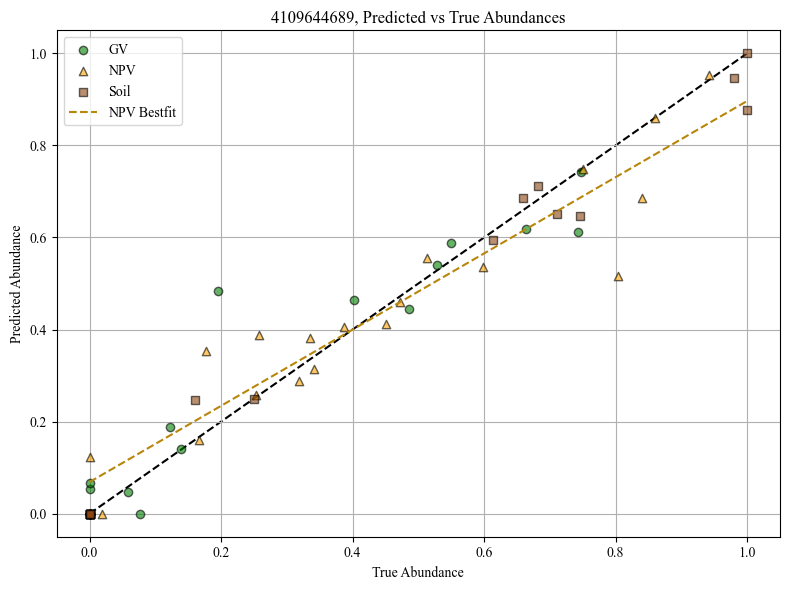

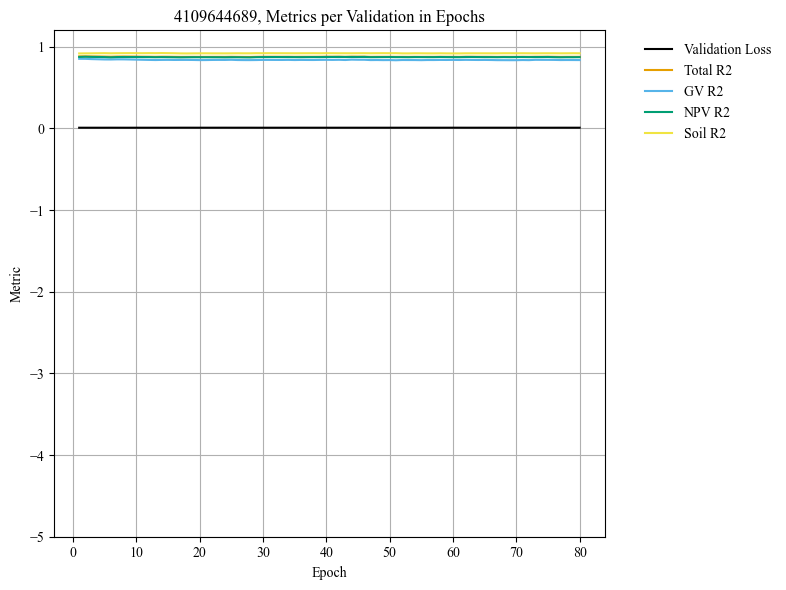

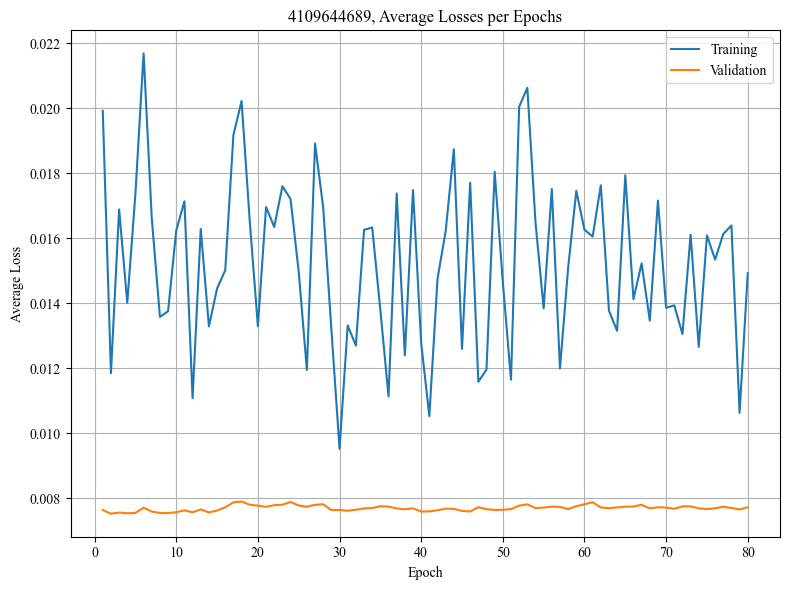

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007601
Epoch 1/80, Step 2/5, Train Loss: 0.014757
Epoch 1/80, Step 3/5, Train Loss: 0.035815
Epoch 1/80, Step 4/5, Train Loss: 0.013129
Epoch 1/80, Step 5/5, Train Loss: 0.008277
Epoch 1/80 complete. Train Loss: 0.015916, Val Loss: 0.006215
Epoch 2/80, Step 1/5, Train Loss: 0.017632
Epoch 2/80, Step 2/5, Train Loss: 0.024906
Epoch 2/80, Step 3/5, Train Loss: 0.020059
Epoch 2/80, Step 4/5, Train Loss: 0.023738
Epoch 2/80, Step 5/5, Train Loss: 0.005729
Epoch 2/80 complete. Train Loss: 0.018413, Val Loss: 0.006172
Epoch 3/80, Step 1/5, Train Loss: 0.014485
Epoch 3/80, Step 2/5, Train Loss: 0.007706
Epoch 3/80, Step 3/5, Train Loss: 0.034243
Epoch 3/80, Step 4/5, Train Loss: 0.010943
Epoch 3/80, Step 5/5, Train Loss: 0.036408
Epoch 3/80 complete. Train Loss: 0.020757, Val Loss: 0.006194
Epoch 4/80, Step 1/5, Train Loss: 0.009861
Epoch 4/80, Step 2/5, Train Loss: 0.014666
Epoch 4/80, Step 3/5, Train Loss: 0.006983
Epoch 4/80, Step 4/5, Train Loss: 0.0139

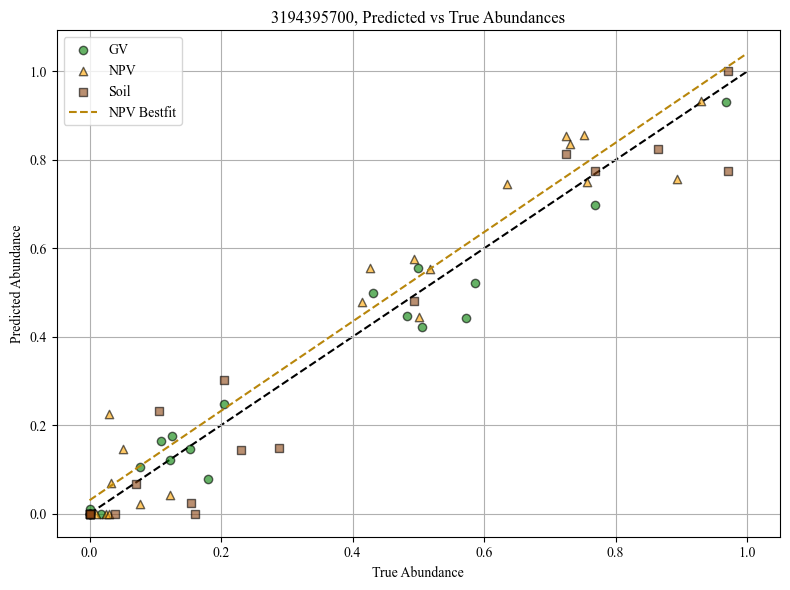

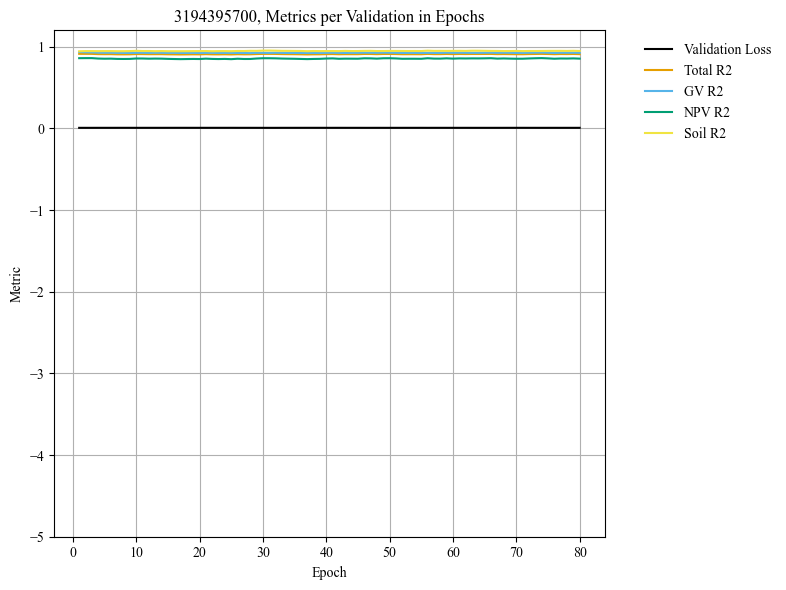

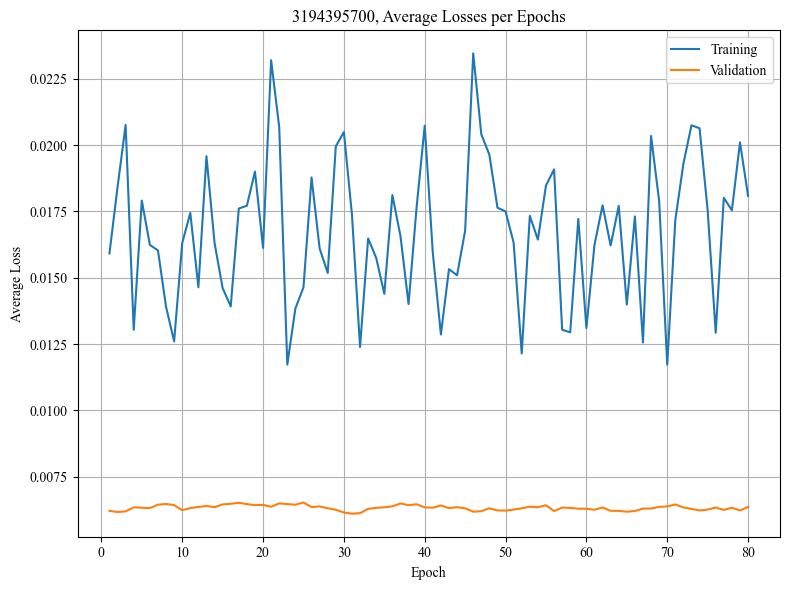

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009813
Epoch 1/80, Step 2/5, Train Loss: 0.025269
Epoch 1/80, Step 3/5, Train Loss: 0.033641
Epoch 1/80, Step 4/5, Train Loss: 0.016698
Epoch 1/80, Step 5/5, Train Loss: 0.033635
Epoch 1/80 complete. Train Loss: 0.023811, Val Loss: 0.010911
Epoch 2/80, Step 1/5, Train Loss: 0.011707
Epoch 2/80, Step 2/5, Train Loss: 0.015737
Epoch 2/80, Step 3/5, Train Loss: 0.016612
Epoch 2/80, Step 4/5, Train Loss: 0.019724
Epoch 2/80, Step 5/5, Train Loss: 0.014040
Epoch 2/80 complete. Train Loss: 0.015564, Val Loss: 0.010590
Epoch 3/80, Step 1/5, Train Loss: 0.012820
Epoch 3/80, Step 2/5, Train Loss: 0.034070
Epoch 3/80, Step 3/5, Train Loss: 0.010199
Epoch 3/80, Step 4/5, Train Loss: 0.027238
Epoch 3/80, Step 5/5, Train Loss: 0.017969
Epoch 3/80 complete. Train Loss: 0.020459, Val Loss: 0.010528
Epoch 4/80, Step 1/5, Train Loss: 0.021358
Epoch 4/80, Step 2/5, Train Loss: 0.010567
Epoch 4/80, Step 3/5, Train Loss: 0.037262
Epoch 4/80, Step 4/5, Train Loss: 0.0318

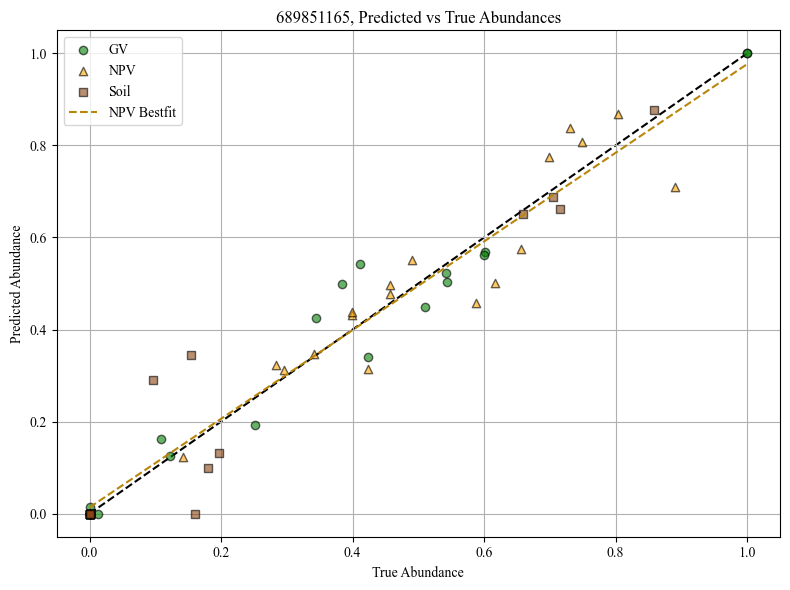

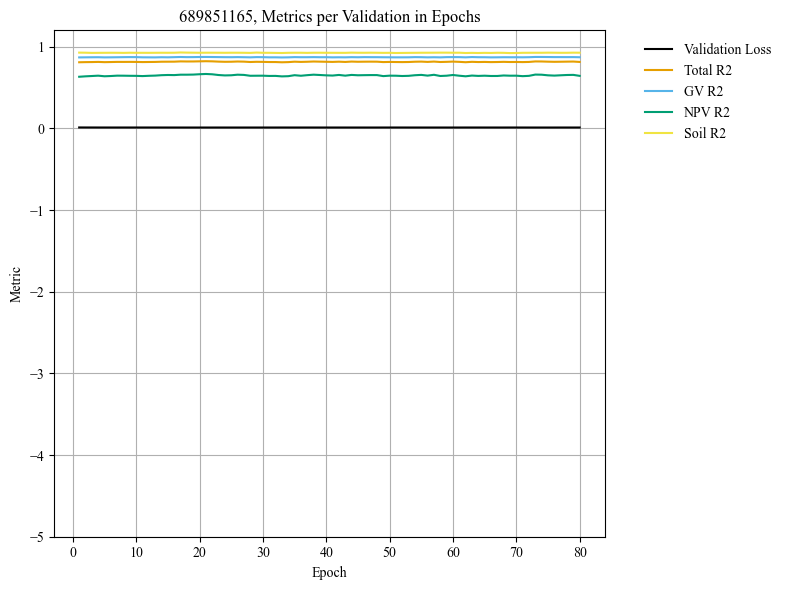

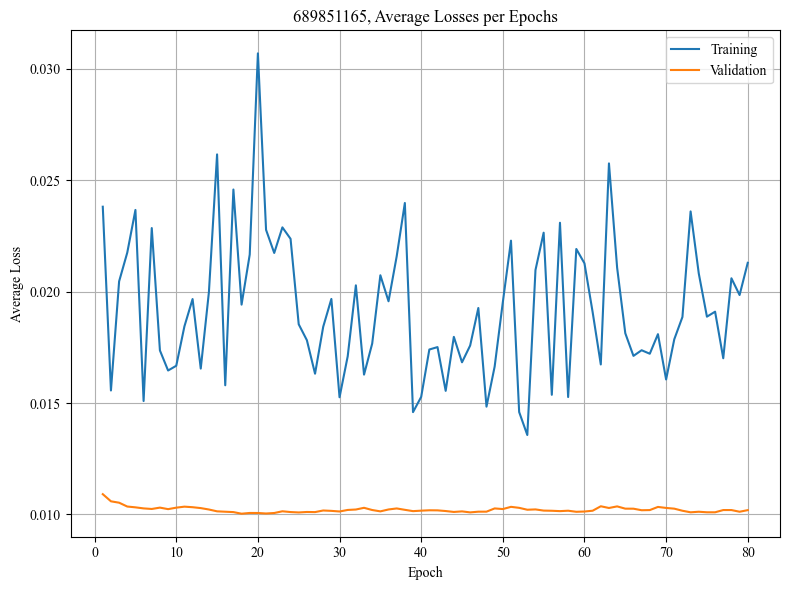

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012944
Epoch 1/80, Step 2/5, Train Loss: 0.017179
Epoch 1/80, Step 3/5, Train Loss: 0.019608
Epoch 1/80, Step 4/5, Train Loss: 0.005331
Epoch 1/80, Step 5/5, Train Loss: 0.010308
Epoch 1/80 complete. Train Loss: 0.013074, Val Loss: 0.007736
Epoch 2/80, Step 1/5, Train Loss: 0.013955
Epoch 2/80, Step 2/5, Train Loss: 0.015492
Epoch 2/80, Step 3/5, Train Loss: 0.011602
Epoch 2/80, Step 4/5, Train Loss: 0.012876
Epoch 2/80, Step 5/5, Train Loss: 0.020352
Epoch 2/80 complete. Train Loss: 0.014856, Val Loss: 0.007761
Epoch 3/80, Step 1/5, Train Loss: 0.019220
Epoch 3/80, Step 2/5, Train Loss: 0.005229
Epoch 3/80, Step 3/5, Train Loss: 0.006511
Epoch 3/80, Step 4/5, Train Loss: 0.011277
Epoch 3/80, Step 5/5, Train Loss: 0.024339
Epoch 3/80 complete. Train Loss: 0.013315, Val Loss: 0.007750
Epoch 4/80, Step 1/5, Train Loss: 0.017413
Epoch 4/80, Step 2/5, Train Loss: 0.011832
Epoch 4/80, Step 3/5, Train Loss: 0.012089
Epoch 4/80, Step 4/5, Train Loss: 0.0095

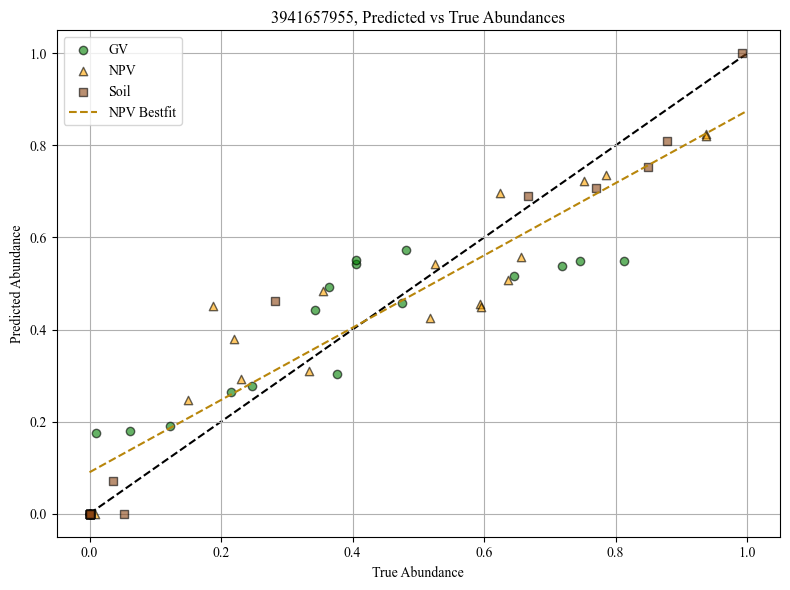

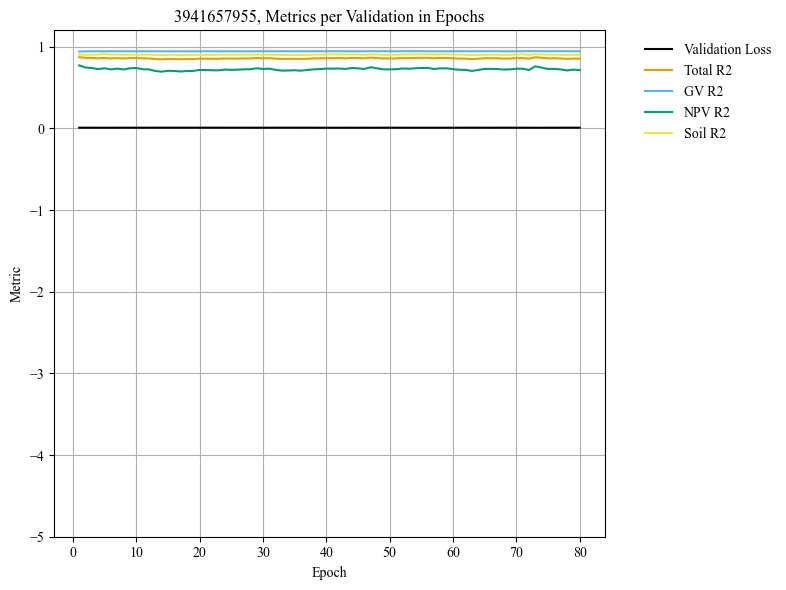

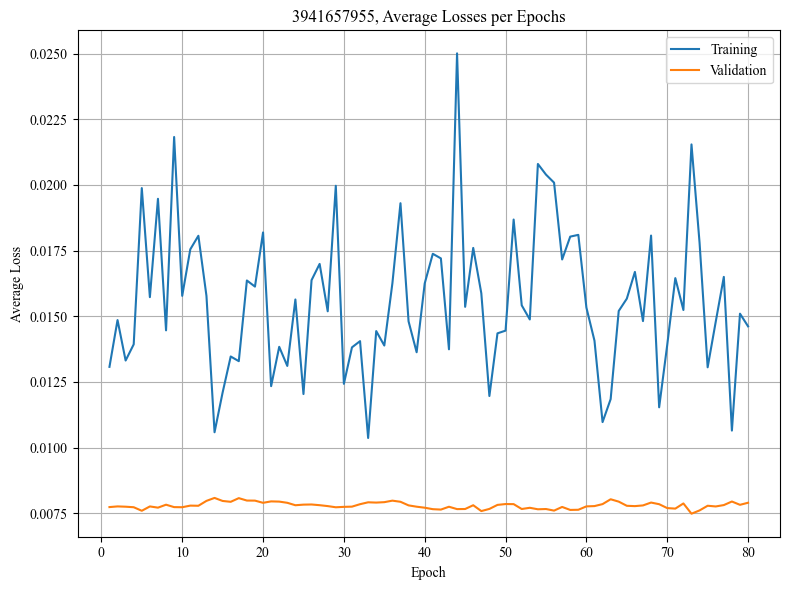

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011683
Epoch 1/80, Step 2/5, Train Loss: 0.017801
Epoch 1/80, Step 3/5, Train Loss: 0.010649
Epoch 1/80, Step 4/5, Train Loss: 0.009060
Epoch 1/80, Step 5/5, Train Loss: 0.018269
Epoch 1/80 complete. Train Loss: 0.013492, Val Loss: 0.005306
Epoch 2/80, Step 1/5, Train Loss: 0.014358
Epoch 2/80, Step 2/5, Train Loss: 0.014822
Epoch 2/80, Step 3/5, Train Loss: 0.012219
Epoch 2/80, Step 4/5, Train Loss: 0.012242
Epoch 2/80, Step 5/5, Train Loss: 0.017193
Epoch 2/80 complete. Train Loss: 0.014167, Val Loss: 0.005271
Epoch 3/80, Step 1/5, Train Loss: 0.008848
Epoch 3/80, Step 2/5, Train Loss: 0.026995
Epoch 3/80, Step 3/5, Train Loss: 0.008312
Epoch 3/80, Step 4/5, Train Loss: 0.014731
Epoch 3/80, Step 5/5, Train Loss: 0.014974
Epoch 3/80 complete. Train Loss: 0.014772, Val Loss: 0.005340
Epoch 4/80, Step 1/5, Train Loss: 0.008612
Epoch 4/80, Step 2/5, Train Loss: 0.007179
Epoch 4/80, Step 3/5, Train Loss: 0.011157
Epoch 4/80, Step 4/5, Train Loss: 0.0231

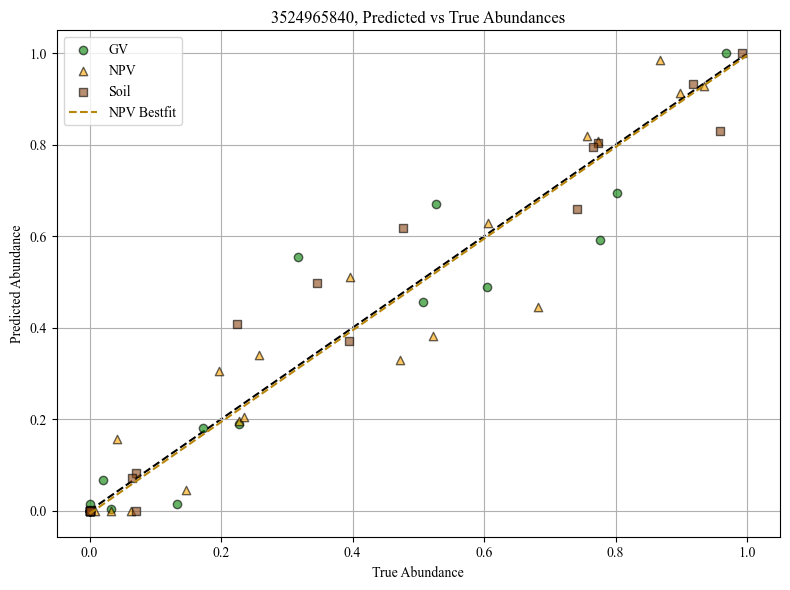

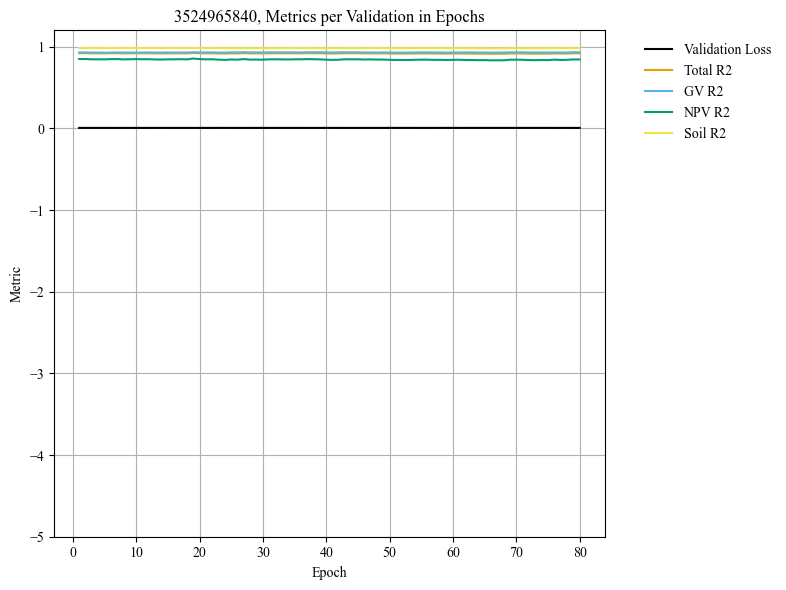

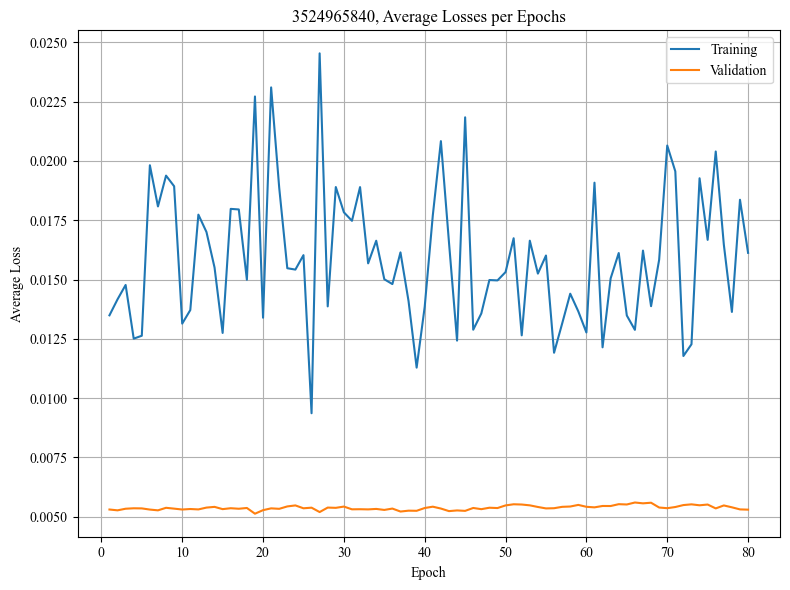

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.020169
Epoch 1/80, Step 2/5, Train Loss: 0.014339
Epoch 1/80, Step 3/5, Train Loss: 0.019950
Epoch 1/80, Step 4/5, Train Loss: 0.027777
Epoch 1/80, Step 5/5, Train Loss: 0.030580
Epoch 1/80 complete. Train Loss: 0.022563, Val Loss: 0.013598
Epoch 2/80, Step 1/5, Train Loss: 0.023620
Epoch 2/80, Step 2/5, Train Loss: 0.011956
Epoch 2/80, Step 3/5, Train Loss: 0.018749
Epoch 2/80, Step 4/5, Train Loss: 0.016709
Epoch 2/80, Step 5/5, Train Loss: 0.025137
Epoch 2/80 complete. Train Loss: 0.019234, Val Loss: 0.013143
Epoch 3/80, Step 1/5, Train Loss: 0.020381
Epoch 3/80, Step 2/5, Train Loss: 0.010924
Epoch 3/80, Step 3/5, Train Loss: 0.017166
Epoch 3/80, Step 4/5, Train Loss: 0.017499
Epoch 3/80, Step 5/5, Train Loss: 0.009451
Epoch 3/80 complete. Train Loss: 0.015084, Val Loss: 0.012922
Epoch 4/80, Step 1/5, Train Loss: 0.031625
Epoch 4/80, Step 2/5, Train Loss: 0.022773
Epoch 4/80, Step 3/5, Train Loss: 0.019248
Epoch 4/80, Step 4/5, Train Loss: 0.0092

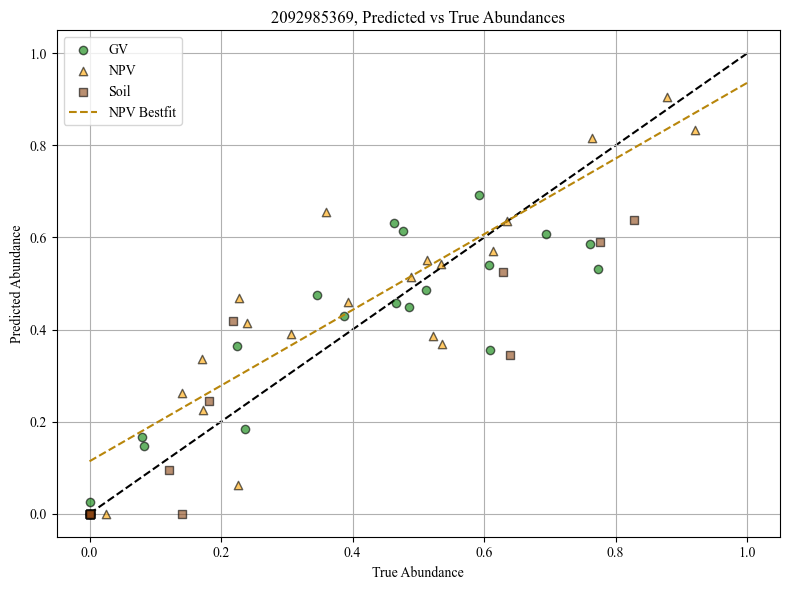

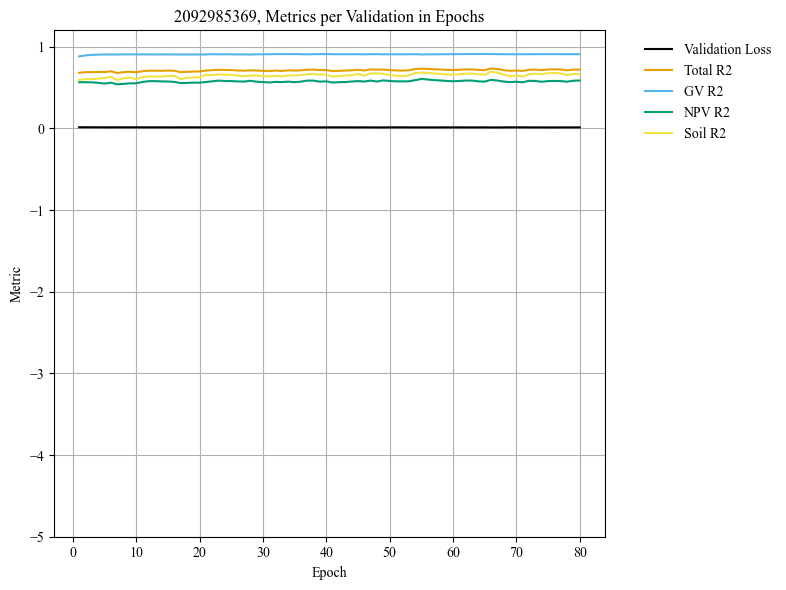

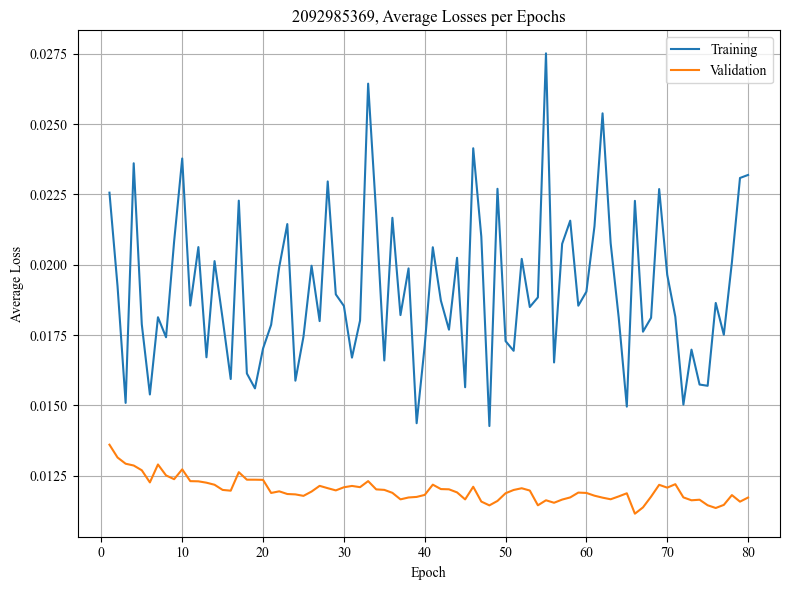

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021293
Epoch 1/80, Step 2/5, Train Loss: 0.010210
Epoch 1/80, Step 3/5, Train Loss: 0.014788
Epoch 1/80, Step 4/5, Train Loss: 0.029048
Epoch 1/80, Step 5/5, Train Loss: 0.012082
Epoch 1/80 complete. Train Loss: 0.017484, Val Loss: 0.021321
Epoch 2/80, Step 1/5, Train Loss: 0.007340
Epoch 2/80, Step 2/5, Train Loss: 0.036060
Epoch 2/80, Step 3/5, Train Loss: 0.027337
Epoch 2/80, Step 4/5, Train Loss: 0.028407
Epoch 2/80, Step 5/5, Train Loss: 0.018220
Epoch 2/80 complete. Train Loss: 0.023473, Val Loss: 0.020994
Epoch 3/80, Step 1/5, Train Loss: 0.036274
Epoch 3/80, Step 2/5, Train Loss: 0.018115
Epoch 3/80, Step 3/5, Train Loss: 0.025479
Epoch 3/80, Step 4/5, Train Loss: 0.027143
Epoch 3/80, Step 5/5, Train Loss: 0.020500
Epoch 3/80 complete. Train Loss: 0.025502, Val Loss: 0.020912
Epoch 4/80, Step 1/5, Train Loss: 0.014190
Epoch 4/80, Step 2/5, Train Loss: 0.026104
Epoch 4/80, Step 3/5, Train Loss: 0.036842
Epoch 4/80, Step 4/5, Train Loss: 0.0319

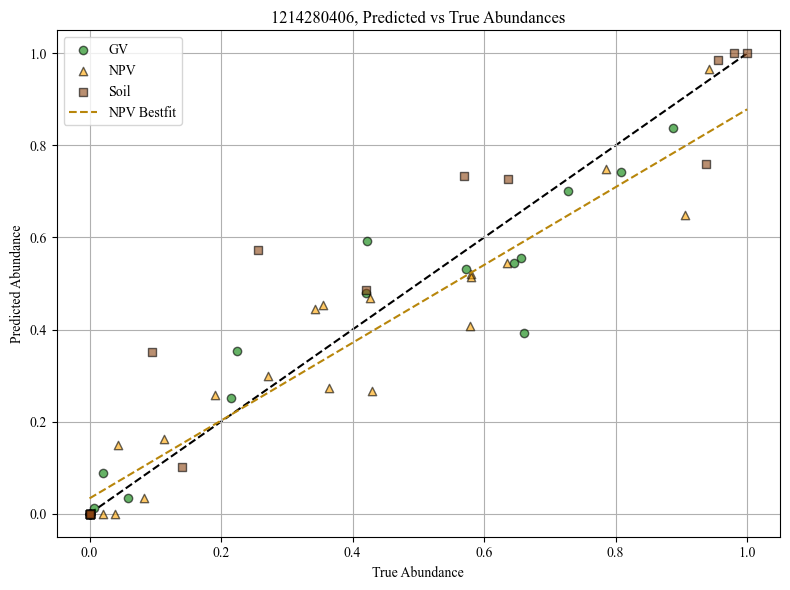

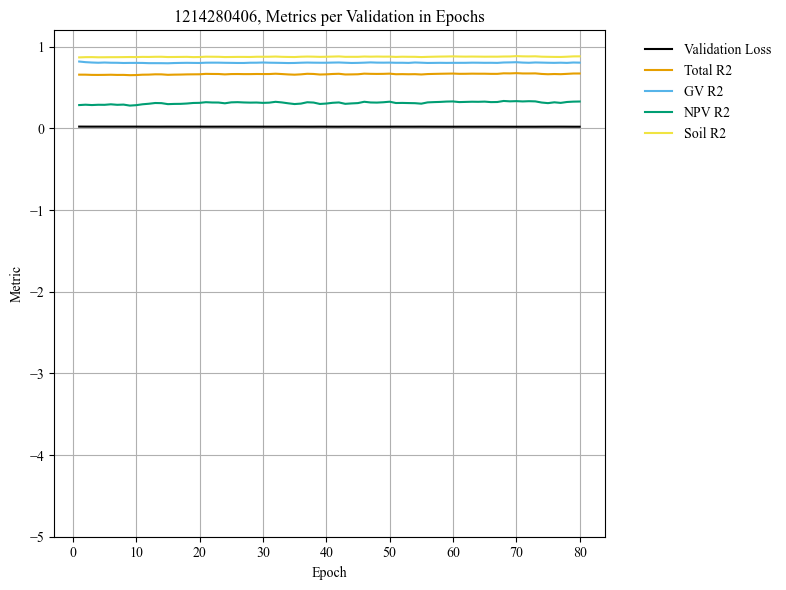

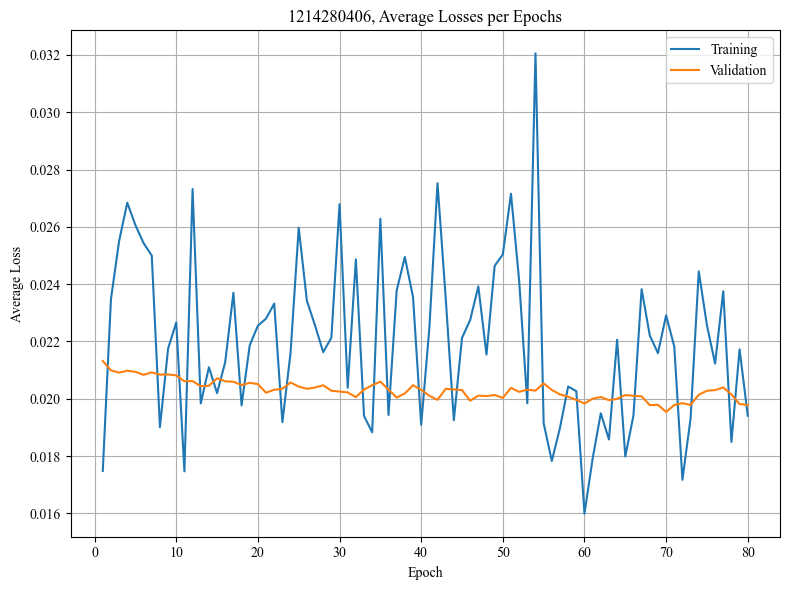

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019614
Epoch 1/80, Step 2/5, Train Loss: 0.013418
Epoch 1/80, Step 3/5, Train Loss: 0.012080
Epoch 1/80, Step 4/5, Train Loss: 0.006952
Epoch 1/80, Step 5/5, Train Loss: 0.016881
Epoch 1/80 complete. Train Loss: 0.013789, Val Loss: 0.008587
Epoch 2/80, Step 1/5, Train Loss: 0.025549
Epoch 2/80, Step 2/5, Train Loss: 0.011029
Epoch 2/80, Step 3/5, Train Loss: 0.006584
Epoch 2/80, Step 4/5, Train Loss: 0.010163
Epoch 2/80, Step 5/5, Train Loss: 0.010780
Epoch 2/80 complete. Train Loss: 0.012821, Val Loss: 0.008597
Epoch 3/80, Step 1/5, Train Loss: 0.014084
Epoch 3/80, Step 2/5, Train Loss: 0.007297
Epoch 3/80, Step 3/5, Train Loss: 0.005522
Epoch 3/80, Step 4/5, Train Loss: 0.014820
Epoch 3/80, Step 5/5, Train Loss: 0.011849
Epoch 3/80 complete. Train Loss: 0.010715, Val Loss: 0.008734
Epoch 4/80, Step 1/5, Train Loss: 0.014971
Epoch 4/80, Step 2/5, Train Loss: 0.010412
Epoch 4/80, Step 3/5, Train Loss: 0.009257
Epoch 4/80, Step 4/5, Train Loss: 0.0116

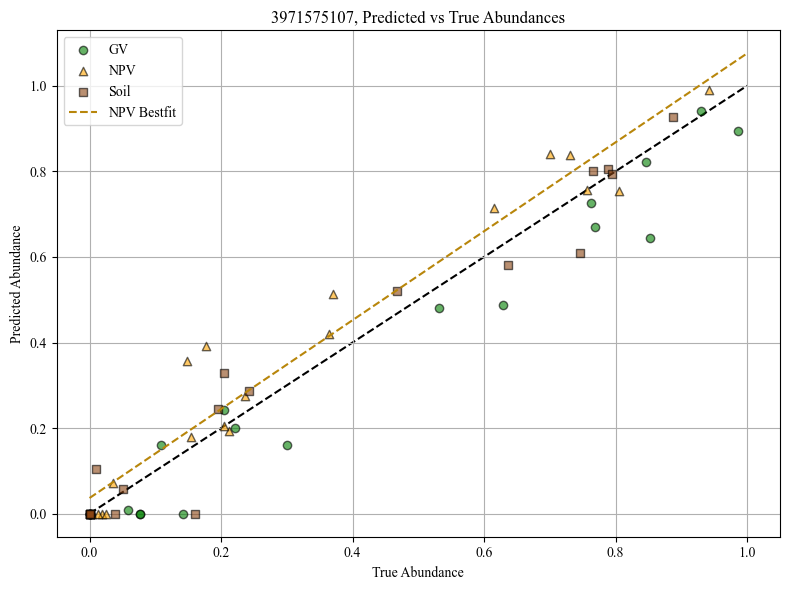

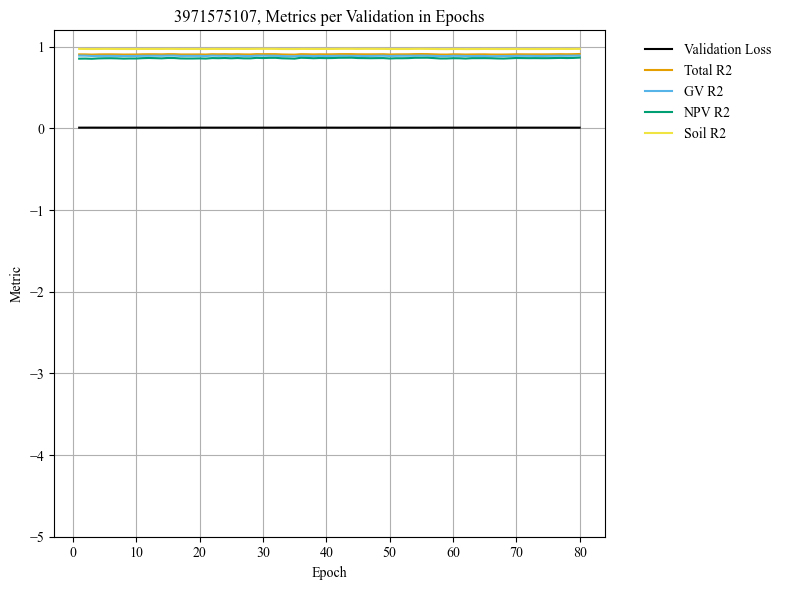

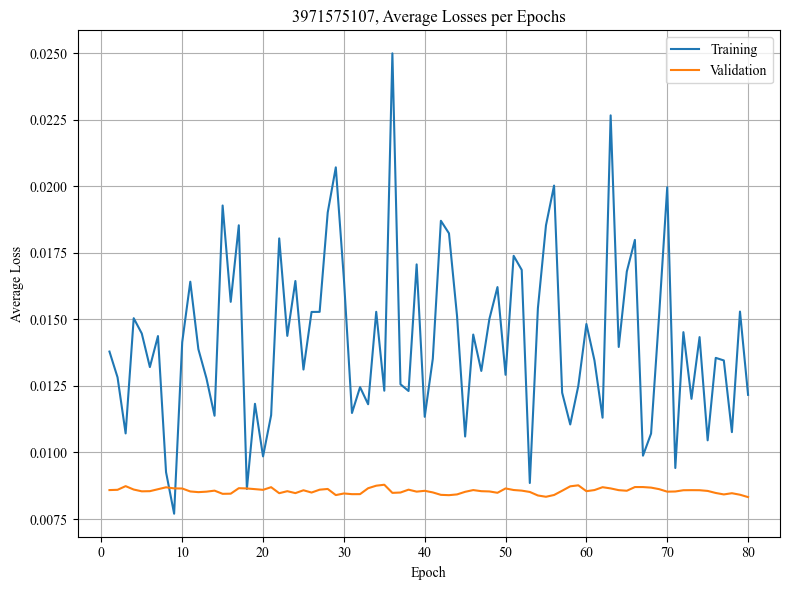

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.014159
Epoch 1/80, Step 2/5, Train Loss: 0.008118
Epoch 1/80, Step 3/5, Train Loss: 0.020244
Epoch 1/80, Step 4/5, Train Loss: 0.013065
Epoch 1/80, Step 5/5, Train Loss: 0.024642
Epoch 1/80 complete. Train Loss: 0.016046, Val Loss: 0.006609
Epoch 2/80, Step 1/5, Train Loss: 0.029596
Epoch 2/80, Step 2/5, Train Loss: 0.009803
Epoch 2/80, Step 3/5, Train Loss: 0.016152
Epoch 2/80, Step 4/5, Train Loss: 0.022459
Epoch 2/80, Step 5/5, Train Loss: 0.015556
Epoch 2/80 complete. Train Loss: 0.018713, Val Loss: 0.006458
Epoch 3/80, Step 1/5, Train Loss: 0.021658
Epoch 3/80, Step 2/5, Train Loss: 0.011977
Epoch 3/80, Step 3/5, Train Loss: 0.024669
Epoch 3/80, Step 4/5, Train Loss: 0.017393
Epoch 3/80, Step 5/5, Train Loss: 0.021248
Epoch 3/80 complete. Train Loss: 0.019389, Val Loss: 0.006541
Epoch 4/80, Step 1/5, Train Loss: 0.009858
Epoch 4/80, Step 2/5, Train Loss: 0.012078
Epoch 4/80, Step 3/5, Train Loss: 0.014200
Epoch 4/80, Step 4/5, Train Loss: 0.0157

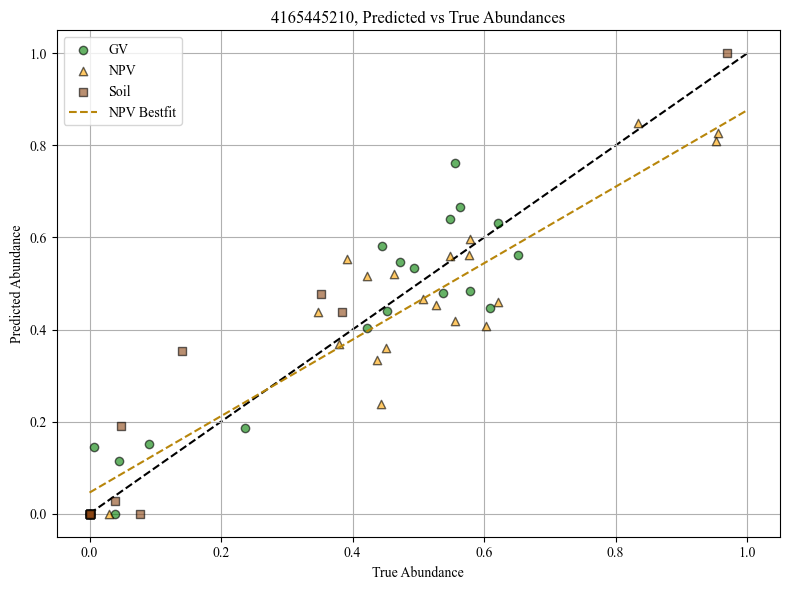

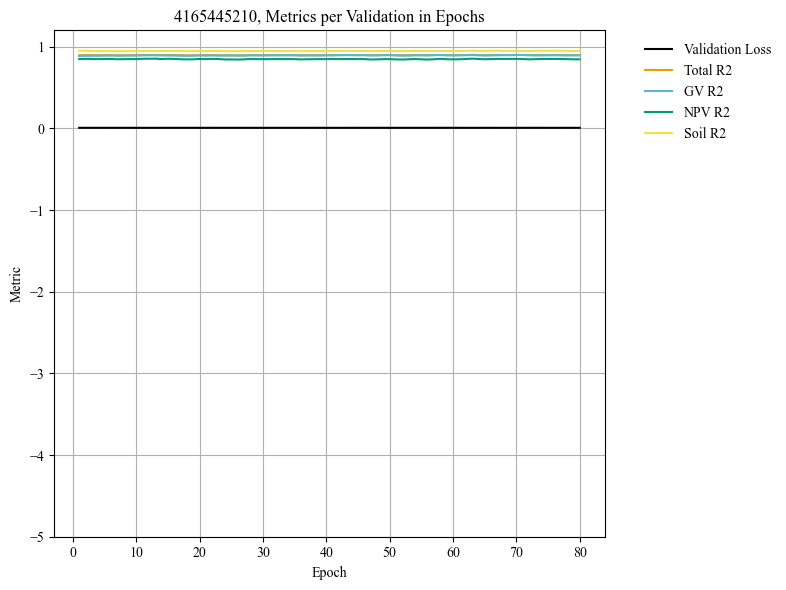

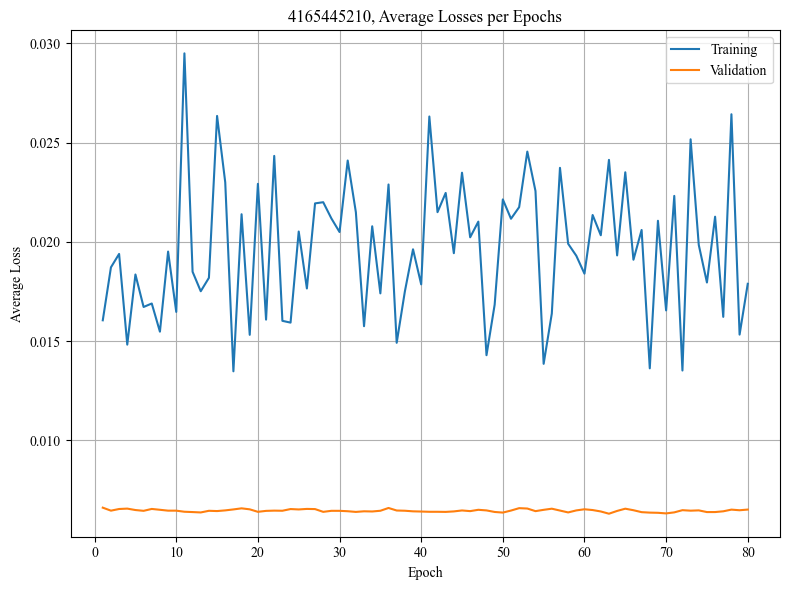

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018959
Epoch 1/80, Step 2/5, Train Loss: 0.018371
Epoch 1/80, Step 3/5, Train Loss: 0.026263
Epoch 1/80, Step 4/5, Train Loss: 0.013795
Epoch 1/80, Step 5/5, Train Loss: 0.027786
Epoch 1/80 complete. Train Loss: 0.021035, Val Loss: 0.014184
Epoch 2/80, Step 1/5, Train Loss: 0.023639
Epoch 2/80, Step 2/5, Train Loss: 0.012835
Epoch 2/80, Step 3/5, Train Loss: 0.009898
Epoch 2/80, Step 4/5, Train Loss: 0.024134
Epoch 2/80, Step 5/5, Train Loss: 0.009664
Epoch 2/80 complete. Train Loss: 0.016034, Val Loss: 0.014312
Epoch 3/80, Step 1/5, Train Loss: 0.029128
Epoch 3/80, Step 2/5, Train Loss: 0.019404
Epoch 3/80, Step 3/5, Train Loss: 0.023076
Epoch 3/80, Step 4/5, Train Loss: 0.009559
Epoch 3/80, Step 5/5, Train Loss: 0.016663
Epoch 3/80 complete. Train Loss: 0.019566, Val Loss: 0.014055
Epoch 4/80, Step 1/5, Train Loss: 0.014022
Epoch 4/80, Step 2/5, Train Loss: 0.029363
Epoch 4/80, Step 3/5, Train Loss: 0.028839
Epoch 4/80, Step 4/5, Train Loss: 0.0193

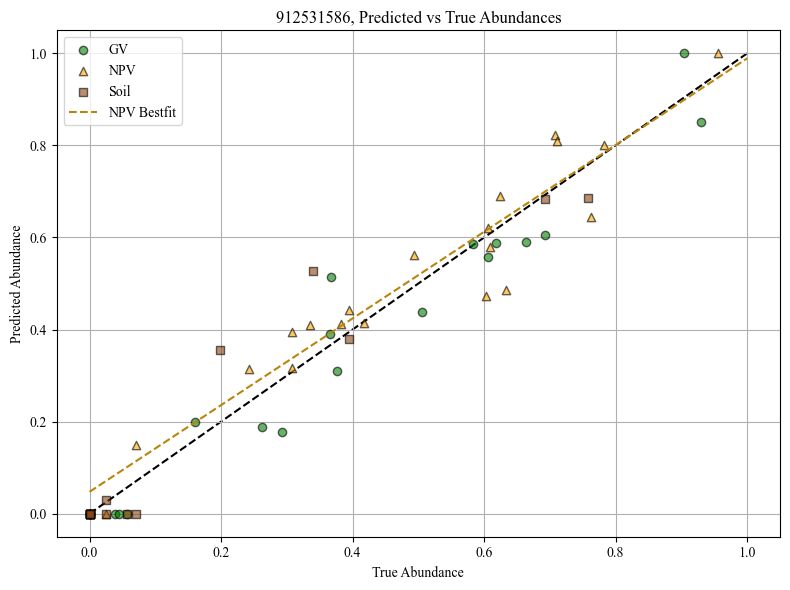

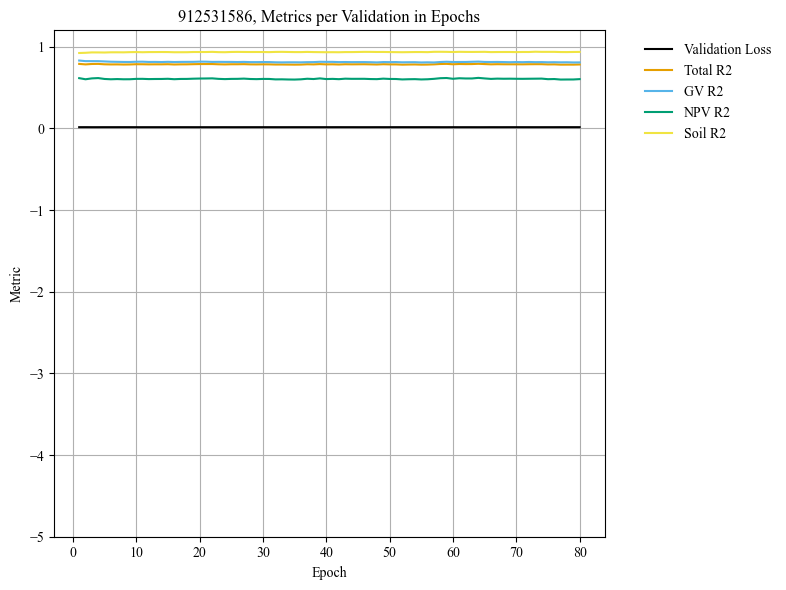

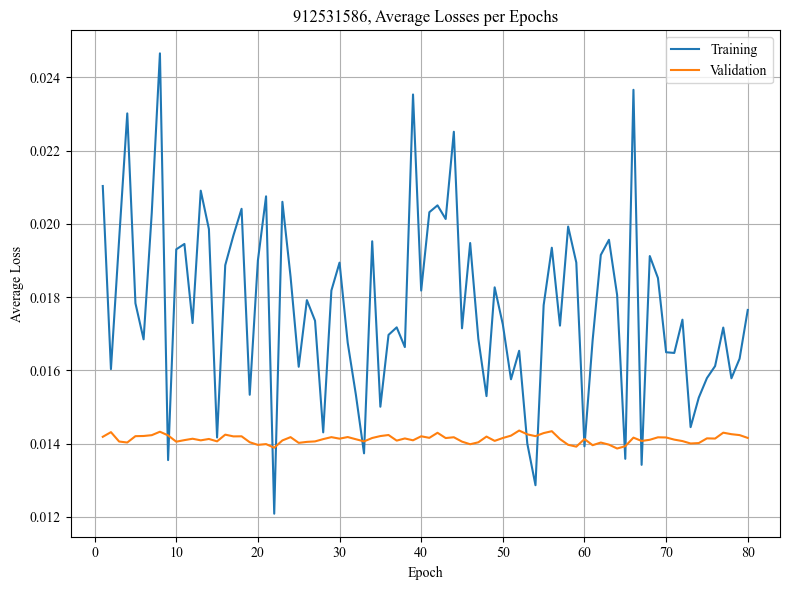

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.020827
Epoch 1/80, Step 2/5, Train Loss: 0.014521
Epoch 1/80, Step 3/5, Train Loss: 0.018657
Epoch 1/80, Step 4/5, Train Loss: 0.021244
Epoch 1/80, Step 5/5, Train Loss: 0.010961
Epoch 1/80 complete. Train Loss: 0.017242, Val Loss: 0.007031
Epoch 2/80, Step 1/5, Train Loss: 0.023685
Epoch 2/80, Step 2/5, Train Loss: 0.016007
Epoch 2/80, Step 3/5, Train Loss: 0.013786
Epoch 2/80, Step 4/5, Train Loss: 0.016778
Epoch 2/80, Step 5/5, Train Loss: 0.018840
Epoch 2/80 complete. Train Loss: 0.017819, Val Loss: 0.007118
Epoch 3/80, Step 1/5, Train Loss: 0.018128
Epoch 3/80, Step 2/5, Train Loss: 0.017635
Epoch 3/80, Step 3/5, Train Loss: 0.010951
Epoch 3/80, Step 4/5, Train Loss: 0.007429
Epoch 3/80, Step 5/5, Train Loss: 0.017543
Epoch 3/80 complete. Train Loss: 0.014337, Val Loss: 0.007371
Epoch 4/80, Step 1/5, Train Loss: 0.010576
Epoch 4/80, Step 2/5, Train Loss: 0.013114
Epoch 4/80, Step 3/5, Train Loss: 0.024902
Epoch 4/80, Step 4/5, Train Loss: 0.0275

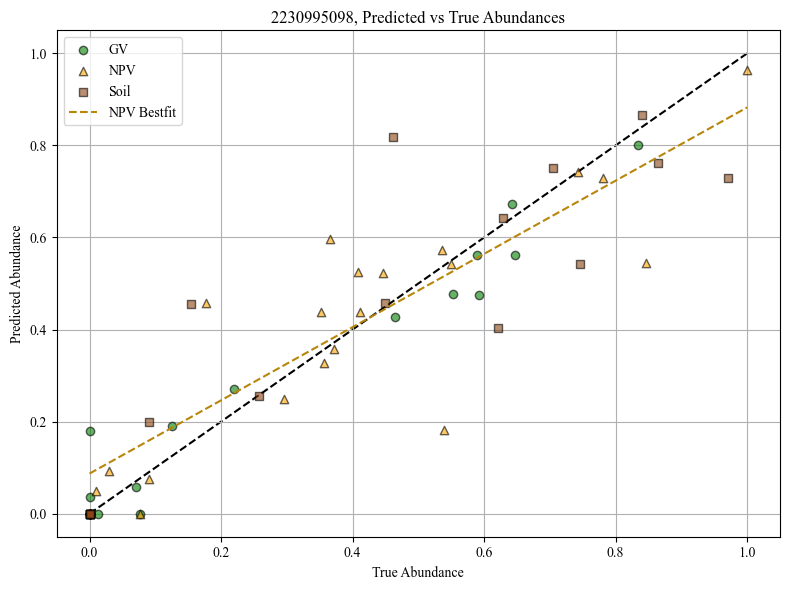

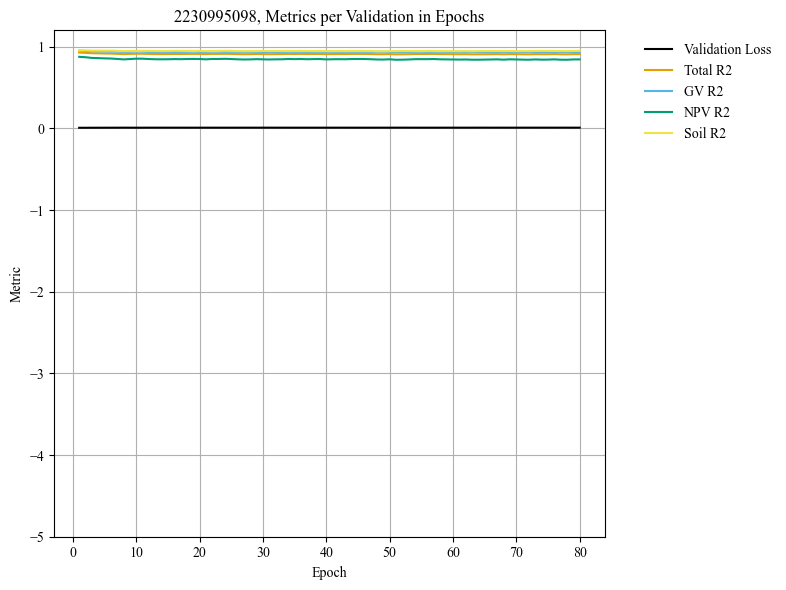

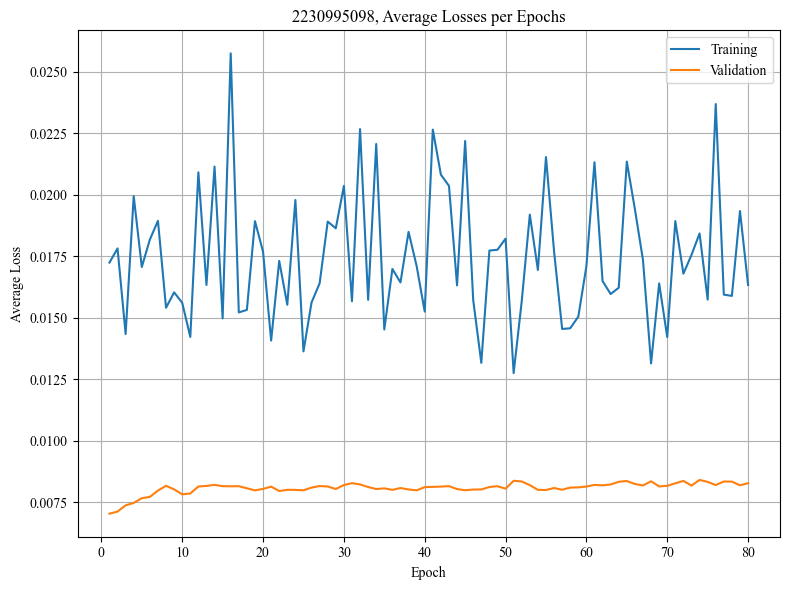

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.024709
Epoch 1/80, Step 2/5, Train Loss: 0.016127
Epoch 1/80, Step 3/5, Train Loss: 0.014533
Epoch 1/80, Step 4/5, Train Loss: 0.014111
Epoch 1/80, Step 5/5, Train Loss: 0.016996
Epoch 1/80 complete. Train Loss: 0.017295, Val Loss: 0.011123
Epoch 2/80, Step 1/5, Train Loss: 0.020032
Epoch 2/80, Step 2/5, Train Loss: 0.022269
Epoch 2/80, Step 3/5, Train Loss: 0.014738
Epoch 2/80, Step 4/5, Train Loss: 0.019862
Epoch 2/80, Step 5/5, Train Loss: 0.010029
Epoch 2/80 complete. Train Loss: 0.017386, Val Loss: 0.011034
Epoch 3/80, Step 1/5, Train Loss: 0.016260
Epoch 3/80, Step 2/5, Train Loss: 0.015849
Epoch 3/80, Step 3/5, Train Loss: 0.023998
Epoch 3/80, Step 4/5, Train Loss: 0.015018
Epoch 3/80, Step 5/5, Train Loss: 0.024747
Epoch 3/80 complete. Train Loss: 0.019174, Val Loss: 0.011153
Epoch 4/80, Step 1/5, Train Loss: 0.013742
Epoch 4/80, Step 2/5, Train Loss: 0.009907
Epoch 4/80, Step 3/5, Train Loss: 0.016092
Epoch 4/80, Step 4/5, Train Loss: 0.0208

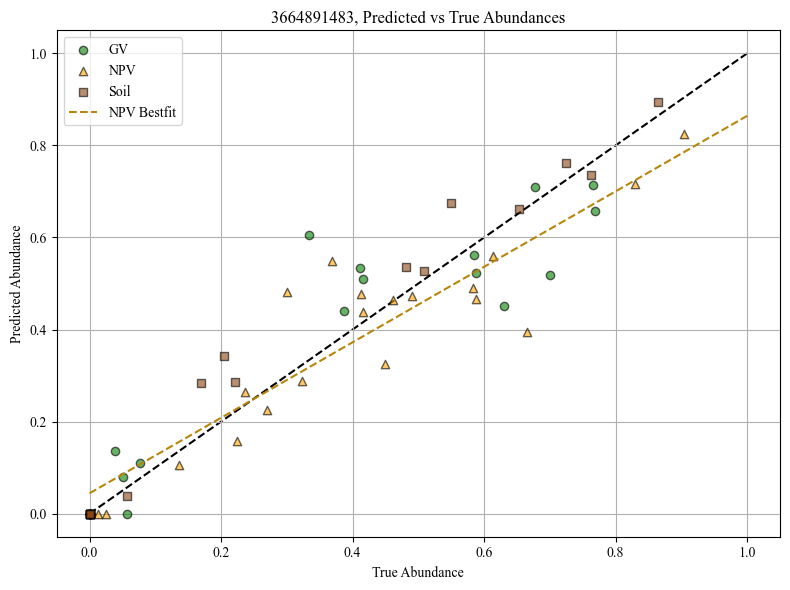

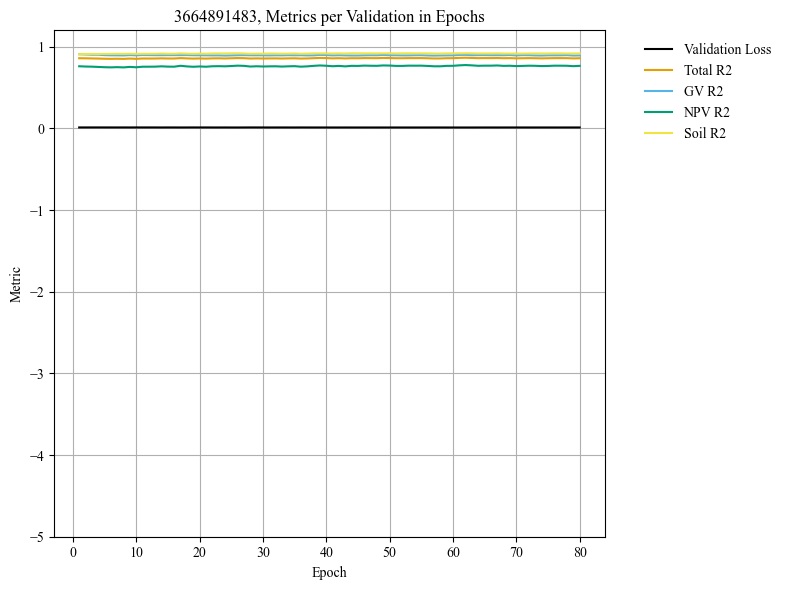

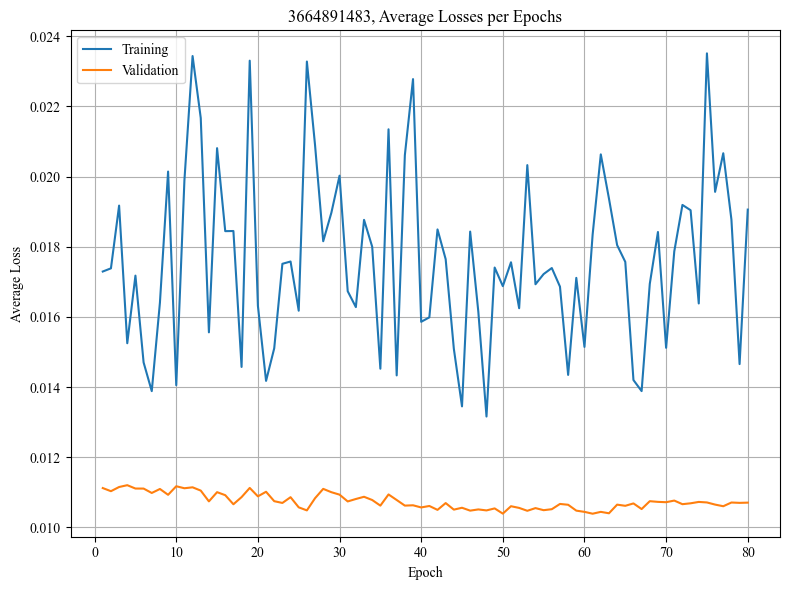

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.014054
Epoch 1/80, Step 2/5, Train Loss: 0.021852
Epoch 1/80, Step 3/5, Train Loss: 0.016689
Epoch 1/80, Step 4/5, Train Loss: 0.012281
Epoch 1/80, Step 5/5, Train Loss: 0.025209
Epoch 1/80 complete. Train Loss: 0.018017, Val Loss: 0.005932
Epoch 2/80, Step 1/5, Train Loss: 0.020686
Epoch 2/80, Step 2/5, Train Loss: 0.018672
Epoch 2/80, Step 3/5, Train Loss: 0.007058
Epoch 2/80, Step 4/5, Train Loss: 0.035723
Epoch 2/80, Step 5/5, Train Loss: 0.019438
Epoch 2/80 complete. Train Loss: 0.020315, Val Loss: 0.005840
Epoch 3/80, Step 1/5, Train Loss: 0.010675
Epoch 3/80, Step 2/5, Train Loss: 0.011800
Epoch 3/80, Step 3/5, Train Loss: 0.024566
Epoch 3/80, Step 4/5, Train Loss: 0.016981
Epoch 3/80, Step 5/5, Train Loss: 0.013177
Epoch 3/80 complete. Train Loss: 0.015440, Val Loss: 0.005783
Epoch 4/80, Step 1/5, Train Loss: 0.012065
Epoch 4/80, Step 2/5, Train Loss: 0.010177
Epoch 4/80, Step 3/5, Train Loss: 0.035694
Epoch 4/80, Step 4/5, Train Loss: 0.0096

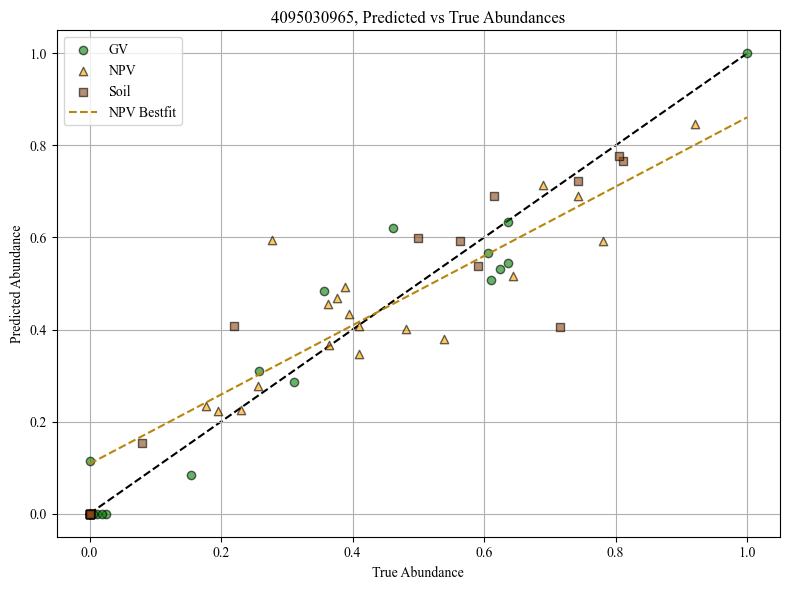

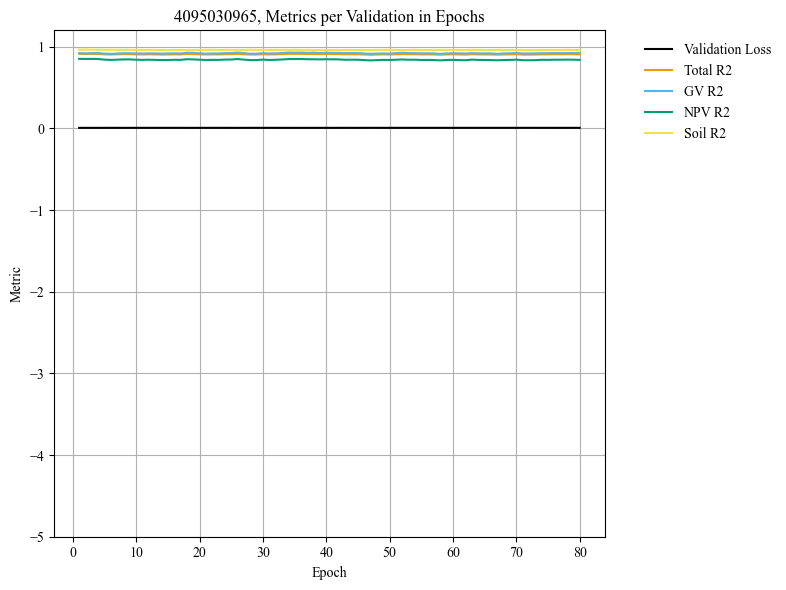

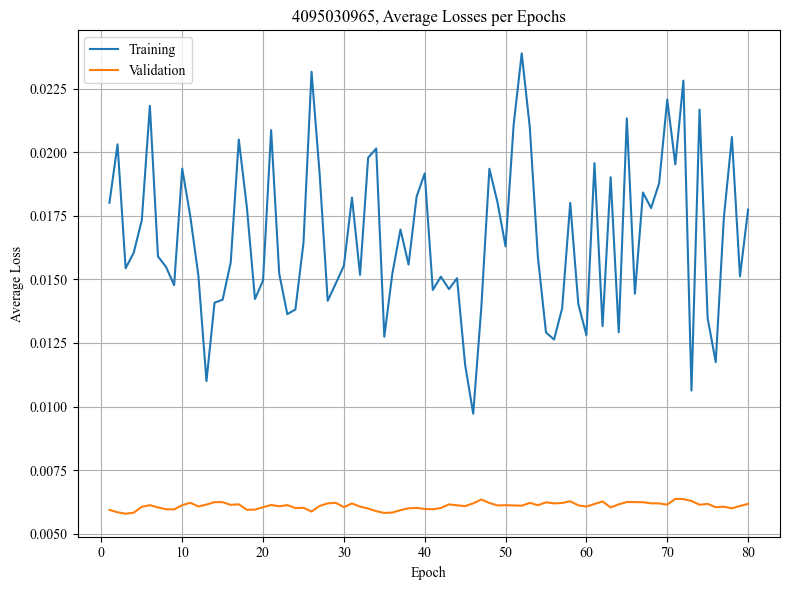

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021077
Epoch 1/80, Step 2/5, Train Loss: 0.009230
Epoch 1/80, Step 3/5, Train Loss: 0.027972
Epoch 1/80, Step 4/5, Train Loss: 0.006435
Epoch 1/80, Step 5/5, Train Loss: 0.038704
Epoch 1/80 complete. Train Loss: 0.020684, Val Loss: 0.014255
Epoch 2/80, Step 1/5, Train Loss: 0.019437
Epoch 2/80, Step 2/5, Train Loss: 0.014416
Epoch 2/80, Step 3/5, Train Loss: 0.007933
Epoch 2/80, Step 4/5, Train Loss: 0.021997
Epoch 2/80, Step 5/5, Train Loss: 0.017984
Epoch 2/80 complete. Train Loss: 0.016353, Val Loss: 0.013412
Epoch 3/80, Step 1/5, Train Loss: 0.007877
Epoch 3/80, Step 2/5, Train Loss: 0.018236
Epoch 3/80, Step 3/5, Train Loss: 0.014579
Epoch 3/80, Step 4/5, Train Loss: 0.019783
Epoch 3/80, Step 5/5, Train Loss: 0.013349
Epoch 3/80 complete. Train Loss: 0.014765, Val Loss: 0.012897
Epoch 4/80, Step 1/5, Train Loss: 0.020974
Epoch 4/80, Step 2/5, Train Loss: 0.011237
Epoch 4/80, Step 3/5, Train Loss: 0.028382
Epoch 4/80, Step 4/5, Train Loss: 0.0117

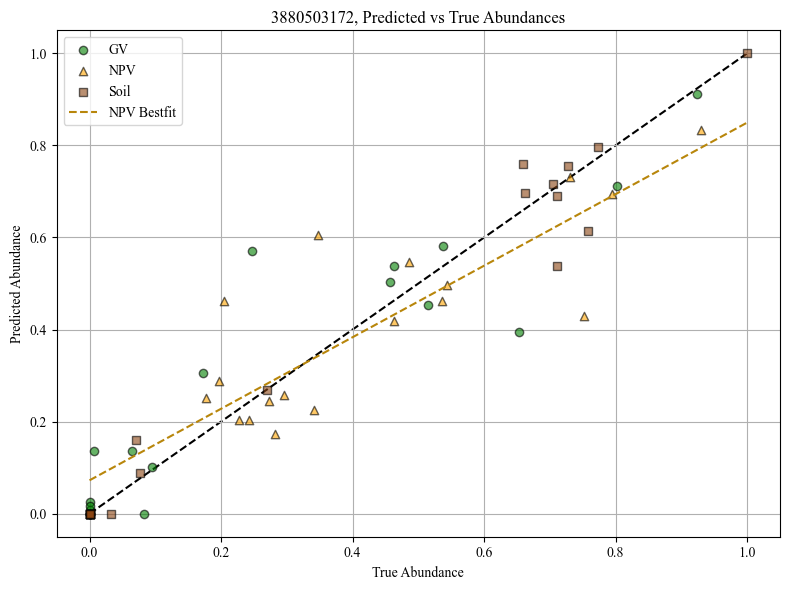

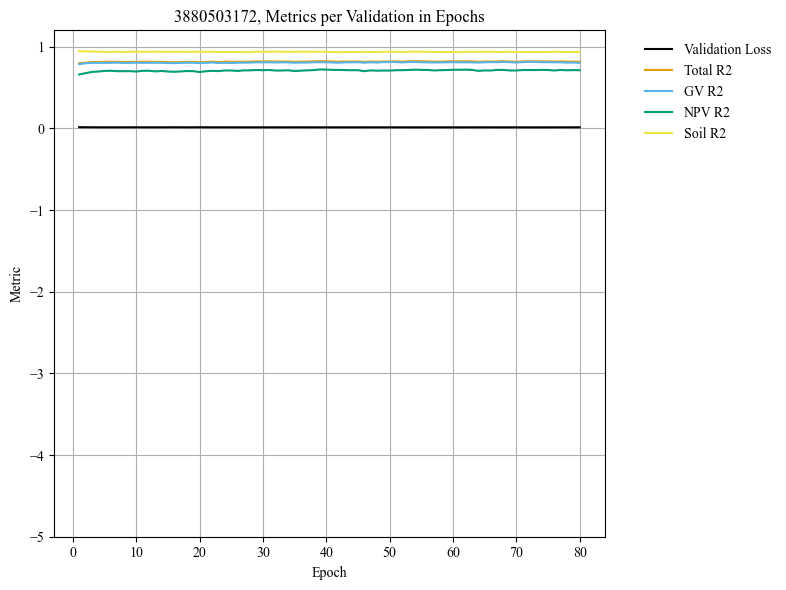

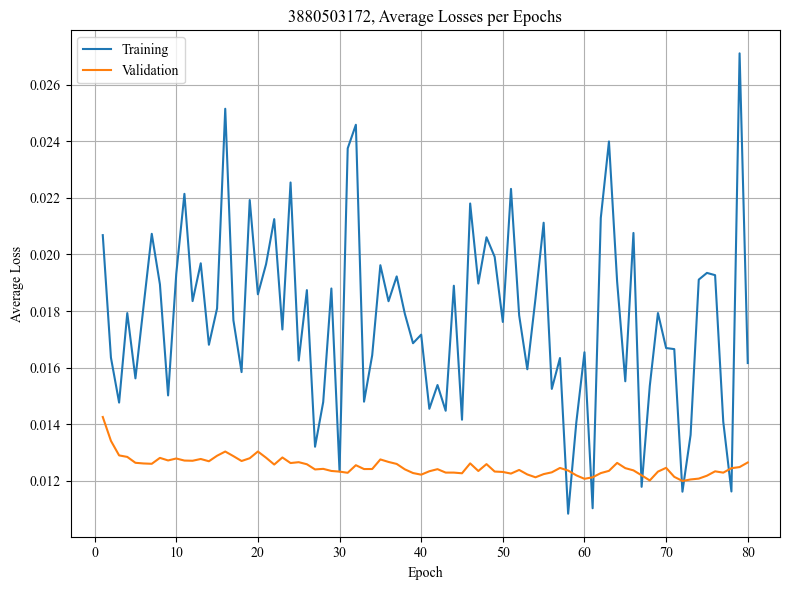

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012574
Epoch 1/80, Step 2/5, Train Loss: 0.020162
Epoch 1/80, Step 3/5, Train Loss: 0.008251
Epoch 1/80, Step 4/5, Train Loss: 0.027377
Epoch 1/80, Step 5/5, Train Loss: 0.017064
Epoch 1/80 complete. Train Loss: 0.017086, Val Loss: 0.005191
Epoch 2/80, Step 1/5, Train Loss: 0.016146
Epoch 2/80, Step 2/5, Train Loss: 0.008125
Epoch 2/80, Step 3/5, Train Loss: 0.005942
Epoch 2/80, Step 4/5, Train Loss: 0.018460
Epoch 2/80, Step 5/5, Train Loss: 0.009432
Epoch 2/80 complete. Train Loss: 0.011621, Val Loss: 0.005242
Epoch 3/80, Step 1/5, Train Loss: 0.021017
Epoch 3/80, Step 2/5, Train Loss: 0.013330
Epoch 3/80, Step 3/5, Train Loss: 0.024021
Epoch 3/80, Step 4/5, Train Loss: 0.014020
Epoch 3/80, Step 5/5, Train Loss: 0.013267
Epoch 3/80 complete. Train Loss: 0.017131, Val Loss: 0.005258
Epoch 4/80, Step 1/5, Train Loss: 0.017184
Epoch 4/80, Step 2/5, Train Loss: 0.020677
Epoch 4/80, Step 3/5, Train Loss: 0.010599
Epoch 4/80, Step 4/5, Train Loss: 0.0182

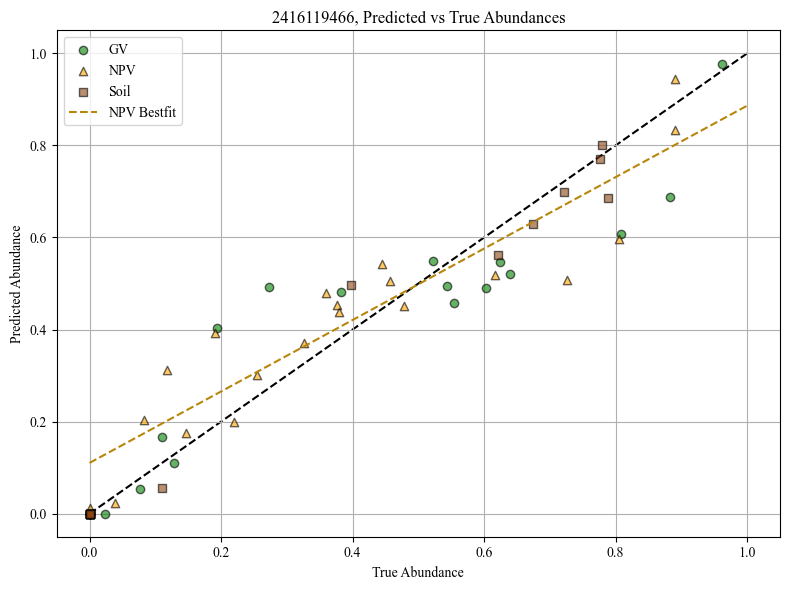

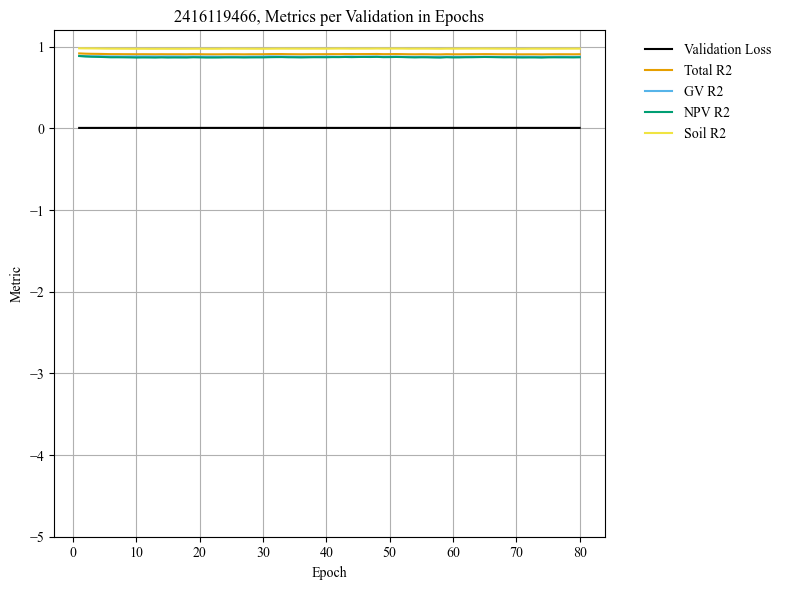

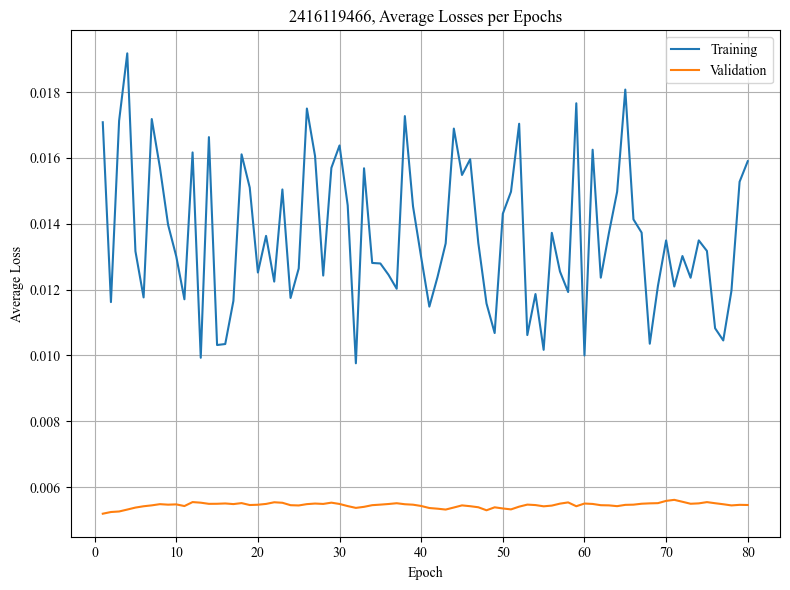

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016713
Epoch 1/80, Step 2/5, Train Loss: 0.024379
Epoch 1/80, Step 3/5, Train Loss: 0.016048
Epoch 1/80, Step 4/5, Train Loss: 0.018273
Epoch 1/80, Step 5/5, Train Loss: 0.026271
Epoch 1/80 complete. Train Loss: 0.020337, Val Loss: 0.018733
Epoch 2/80, Step 1/5, Train Loss: 0.018009
Epoch 2/80, Step 2/5, Train Loss: 0.027169
Epoch 2/80, Step 3/5, Train Loss: 0.014881
Epoch 2/80, Step 4/5, Train Loss: 0.016785
Epoch 2/80, Step 5/5, Train Loss: 0.024174
Epoch 2/80 complete. Train Loss: 0.020203, Val Loss: 0.017608
Epoch 3/80, Step 1/5, Train Loss: 0.008500
Epoch 3/80, Step 2/5, Train Loss: 0.007177
Epoch 3/80, Step 3/5, Train Loss: 0.013710
Epoch 3/80, Step 4/5, Train Loss: 0.023813
Epoch 3/80, Step 5/5, Train Loss: 0.024590
Epoch 3/80 complete. Train Loss: 0.015558, Val Loss: 0.017268
Epoch 4/80, Step 1/5, Train Loss: 0.029876
Epoch 4/80, Step 2/5, Train Loss: 0.010473
Epoch 4/80, Step 3/5, Train Loss: 0.014589
Epoch 4/80, Step 4/5, Train Loss: 0.0168

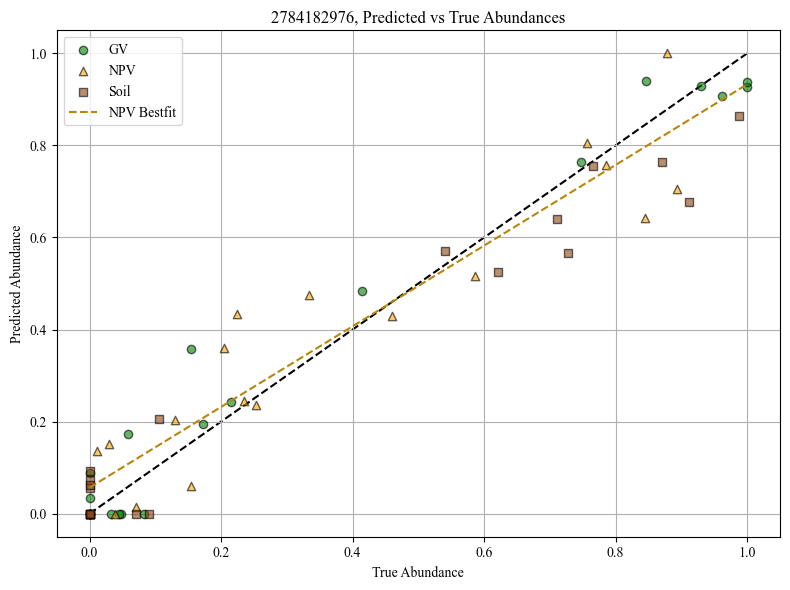

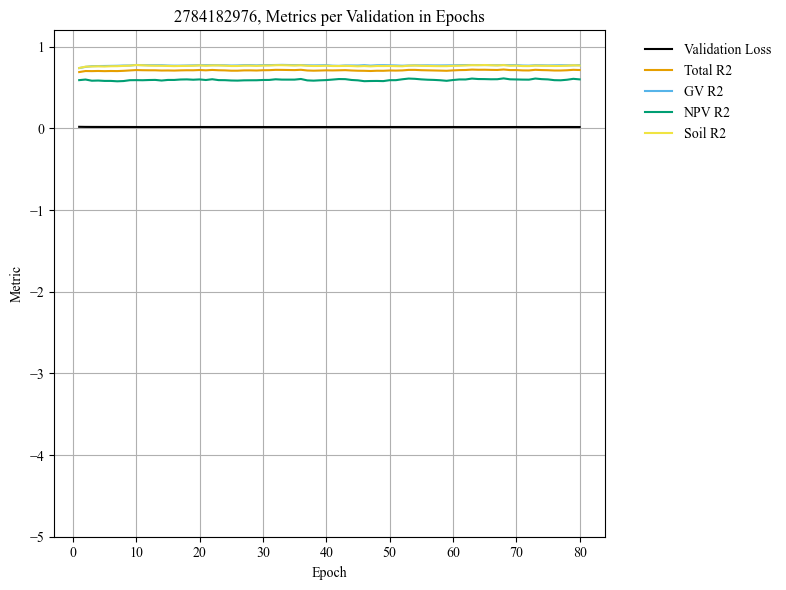

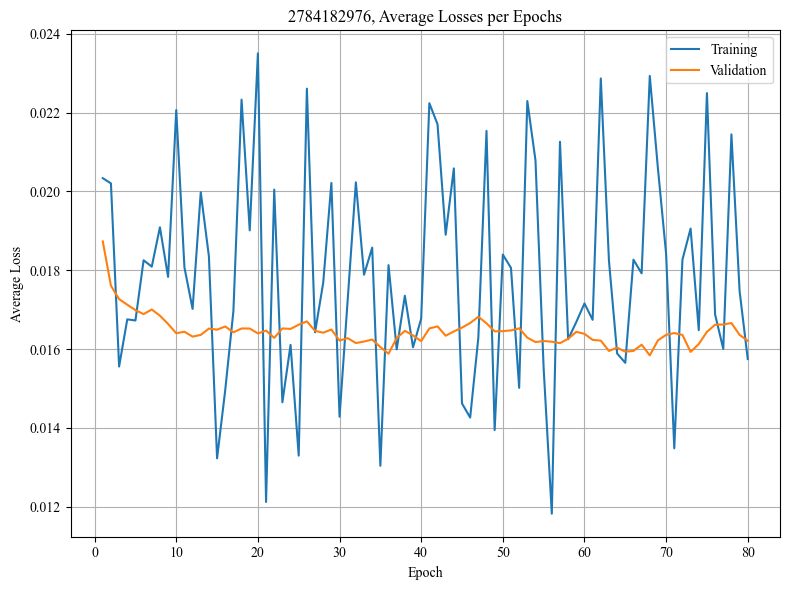

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009330
Epoch 1/80, Step 2/5, Train Loss: 0.012233
Epoch 1/80, Step 3/5, Train Loss: 0.013454
Epoch 1/80, Step 4/5, Train Loss: 0.024061
Epoch 1/80, Step 5/5, Train Loss: 0.019627
Epoch 1/80 complete. Train Loss: 0.015741, Val Loss: 0.011285
Epoch 2/80, Step 1/5, Train Loss: 0.007681
Epoch 2/80, Step 2/5, Train Loss: 0.012576
Epoch 2/80, Step 3/5, Train Loss: 0.013252
Epoch 2/80, Step 4/5, Train Loss: 0.043796
Epoch 2/80, Step 5/5, Train Loss: 0.025761
Epoch 2/80 complete. Train Loss: 0.020613, Val Loss: 0.011960
Epoch 3/80, Step 1/5, Train Loss: 0.017659
Epoch 3/80, Step 2/5, Train Loss: 0.043709
Epoch 3/80, Step 3/5, Train Loss: 0.015442
Epoch 3/80, Step 4/5, Train Loss: 0.008441
Epoch 3/80, Step 5/5, Train Loss: 0.015163
Epoch 3/80 complete. Train Loss: 0.020083, Val Loss: 0.012354
Epoch 4/80, Step 1/5, Train Loss: 0.019337
Epoch 4/80, Step 2/5, Train Loss: 0.032599
Epoch 4/80, Step 3/5, Train Loss: 0.033608
Epoch 4/80, Step 4/5, Train Loss: 0.0096

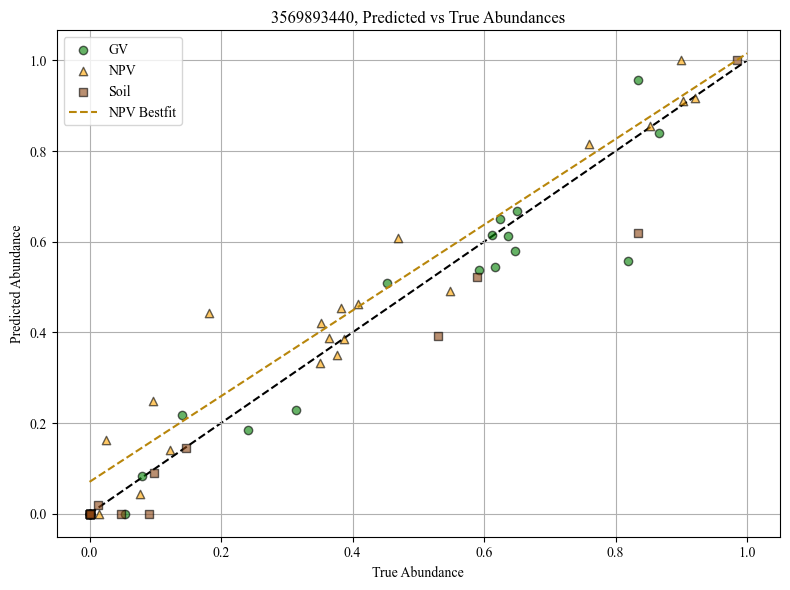

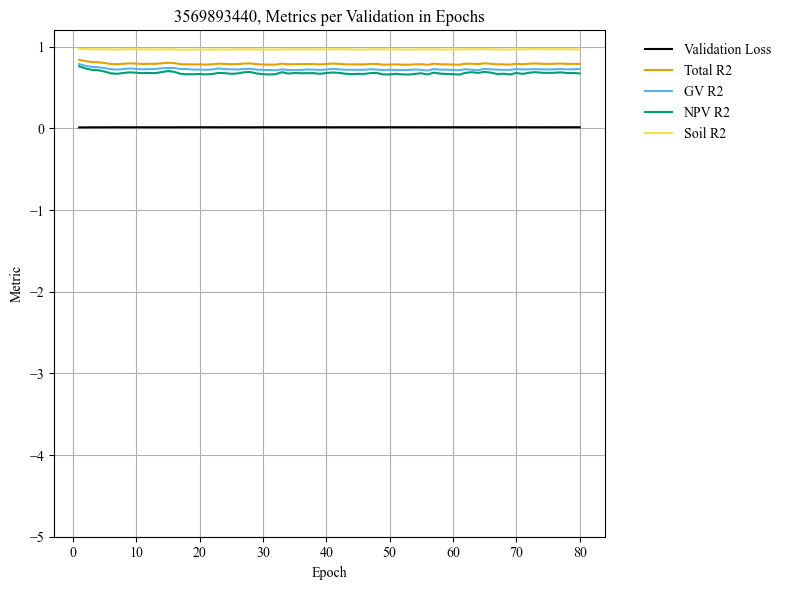

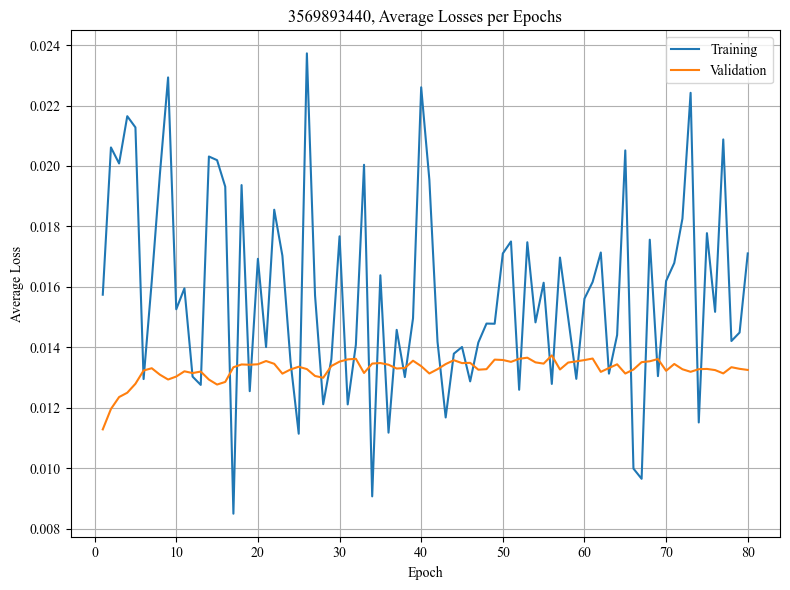

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018505
Epoch 1/80, Step 2/5, Train Loss: 0.021303
Epoch 1/80, Step 3/5, Train Loss: 0.005504
Epoch 1/80, Step 4/5, Train Loss: 0.011637
Epoch 1/80, Step 5/5, Train Loss: 0.009040
Epoch 1/80 complete. Train Loss: 0.013198, Val Loss: 0.010931
Epoch 2/80, Step 1/5, Train Loss: 0.015494
Epoch 2/80, Step 2/5, Train Loss: 0.008352
Epoch 2/80, Step 3/5, Train Loss: 0.005629
Epoch 2/80, Step 4/5, Train Loss: 0.011477
Epoch 2/80, Step 5/5, Train Loss: 0.023185
Epoch 2/80 complete. Train Loss: 0.012827, Val Loss: 0.010912
Epoch 3/80, Step 1/5, Train Loss: 0.015484
Epoch 3/80, Step 2/5, Train Loss: 0.011715
Epoch 3/80, Step 3/5, Train Loss: 0.008476
Epoch 3/80, Step 4/5, Train Loss: 0.011795
Epoch 3/80, Step 5/5, Train Loss: 0.038707
Epoch 3/80 complete. Train Loss: 0.017235, Val Loss: 0.010826
Epoch 4/80, Step 1/5, Train Loss: 0.006250
Epoch 4/80, Step 2/5, Train Loss: 0.024451
Epoch 4/80, Step 3/5, Train Loss: 0.003770
Epoch 4/80, Step 4/5, Train Loss: 0.0252

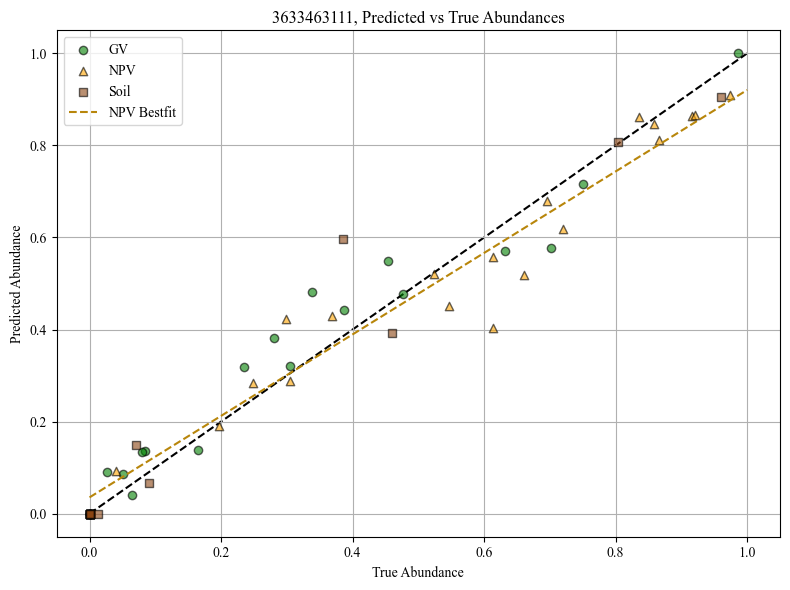

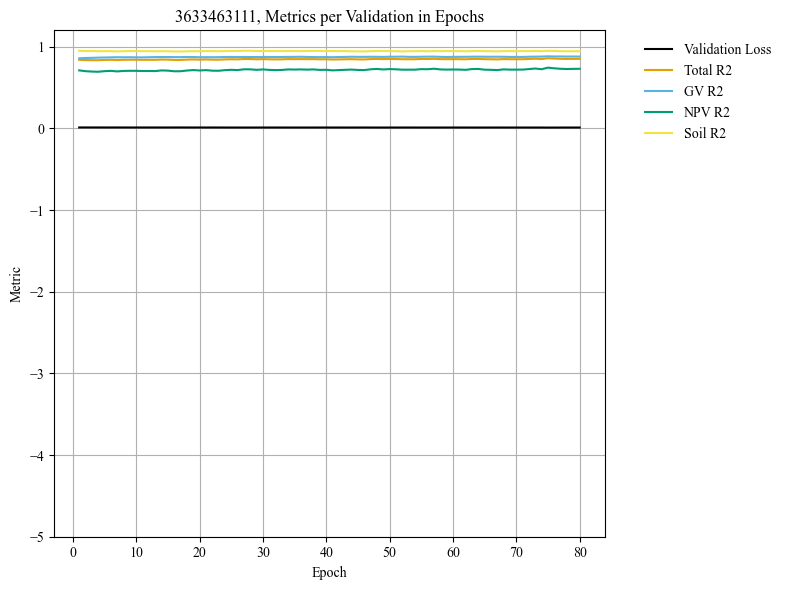

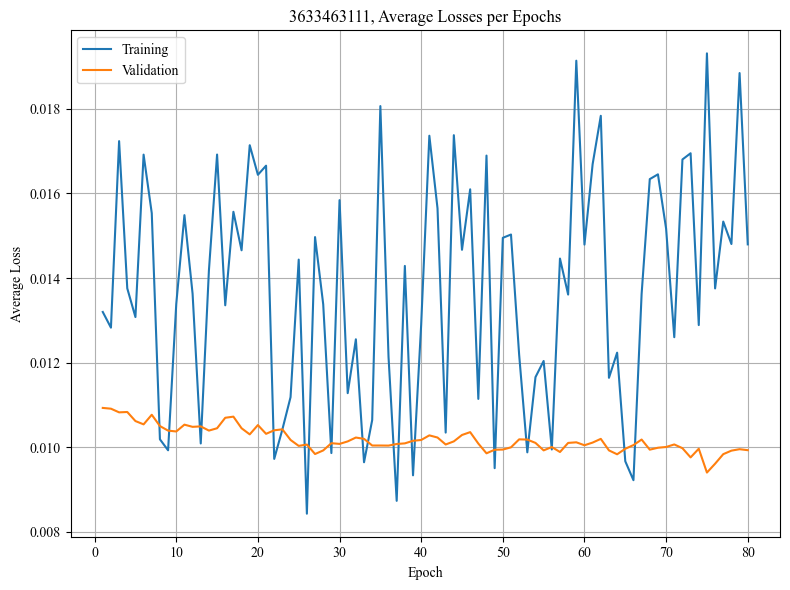

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.013017
Epoch 1/80, Step 2/5, Train Loss: 0.033438
Epoch 1/80, Step 3/5, Train Loss: 0.020995
Epoch 1/80, Step 4/5, Train Loss: 0.023795
Epoch 1/80, Step 5/5, Train Loss: 0.038627
Epoch 1/80 complete. Train Loss: 0.025974, Val Loss: 0.011897
Epoch 2/80, Step 1/5, Train Loss: 0.015977
Epoch 2/80, Step 2/5, Train Loss: 0.012297
Epoch 2/80, Step 3/5, Train Loss: 0.010109
Epoch 2/80, Step 4/5, Train Loss: 0.016078
Epoch 2/80, Step 5/5, Train Loss: 0.012498
Epoch 2/80 complete. Train Loss: 0.013392, Val Loss: 0.011408
Epoch 3/80, Step 1/5, Train Loss: 0.012110
Epoch 3/80, Step 2/5, Train Loss: 0.012336
Epoch 3/80, Step 3/5, Train Loss: 0.017321
Epoch 3/80, Step 4/5, Train Loss: 0.038730
Epoch 3/80, Step 5/5, Train Loss: 0.009708
Epoch 3/80 complete. Train Loss: 0.018041, Val Loss: 0.011391
Epoch 4/80, Step 1/5, Train Loss: 0.013695
Epoch 4/80, Step 2/5, Train Loss: 0.036202
Epoch 4/80, Step 3/5, Train Loss: 0.020876
Epoch 4/80, Step 4/5, Train Loss: 0.0253

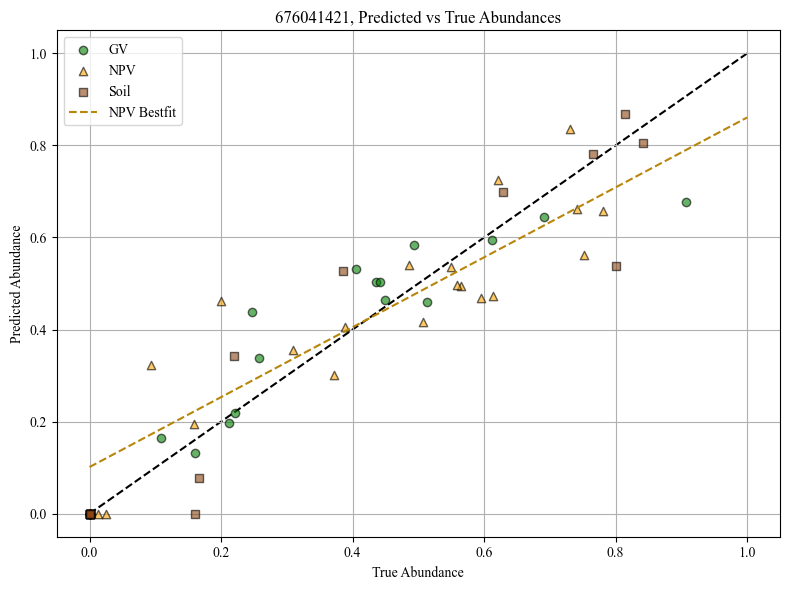

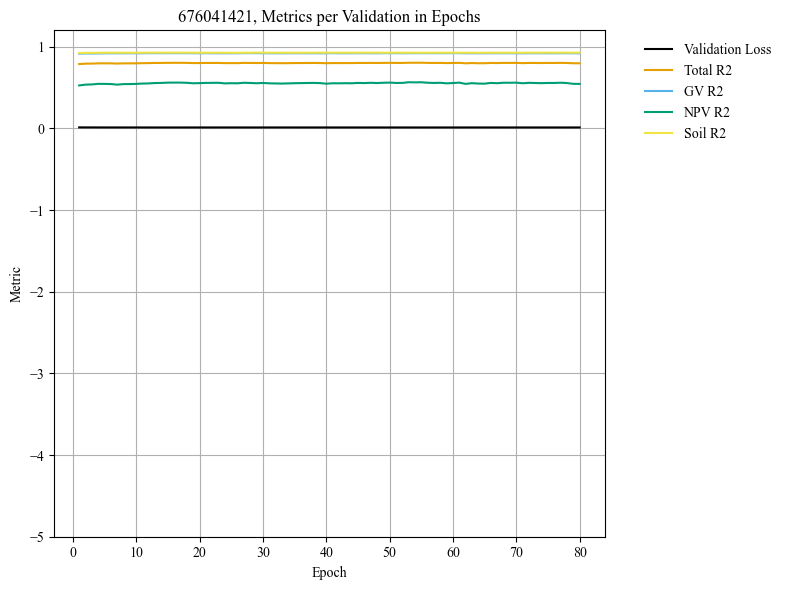

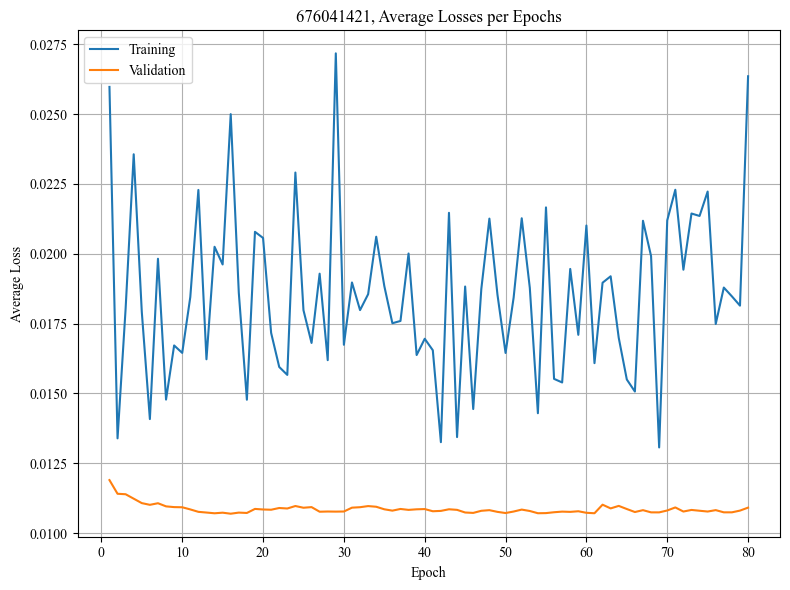

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007765
Epoch 1/80, Step 2/5, Train Loss: 0.023783
Epoch 1/80, Step 3/5, Train Loss: 0.006179
Epoch 1/80, Step 4/5, Train Loss: 0.026728
Epoch 1/80, Step 5/5, Train Loss: 0.021427
Epoch 1/80 complete. Train Loss: 0.017176, Val Loss: 0.014183
Epoch 2/80, Step 1/5, Train Loss: 0.008630
Epoch 2/80, Step 2/5, Train Loss: 0.013628
Epoch 2/80, Step 3/5, Train Loss: 0.005160
Epoch 2/80, Step 4/5, Train Loss: 0.023962
Epoch 2/80, Step 5/5, Train Loss: 0.020781
Epoch 2/80 complete. Train Loss: 0.014432, Val Loss: 0.013691
Epoch 3/80, Step 1/5, Train Loss: 0.015314
Epoch 3/80, Step 2/5, Train Loss: 0.006002
Epoch 3/80, Step 3/5, Train Loss: 0.010886
Epoch 3/80, Step 4/5, Train Loss: 0.015433
Epoch 3/80, Step 5/5, Train Loss: 0.016353
Epoch 3/80 complete. Train Loss: 0.012798, Val Loss: 0.013500
Epoch 4/80, Step 1/5, Train Loss: 0.013047
Epoch 4/80, Step 2/5, Train Loss: 0.029843
Epoch 4/80, Step 3/5, Train Loss: 0.013698
Epoch 4/80, Step 4/5, Train Loss: 0.0124

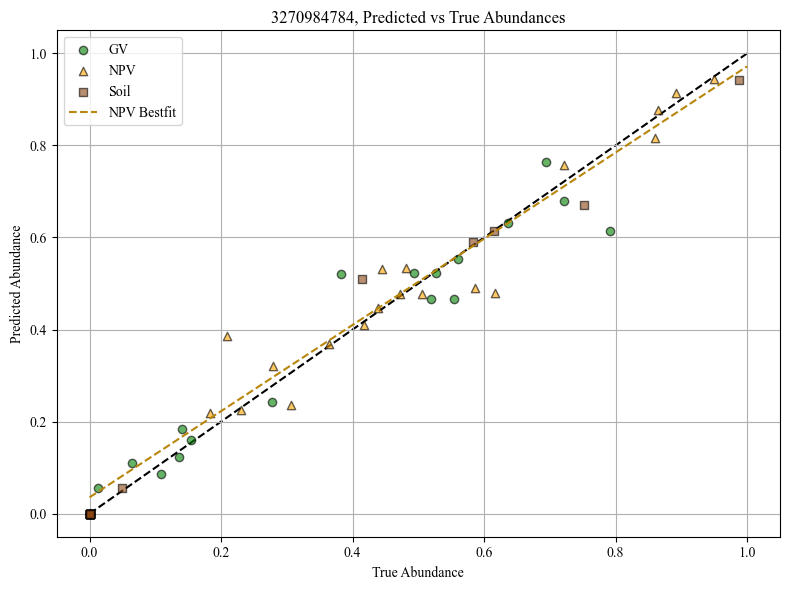

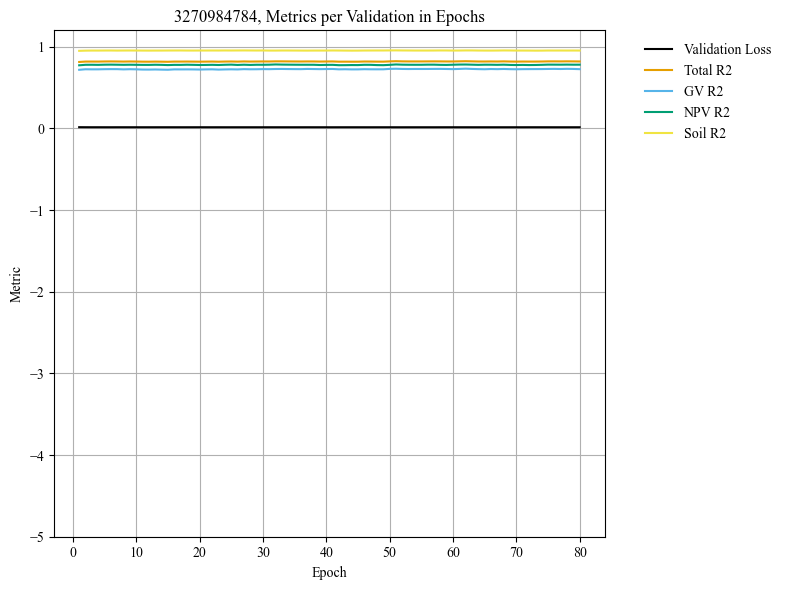

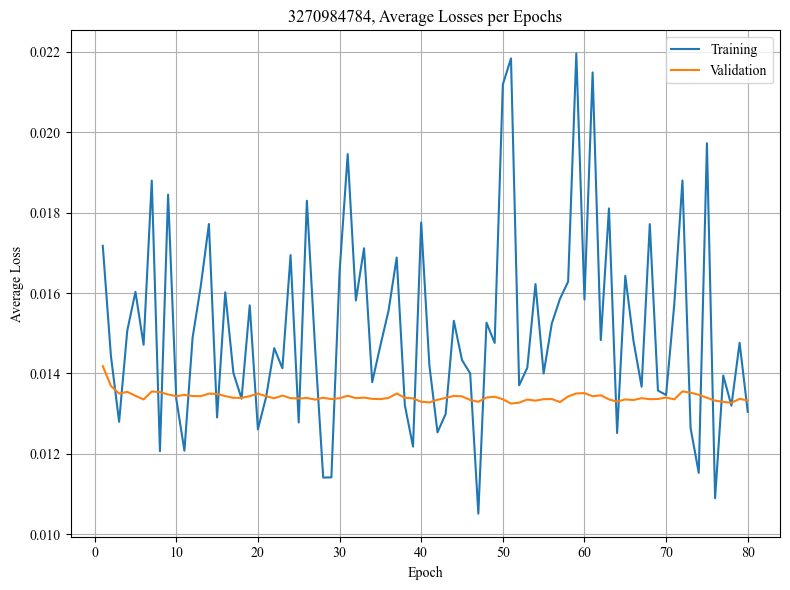

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.013563
Epoch 1/80, Step 2/5, Train Loss: 0.030044
Epoch 1/80, Step 3/5, Train Loss: 0.008070
Epoch 1/80, Step 4/5, Train Loss: 0.025029
Epoch 1/80, Step 5/5, Train Loss: 0.022236
Epoch 1/80 complete. Train Loss: 0.019788, Val Loss: 0.006717
Epoch 2/80, Step 1/5, Train Loss: 0.019145
Epoch 2/80, Step 2/5, Train Loss: 0.024887
Epoch 2/80, Step 3/5, Train Loss: 0.013283
Epoch 2/80, Step 4/5, Train Loss: 0.017819
Epoch 2/80, Step 5/5, Train Loss: 0.036686
Epoch 2/80 complete. Train Loss: 0.022364, Val Loss: 0.006470
Epoch 3/80, Step 1/5, Train Loss: 0.013729
Epoch 3/80, Step 2/5, Train Loss: 0.010371
Epoch 3/80, Step 3/5, Train Loss: 0.018115
Epoch 3/80, Step 4/5, Train Loss: 0.016366
Epoch 3/80, Step 5/5, Train Loss: 0.012429
Epoch 3/80 complete. Train Loss: 0.014202, Val Loss: 0.006555
Epoch 4/80, Step 1/5, Train Loss: 0.015715
Epoch 4/80, Step 2/5, Train Loss: 0.018479
Epoch 4/80, Step 3/5, Train Loss: 0.021301
Epoch 4/80, Step 4/5, Train Loss: 0.0110

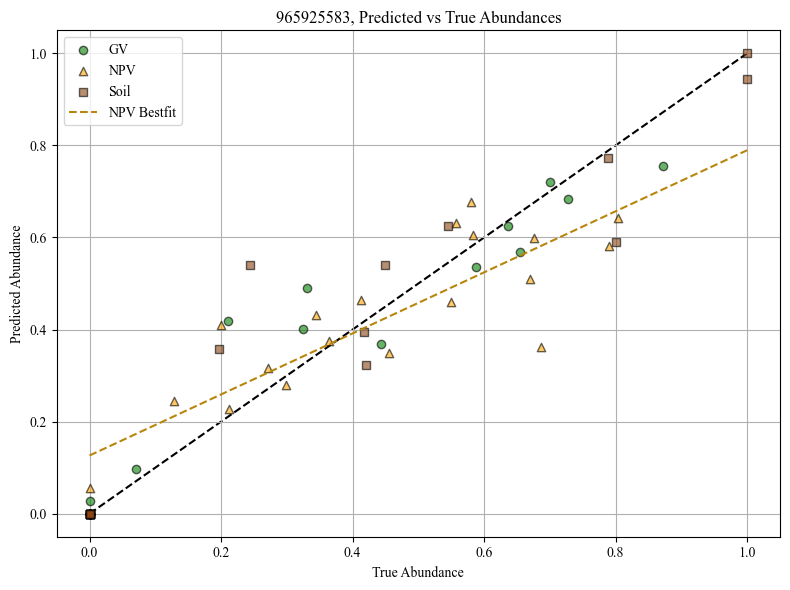

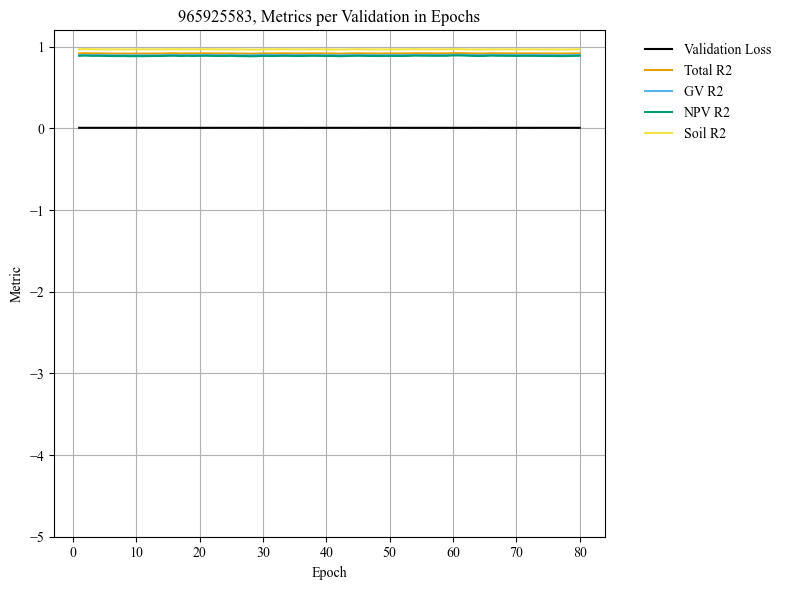

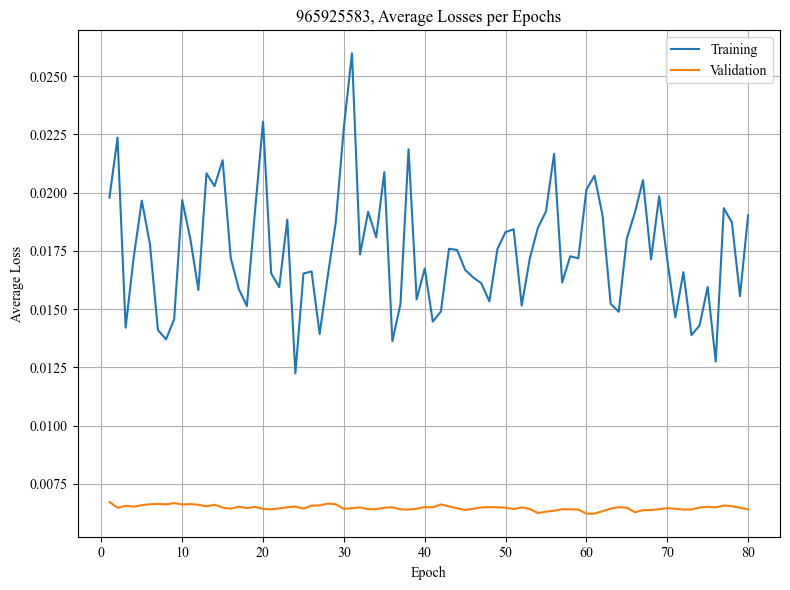

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012225
Epoch 1/80, Step 2/5, Train Loss: 0.010454
Epoch 1/80, Step 3/5, Train Loss: 0.021907
Epoch 1/80, Step 4/5, Train Loss: 0.014814
Epoch 1/80, Step 5/5, Train Loss: 0.030082
Epoch 1/80 complete. Train Loss: 0.017897, Val Loss: 0.009447
Epoch 2/80, Step 1/5, Train Loss: 0.012934
Epoch 2/80, Step 2/5, Train Loss: 0.013136
Epoch 2/80, Step 3/5, Train Loss: 0.016236
Epoch 2/80, Step 4/5, Train Loss: 0.016005
Epoch 2/80, Step 5/5, Train Loss: 0.006846
Epoch 2/80 complete. Train Loss: 0.013031, Val Loss: 0.009460
Epoch 3/80, Step 1/5, Train Loss: 0.007671
Epoch 3/80, Step 2/5, Train Loss: 0.010079
Epoch 3/80, Step 3/5, Train Loss: 0.017868
Epoch 3/80, Step 4/5, Train Loss: 0.012590
Epoch 3/80, Step 5/5, Train Loss: 0.014294
Epoch 3/80 complete. Train Loss: 0.012501, Val Loss: 0.009531
Epoch 4/80, Step 1/5, Train Loss: 0.007999
Epoch 4/80, Step 2/5, Train Loss: 0.027648
Epoch 4/80, Step 3/5, Train Loss: 0.010502
Epoch 4/80, Step 4/5, Train Loss: 0.0149

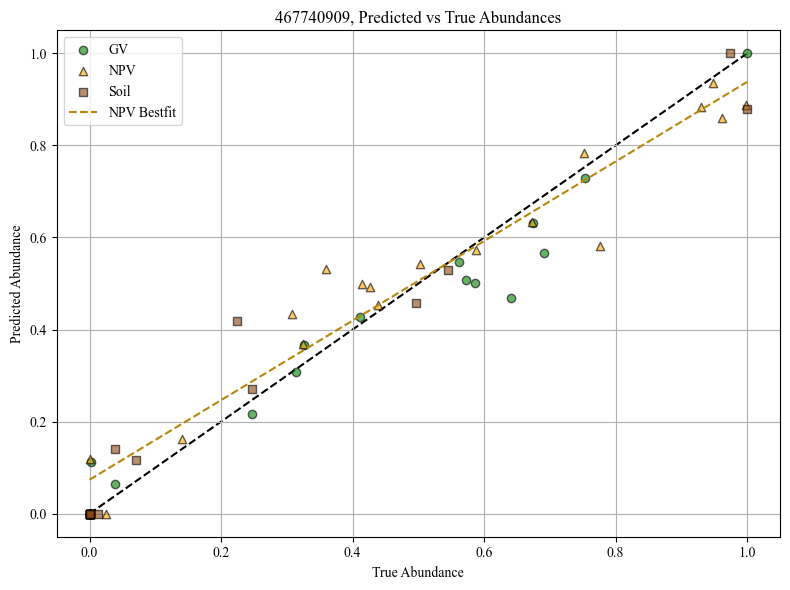

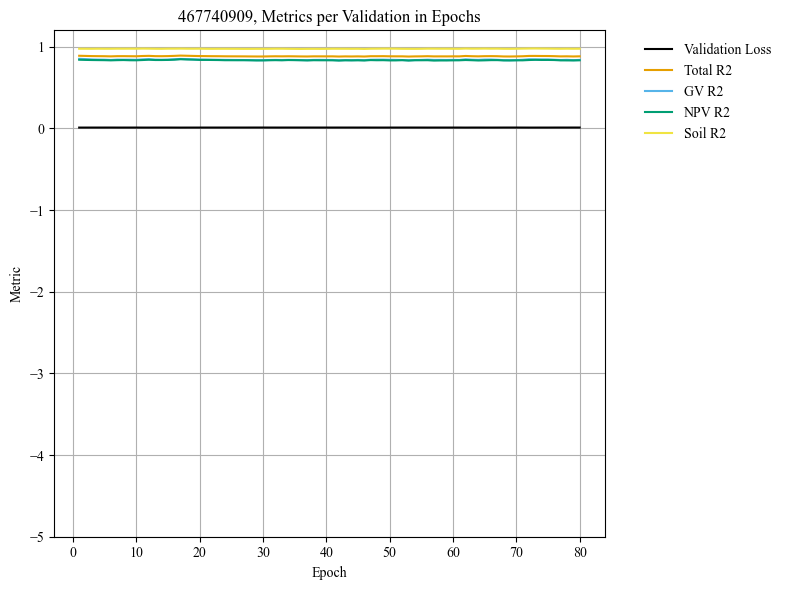

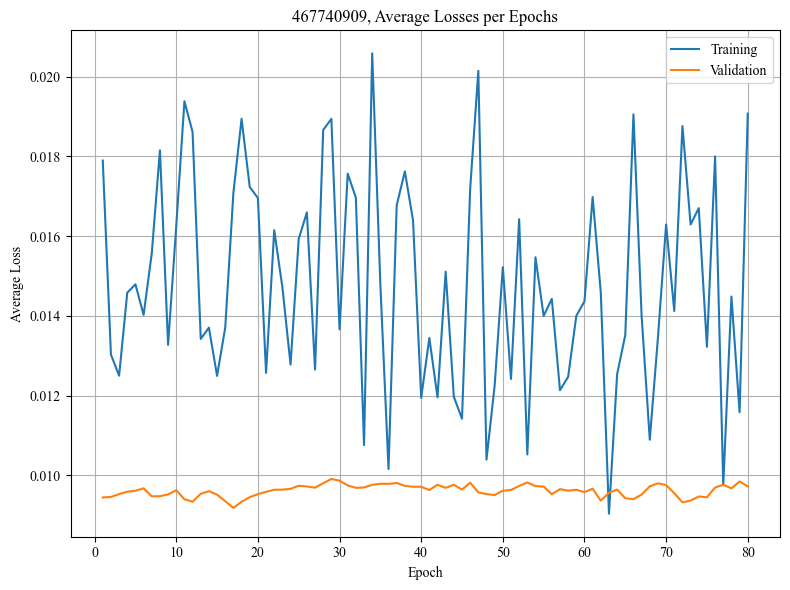

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.023770
Epoch 1/80, Step 2/5, Train Loss: 0.030267
Epoch 1/80, Step 3/5, Train Loss: 0.009856
Epoch 1/80, Step 4/5, Train Loss: 0.021312
Epoch 1/80, Step 5/5, Train Loss: 0.020645
Epoch 1/80 complete. Train Loss: 0.021170, Val Loss: 0.007959
Epoch 2/80, Step 1/5, Train Loss: 0.025779
Epoch 2/80, Step 2/5, Train Loss: 0.011475
Epoch 2/80, Step 3/5, Train Loss: 0.007388
Epoch 2/80, Step 4/5, Train Loss: 0.023174
Epoch 2/80, Step 5/5, Train Loss: 0.042921
Epoch 2/80 complete. Train Loss: 0.022147, Val Loss: 0.007953
Epoch 3/80, Step 1/5, Train Loss: 0.043007
Epoch 3/80, Step 2/5, Train Loss: 0.009070
Epoch 3/80, Step 3/5, Train Loss: 0.054542
Epoch 3/80, Step 4/5, Train Loss: 0.021630
Epoch 3/80, Step 5/5, Train Loss: 0.010359
Epoch 3/80 complete. Train Loss: 0.027721, Val Loss: 0.007911
Epoch 4/80, Step 1/5, Train Loss: 0.043304
Epoch 4/80, Step 2/5, Train Loss: 0.013200
Epoch 4/80, Step 3/5, Train Loss: 0.011305
Epoch 4/80, Step 4/5, Train Loss: 0.0136

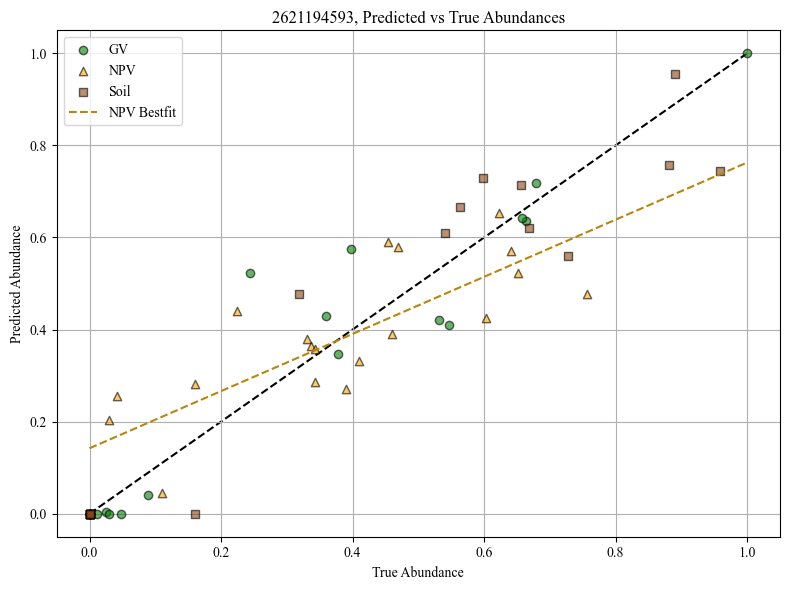

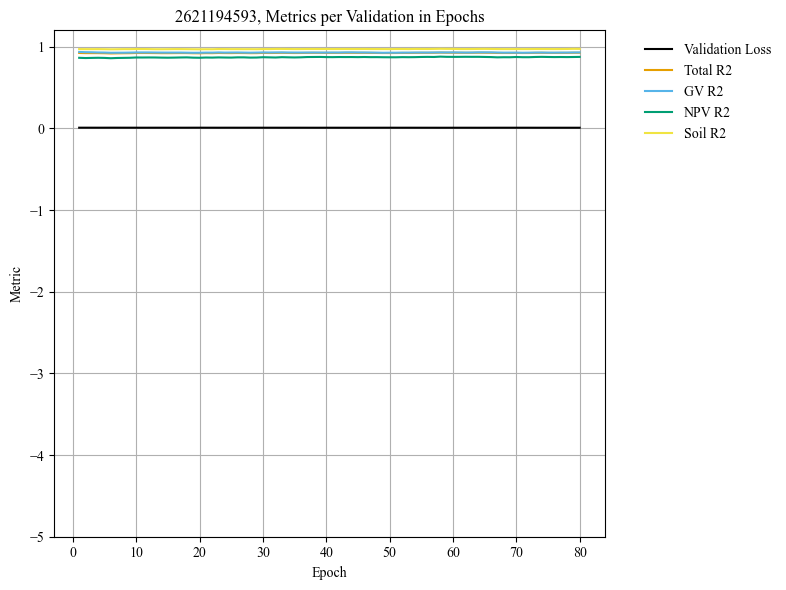

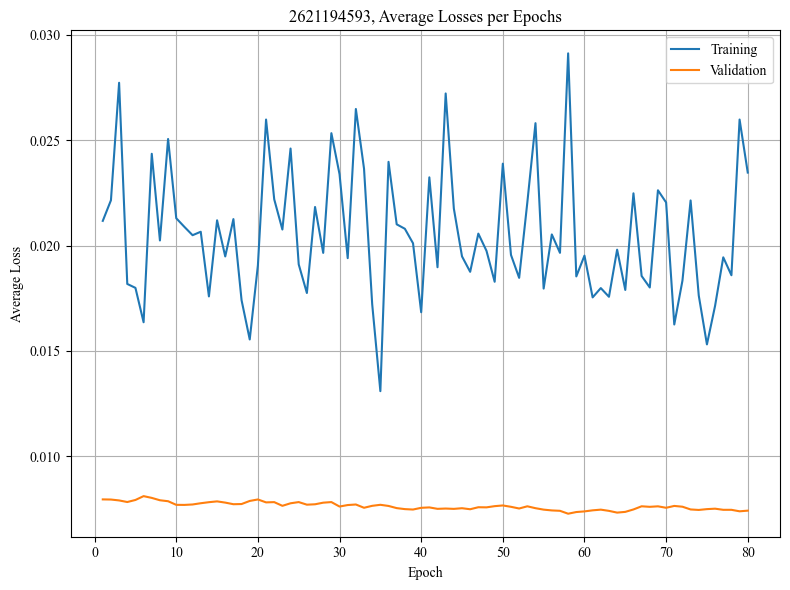

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.032639
Epoch 1/80, Step 2/5, Train Loss: 0.005323
Epoch 1/80, Step 3/5, Train Loss: 0.011073
Epoch 1/80, Step 4/5, Train Loss: 0.011538
Epoch 1/80, Step 5/5, Train Loss: 0.017519
Epoch 1/80 complete. Train Loss: 0.015619, Val Loss: 0.007154
Epoch 2/80, Step 1/5, Train Loss: 0.017818
Epoch 2/80, Step 2/5, Train Loss: 0.027192
Epoch 2/80, Step 3/5, Train Loss: 0.008482
Epoch 2/80, Step 4/5, Train Loss: 0.021319
Epoch 2/80, Step 5/5, Train Loss: 0.016929
Epoch 2/80 complete. Train Loss: 0.018348, Val Loss: 0.006935
Epoch 3/80, Step 1/5, Train Loss: 0.011335
Epoch 3/80, Step 2/5, Train Loss: 0.018411
Epoch 3/80, Step 3/5, Train Loss: 0.019645
Epoch 3/80, Step 4/5, Train Loss: 0.024708
Epoch 3/80, Step 5/5, Train Loss: 0.017597
Epoch 3/80 complete. Train Loss: 0.018339, Val Loss: 0.007035
Epoch 4/80, Step 1/5, Train Loss: 0.024037
Epoch 4/80, Step 2/5, Train Loss: 0.019121
Epoch 4/80, Step 3/5, Train Loss: 0.018244
Epoch 4/80, Step 4/5, Train Loss: 0.0246

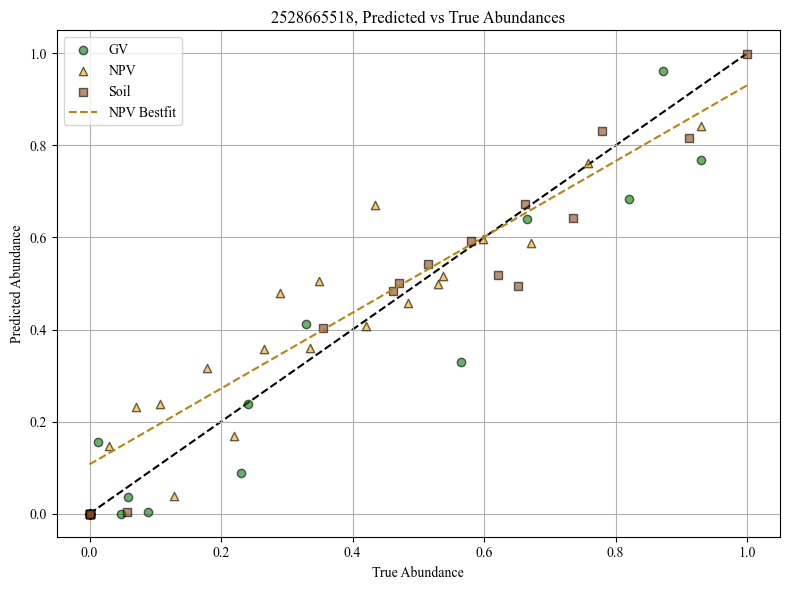

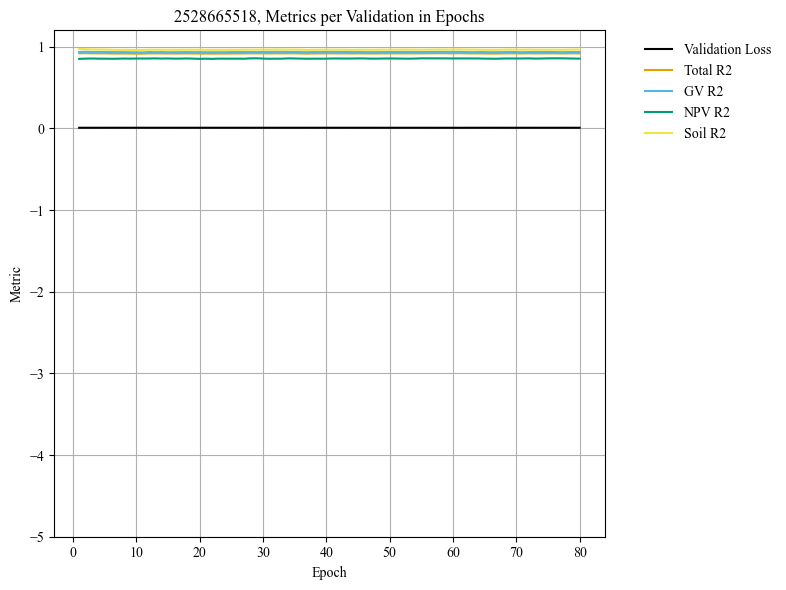

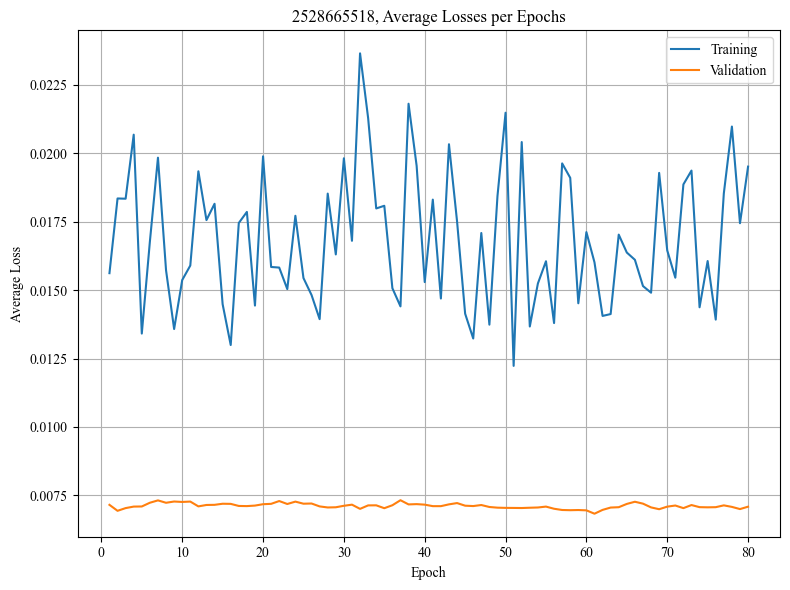

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019795
Epoch 1/80, Step 2/5, Train Loss: 0.020455
Epoch 1/80, Step 3/5, Train Loss: 0.016955
Epoch 1/80, Step 4/5, Train Loss: 0.033780
Epoch 1/80, Step 5/5, Train Loss: 0.017010
Epoch 1/80 complete. Train Loss: 0.021599, Val Loss: 0.009022
Epoch 2/80, Step 1/5, Train Loss: 0.017779
Epoch 2/80, Step 2/5, Train Loss: 0.017890
Epoch 2/80, Step 3/5, Train Loss: 0.008453
Epoch 2/80, Step 4/5, Train Loss: 0.012593
Epoch 2/80, Step 5/5, Train Loss: 0.024124
Epoch 2/80 complete. Train Loss: 0.016168, Val Loss: 0.008839
Epoch 3/80, Step 1/5, Train Loss: 0.005697
Epoch 3/80, Step 2/5, Train Loss: 0.019912
Epoch 3/80, Step 3/5, Train Loss: 0.028904
Epoch 3/80, Step 4/5, Train Loss: 0.011479
Epoch 3/80, Step 5/5, Train Loss: 0.005094
Epoch 3/80 complete. Train Loss: 0.014217, Val Loss: 0.008904
Epoch 4/80, Step 1/5, Train Loss: 0.016408
Epoch 4/80, Step 2/5, Train Loss: 0.013106
Epoch 4/80, Step 3/5, Train Loss: 0.022514
Epoch 4/80, Step 4/5, Train Loss: 0.0077

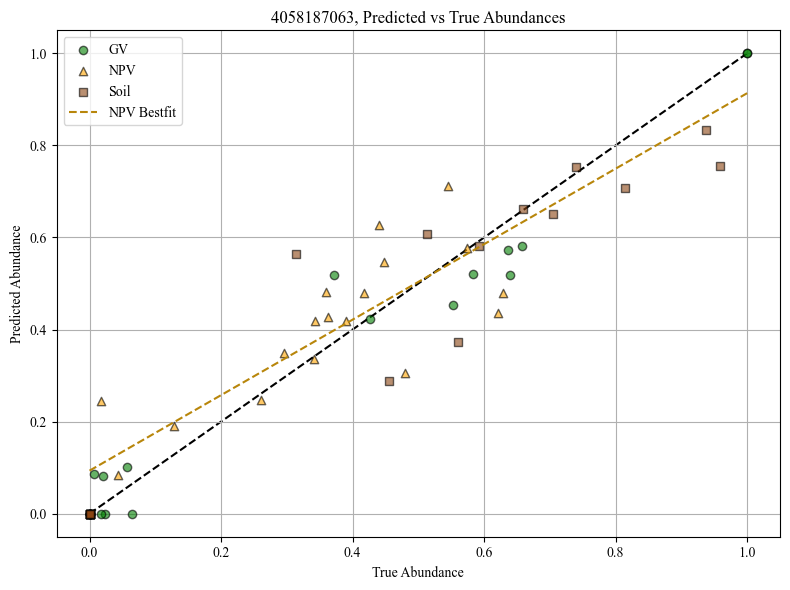

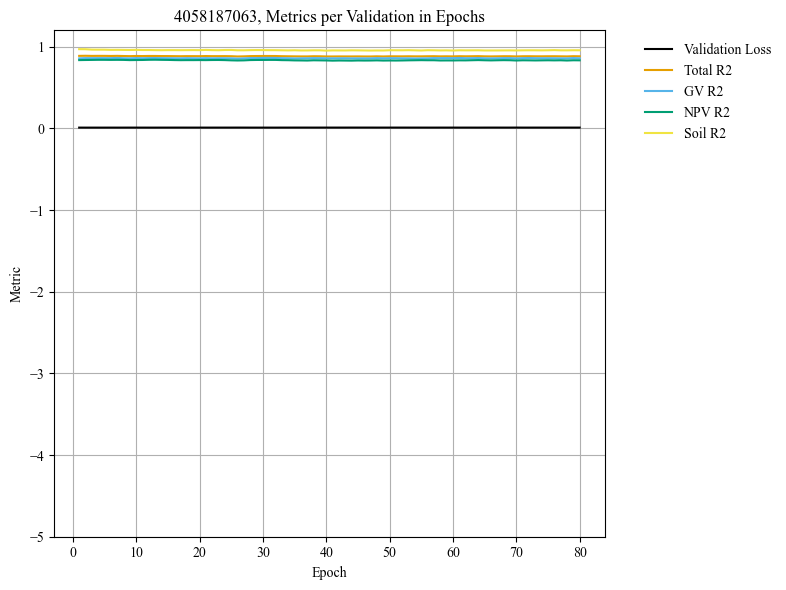

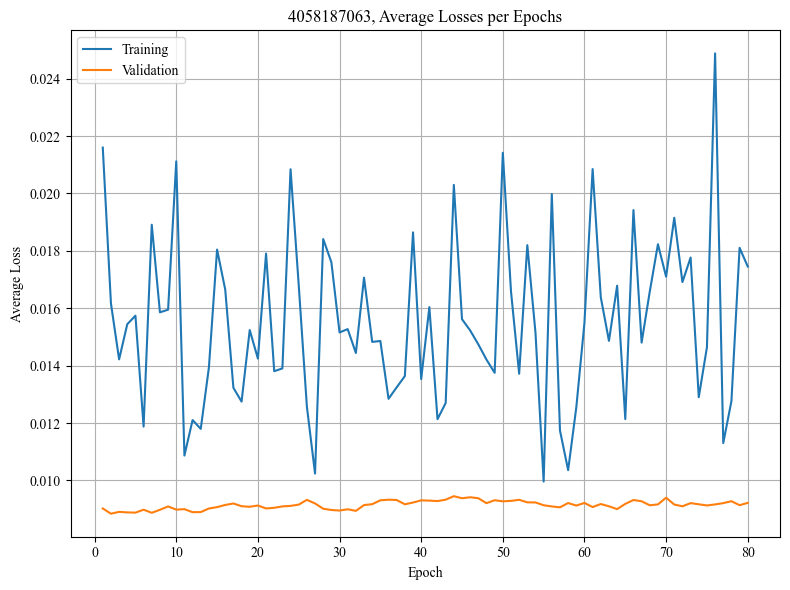

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.033225
Epoch 1/80, Step 2/5, Train Loss: 0.031180
Epoch 1/80, Step 3/5, Train Loss: 0.017646
Epoch 1/80, Step 4/5, Train Loss: 0.015882
Epoch 1/80, Step 5/5, Train Loss: 0.019415
Epoch 1/80 complete. Train Loss: 0.023470, Val Loss: 0.010340
Epoch 2/80, Step 1/5, Train Loss: 0.016676
Epoch 2/80, Step 2/5, Train Loss: 0.017344
Epoch 2/80, Step 3/5, Train Loss: 0.012660
Epoch 2/80, Step 4/5, Train Loss: 0.018707
Epoch 2/80, Step 5/5, Train Loss: 0.020182
Epoch 2/80 complete. Train Loss: 0.017114, Val Loss: 0.011137
Epoch 3/80, Step 1/5, Train Loss: 0.041441
Epoch 3/80, Step 2/5, Train Loss: 0.018888
Epoch 3/80, Step 3/5, Train Loss: 0.016295
Epoch 3/80, Step 4/5, Train Loss: 0.020640
Epoch 3/80, Step 5/5, Train Loss: 0.008483
Epoch 3/80 complete. Train Loss: 0.021149, Val Loss: 0.011588
Epoch 4/80, Step 1/5, Train Loss: 0.021335
Epoch 4/80, Step 2/5, Train Loss: 0.021779
Epoch 4/80, Step 3/5, Train Loss: 0.018204
Epoch 4/80, Step 4/5, Train Loss: 0.0214

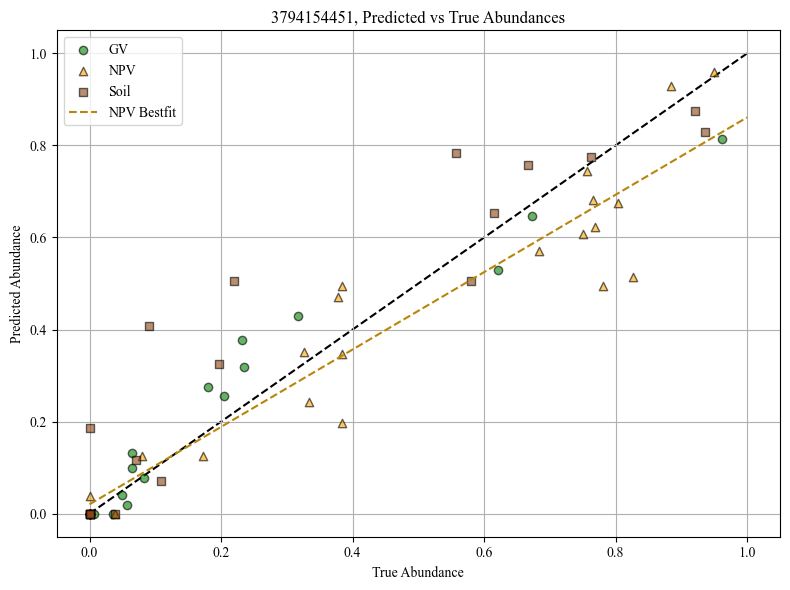

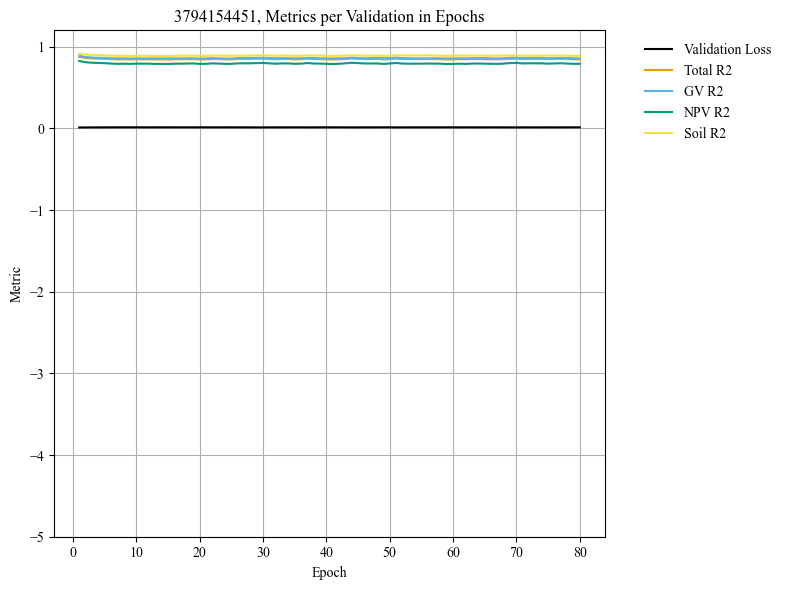

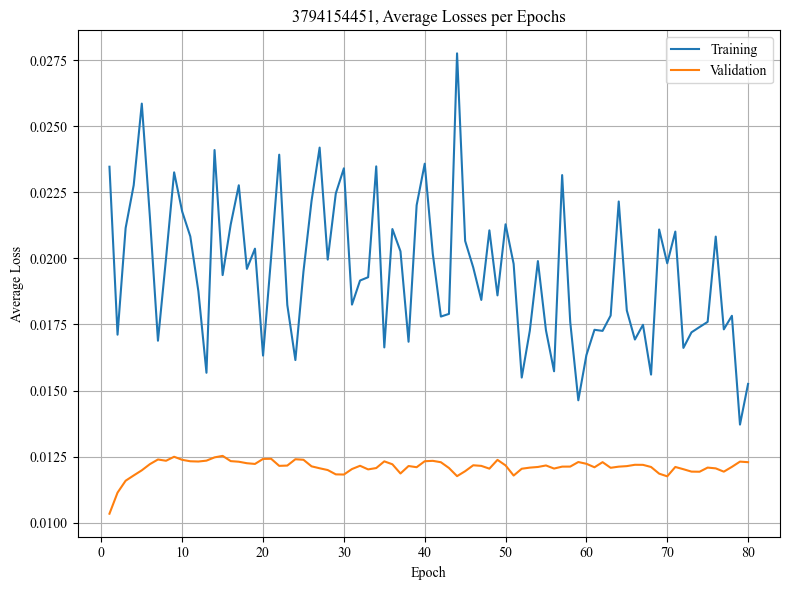

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.023886
Epoch 1/80, Step 2/5, Train Loss: 0.017858
Epoch 1/80, Step 3/5, Train Loss: 0.012151
Epoch 1/80, Step 4/5, Train Loss: 0.021691
Epoch 1/80, Step 5/5, Train Loss: 0.008477
Epoch 1/80 complete. Train Loss: 0.016813, Val Loss: 0.007672
Epoch 2/80, Step 1/5, Train Loss: 0.014344
Epoch 2/80, Step 2/5, Train Loss: 0.020178
Epoch 2/80, Step 3/5, Train Loss: 0.023722
Epoch 2/80, Step 4/5, Train Loss: 0.012859
Epoch 2/80, Step 5/5, Train Loss: 0.012507
Epoch 2/80 complete. Train Loss: 0.016722, Val Loss: 0.007547
Epoch 3/80, Step 1/5, Train Loss: 0.013134
Epoch 3/80, Step 2/5, Train Loss: 0.031762
Epoch 3/80, Step 3/5, Train Loss: 0.017180
Epoch 3/80, Step 4/5, Train Loss: 0.008555
Epoch 3/80, Step 5/5, Train Loss: 0.009465
Epoch 3/80 complete. Train Loss: 0.016019, Val Loss: 0.007567
Epoch 4/80, Step 1/5, Train Loss: 0.031084
Epoch 4/80, Step 2/5, Train Loss: 0.012209
Epoch 4/80, Step 3/5, Train Loss: 0.018872
Epoch 4/80, Step 4/5, Train Loss: 0.0212

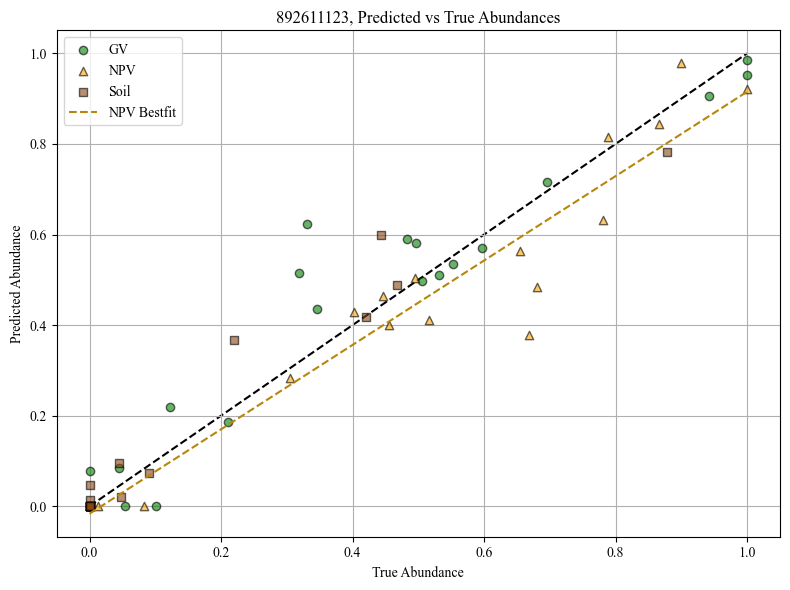

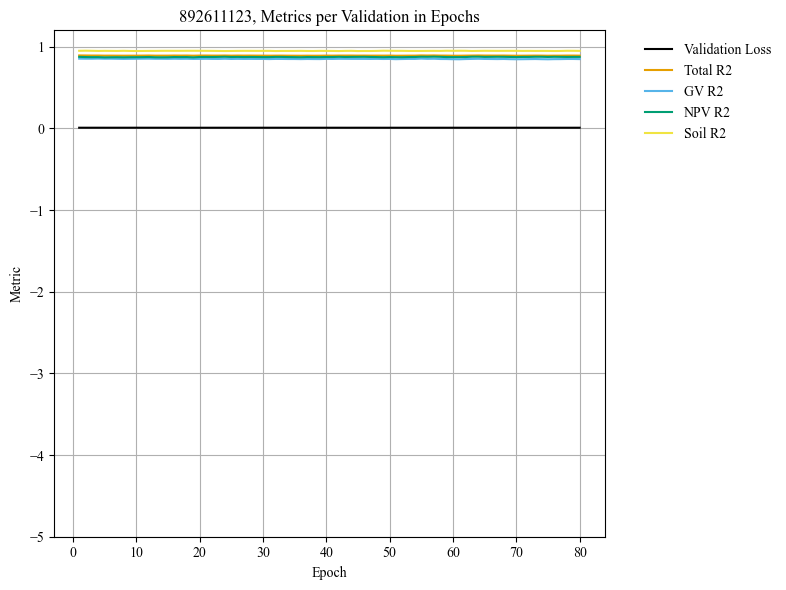

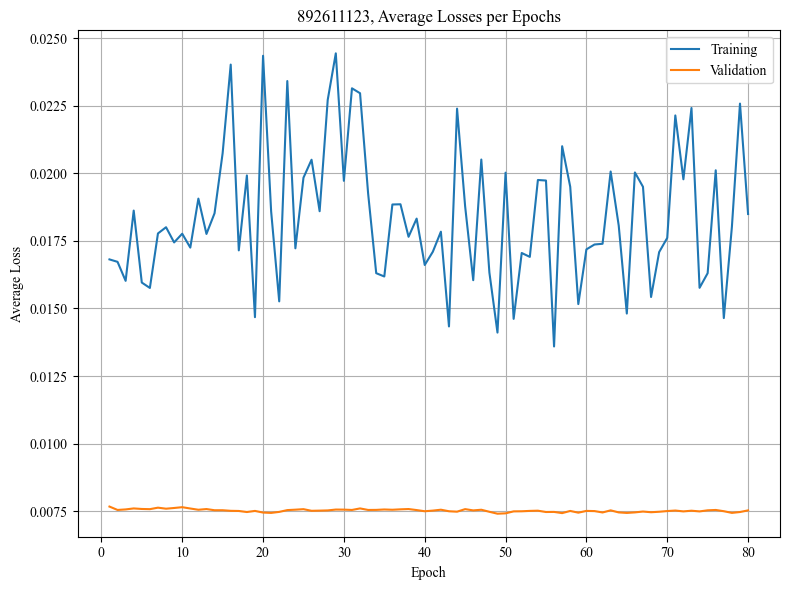

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012139
Epoch 1/80, Step 2/5, Train Loss: 0.012771
Epoch 1/80, Step 3/5, Train Loss: 0.019647
Epoch 1/80, Step 4/5, Train Loss: 0.019465
Epoch 1/80, Step 5/5, Train Loss: 0.013076
Epoch 1/80 complete. Train Loss: 0.015420, Val Loss: 0.013992
Epoch 2/80, Step 1/5, Train Loss: 0.023296
Epoch 2/80, Step 2/5, Train Loss: 0.019729
Epoch 2/80, Step 3/5, Train Loss: 0.020465
Epoch 2/80, Step 4/5, Train Loss: 0.025020
Epoch 2/80, Step 5/5, Train Loss: 0.020246
Epoch 2/80 complete. Train Loss: 0.021751, Val Loss: 0.014078
Epoch 3/80, Step 1/5, Train Loss: 0.023850
Epoch 3/80, Step 2/5, Train Loss: 0.016932
Epoch 3/80, Step 3/5, Train Loss: 0.010930
Epoch 3/80, Step 4/5, Train Loss: 0.019571
Epoch 3/80, Step 5/5, Train Loss: 0.014054
Epoch 3/80 complete. Train Loss: 0.017067, Val Loss: 0.014087
Epoch 4/80, Step 1/5, Train Loss: 0.014544
Epoch 4/80, Step 2/5, Train Loss: 0.023823
Epoch 4/80, Step 3/5, Train Loss: 0.017063
Epoch 4/80, Step 4/5, Train Loss: 0.0291

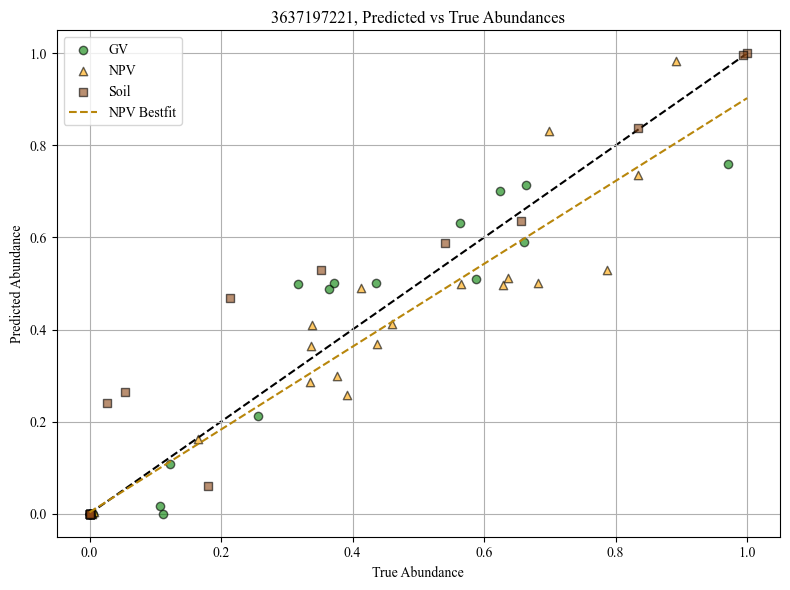

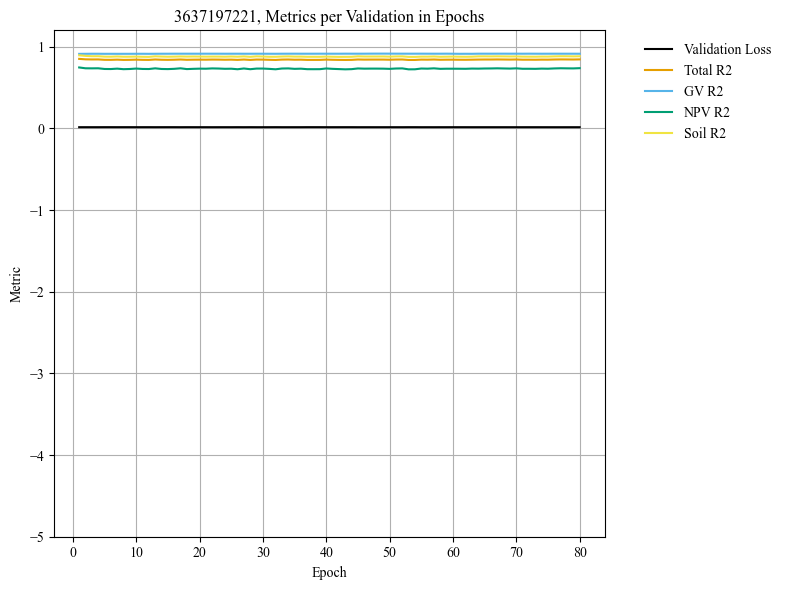

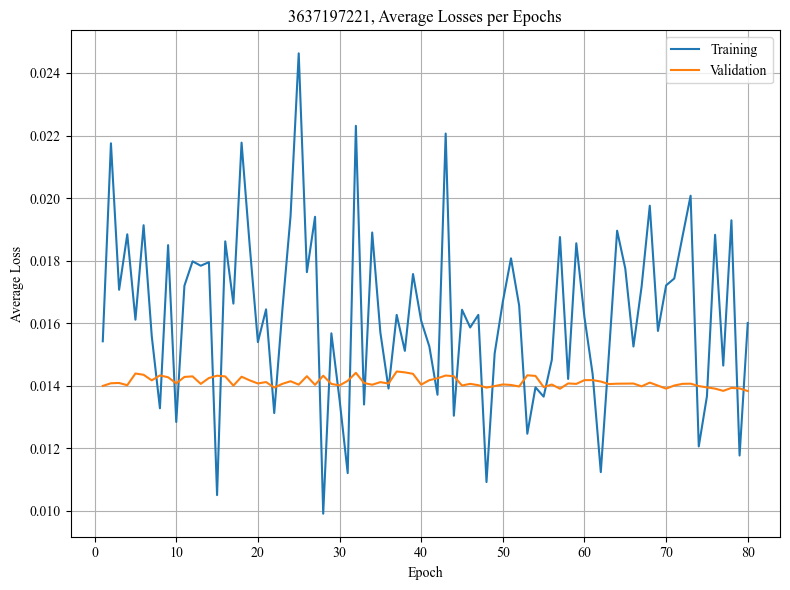

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.017340
Epoch 1/80, Step 2/5, Train Loss: 0.011532
Epoch 1/80, Step 3/5, Train Loss: 0.014051
Epoch 1/80, Step 4/5, Train Loss: 0.015900
Epoch 1/80, Step 5/5, Train Loss: 0.017632
Epoch 1/80 complete. Train Loss: 0.015291, Val Loss: 0.007526
Epoch 2/80, Step 1/5, Train Loss: 0.023555
Epoch 2/80, Step 2/5, Train Loss: 0.051018
Epoch 2/80, Step 3/5, Train Loss: 0.010767
Epoch 2/80, Step 4/5, Train Loss: 0.012018
Epoch 2/80, Step 5/5, Train Loss: 0.018850
Epoch 2/80 complete. Train Loss: 0.023242, Val Loss: 0.007181
Epoch 3/80, Step 1/5, Train Loss: 0.013120
Epoch 3/80, Step 2/5, Train Loss: 0.031788
Epoch 3/80, Step 3/5, Train Loss: 0.010110
Epoch 3/80, Step 4/5, Train Loss: 0.012040
Epoch 3/80, Step 5/5, Train Loss: 0.015505
Epoch 3/80 complete. Train Loss: 0.016513, Val Loss: 0.007111
Epoch 4/80, Step 1/5, Train Loss: 0.020517
Epoch 4/80, Step 2/5, Train Loss: 0.016099
Epoch 4/80, Step 3/5, Train Loss: 0.022911
Epoch 4/80, Step 4/5, Train Loss: 0.0231

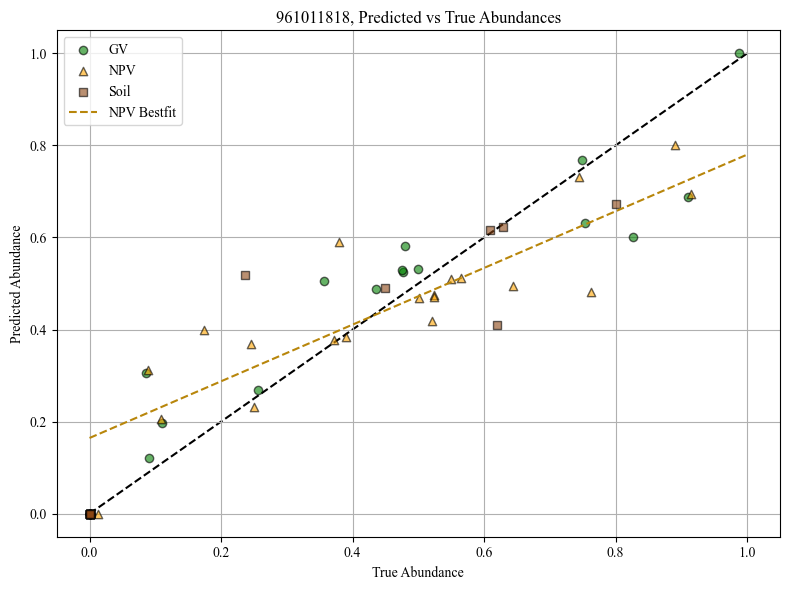

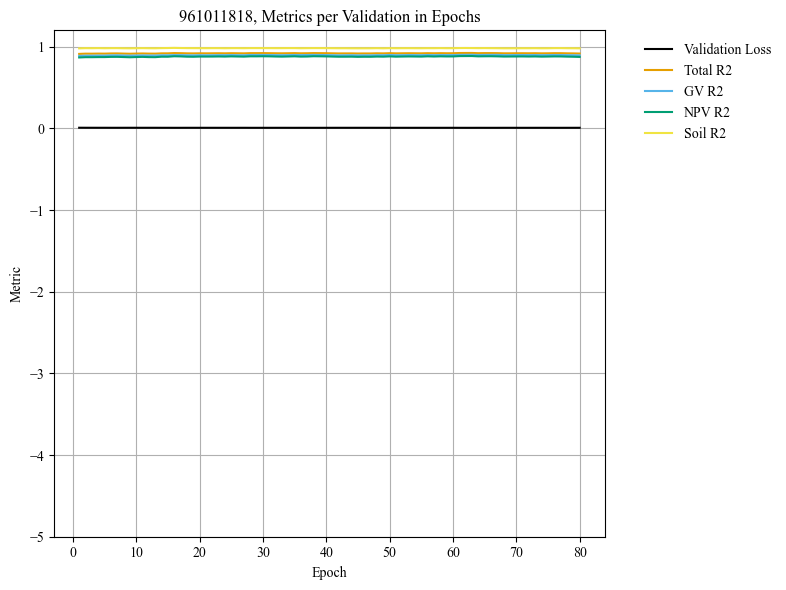

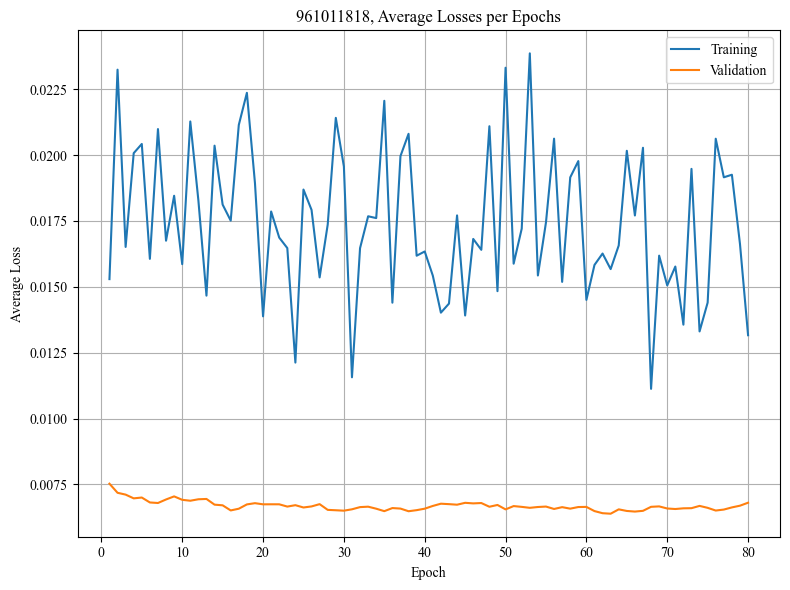

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.013680
Epoch 1/80, Step 2/5, Train Loss: 0.010182
Epoch 1/80, Step 3/5, Train Loss: 0.011354
Epoch 1/80, Step 4/5, Train Loss: 0.026176
Epoch 1/80, Step 5/5, Train Loss: 0.021346
Epoch 1/80 complete. Train Loss: 0.016548, Val Loss: 0.009164
Epoch 2/80, Step 1/5, Train Loss: 0.021188
Epoch 2/80, Step 2/5, Train Loss: 0.021419
Epoch 2/80, Step 3/5, Train Loss: 0.007634
Epoch 2/80, Step 4/5, Train Loss: 0.017795
Epoch 2/80, Step 5/5, Train Loss: 0.017370
Epoch 2/80 complete. Train Loss: 0.017081, Val Loss: 0.008278
Epoch 3/80, Step 1/5, Train Loss: 0.019990
Epoch 3/80, Step 2/5, Train Loss: 0.010310
Epoch 3/80, Step 3/5, Train Loss: 0.011982
Epoch 3/80, Step 4/5, Train Loss: 0.021742
Epoch 3/80, Step 5/5, Train Loss: 0.016761
Epoch 3/80 complete. Train Loss: 0.016157, Val Loss: 0.007700
Epoch 4/80, Step 1/5, Train Loss: 0.008186
Epoch 4/80, Step 2/5, Train Loss: 0.010025
Epoch 4/80, Step 3/5, Train Loss: 0.020504
Epoch 4/80, Step 4/5, Train Loss: 0.0165

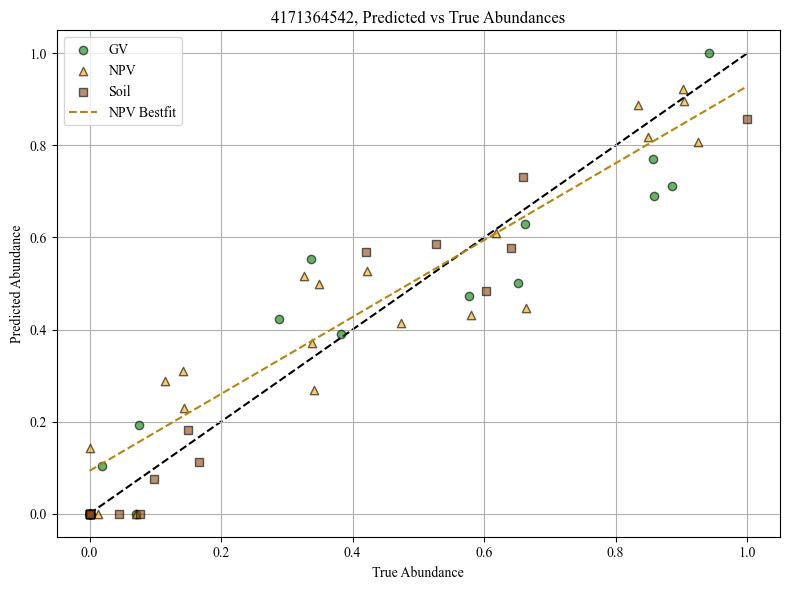

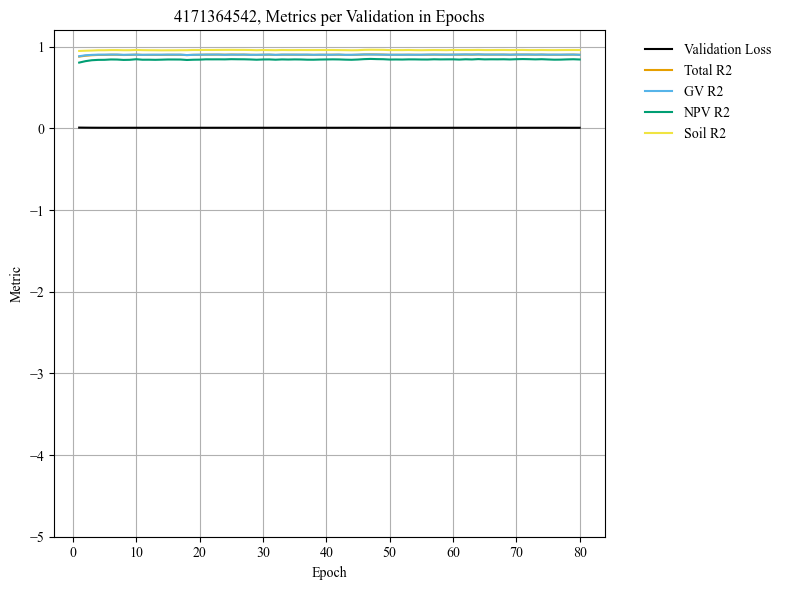

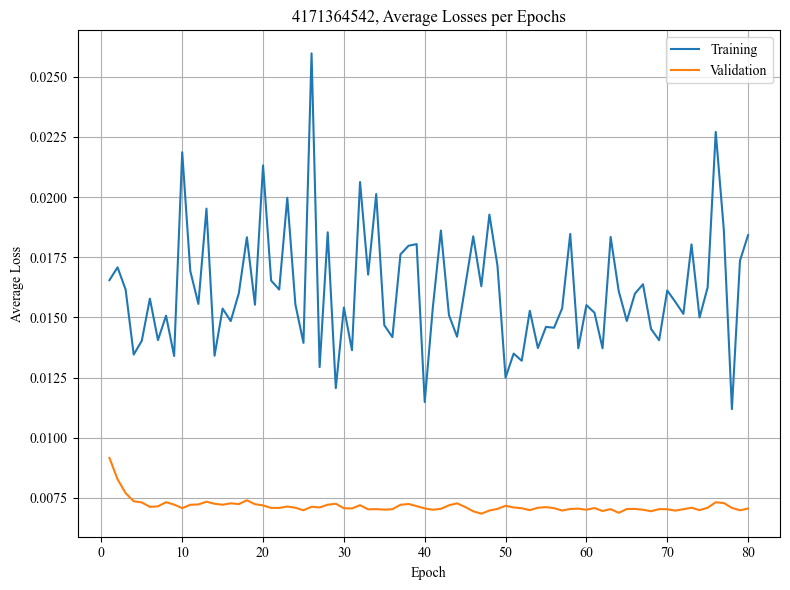

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.026846
Epoch 1/80, Step 2/5, Train Loss: 0.006387
Epoch 1/80, Step 3/5, Train Loss: 0.013762
Epoch 1/80, Step 4/5, Train Loss: 0.013622
Epoch 1/80, Step 5/5, Train Loss: 0.013252
Epoch 1/80 complete. Train Loss: 0.014774, Val Loss: 0.009248
Epoch 2/80, Step 1/5, Train Loss: 0.015302
Epoch 2/80, Step 2/5, Train Loss: 0.015101
Epoch 2/80, Step 3/5, Train Loss: 0.009339
Epoch 2/80, Step 4/5, Train Loss: 0.034788
Epoch 2/80, Step 5/5, Train Loss: 0.008351
Epoch 2/80 complete. Train Loss: 0.016576, Val Loss: 0.008944
Epoch 3/80, Step 1/5, Train Loss: 0.014049
Epoch 3/80, Step 2/5, Train Loss: 0.029939
Epoch 3/80, Step 3/5, Train Loss: 0.017696
Epoch 3/80, Step 4/5, Train Loss: 0.026354
Epoch 3/80, Step 5/5, Train Loss: 0.011961
Epoch 3/80 complete. Train Loss: 0.020000, Val Loss: 0.008666
Epoch 4/80, Step 1/5, Train Loss: 0.007840
Epoch 4/80, Step 2/5, Train Loss: 0.029469
Epoch 4/80, Step 3/5, Train Loss: 0.012609
Epoch 4/80, Step 4/5, Train Loss: 0.0168

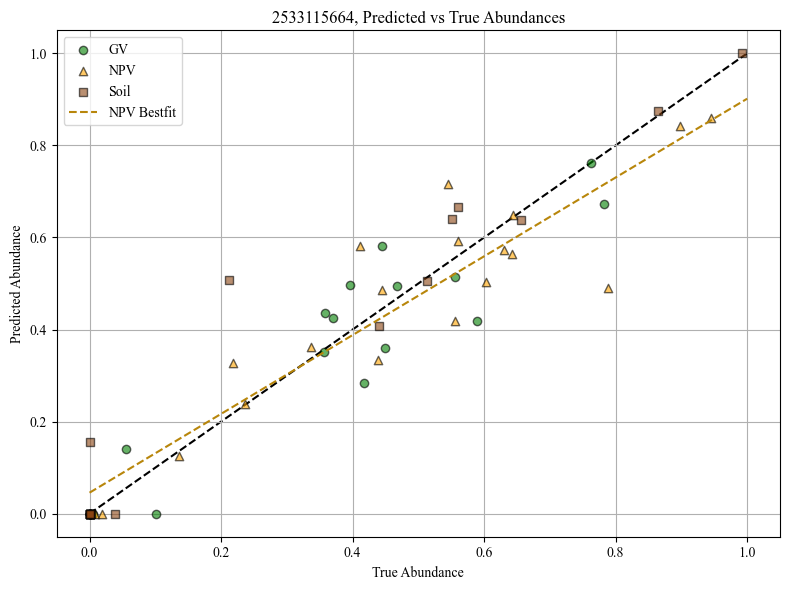

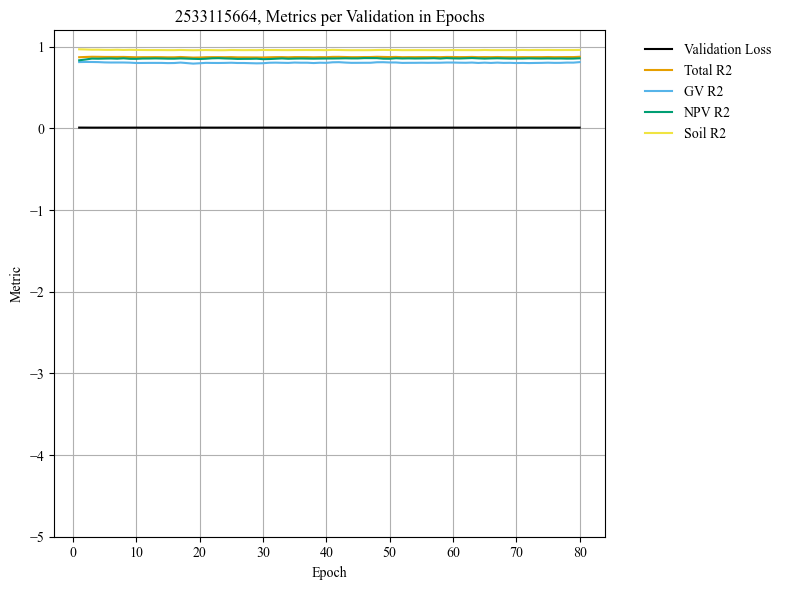

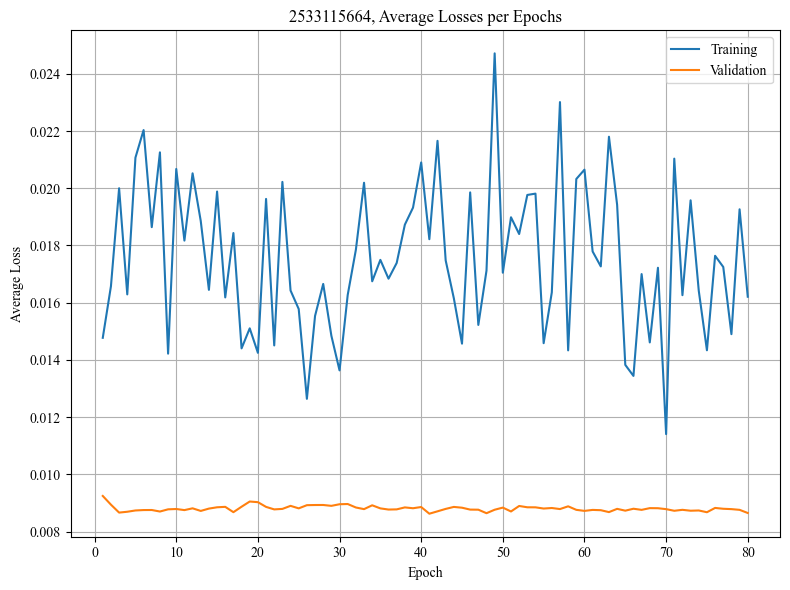

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016532
Epoch 1/80, Step 2/5, Train Loss: 0.026914
Epoch 1/80, Step 3/5, Train Loss: 0.023824
Epoch 1/80, Step 4/5, Train Loss: 0.021283
Epoch 1/80, Step 5/5, Train Loss: 0.011258
Epoch 1/80 complete. Train Loss: 0.019962, Val Loss: 0.011129
Epoch 2/80, Step 1/5, Train Loss: 0.030279
Epoch 2/80, Step 2/5, Train Loss: 0.019941
Epoch 2/80, Step 3/5, Train Loss: 0.014366
Epoch 2/80, Step 4/5, Train Loss: 0.030325
Epoch 2/80, Step 5/5, Train Loss: 0.010624
Epoch 2/80 complete. Train Loss: 0.021107, Val Loss: 0.010555
Epoch 3/80, Step 1/5, Train Loss: 0.007631
Epoch 3/80, Step 2/5, Train Loss: 0.027070
Epoch 3/80, Step 3/5, Train Loss: 0.032293
Epoch 3/80, Step 4/5, Train Loss: 0.012744
Epoch 3/80, Step 5/5, Train Loss: 0.012403
Epoch 3/80 complete. Train Loss: 0.018428, Val Loss: 0.010307
Epoch 4/80, Step 1/5, Train Loss: 0.021595
Epoch 4/80, Step 2/5, Train Loss: 0.012607
Epoch 4/80, Step 3/5, Train Loss: 0.009244
Epoch 4/80, Step 4/5, Train Loss: 0.0277

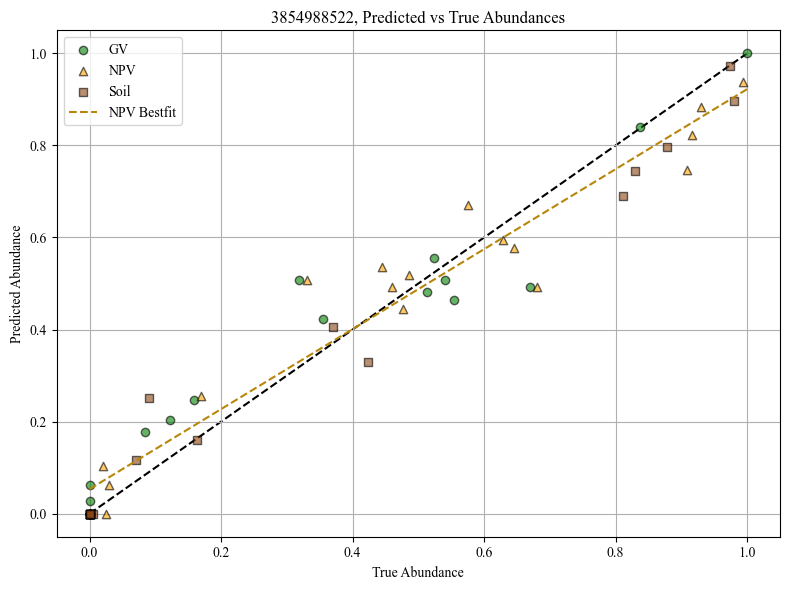

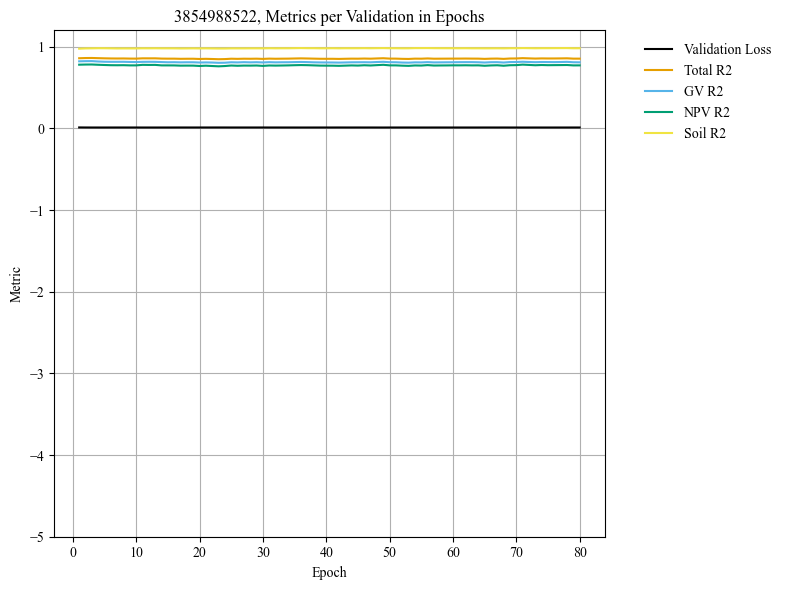

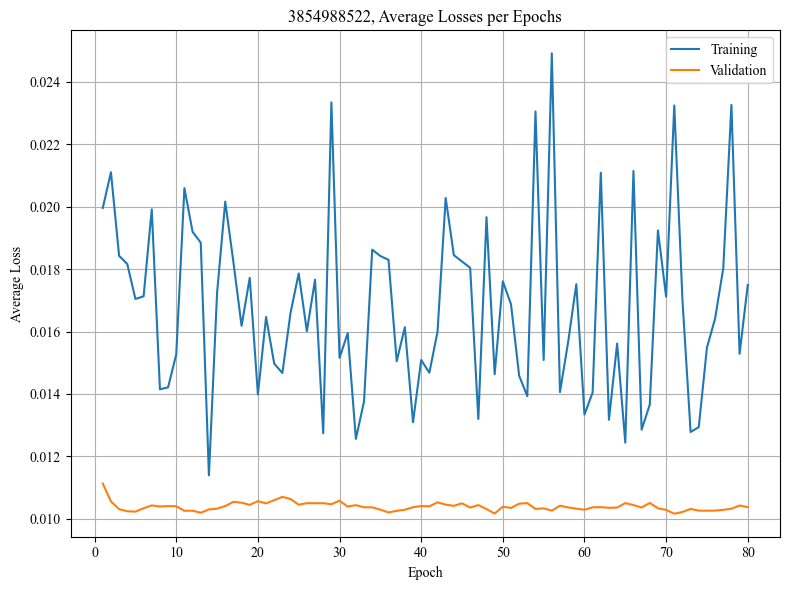

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.014806
Epoch 1/80, Step 2/5, Train Loss: 0.023531
Epoch 1/80, Step 3/5, Train Loss: 0.021095
Epoch 1/80, Step 4/5, Train Loss: 0.024104
Epoch 1/80, Step 5/5, Train Loss: 0.023330
Epoch 1/80 complete. Train Loss: 0.021373, Val Loss: 0.010660
Epoch 2/80, Step 1/5, Train Loss: 0.018426
Epoch 2/80, Step 2/5, Train Loss: 0.010960
Epoch 2/80, Step 3/5, Train Loss: 0.030661
Epoch 2/80, Step 4/5, Train Loss: 0.015217
Epoch 2/80, Step 5/5, Train Loss: 0.025401
Epoch 2/80 complete. Train Loss: 0.020133, Val Loss: 0.010761
Epoch 3/80, Step 1/5, Train Loss: 0.038489
Epoch 3/80, Step 2/5, Train Loss: 0.019822
Epoch 3/80, Step 3/5, Train Loss: 0.011191
Epoch 3/80, Step 4/5, Train Loss: 0.022388
Epoch 3/80, Step 5/5, Train Loss: 0.017224
Epoch 3/80 complete. Train Loss: 0.021823, Val Loss: 0.010639
Epoch 4/80, Step 1/5, Train Loss: 0.014288
Epoch 4/80, Step 2/5, Train Loss: 0.034119
Epoch 4/80, Step 3/5, Train Loss: 0.017217
Epoch 4/80, Step 4/5, Train Loss: 0.0184

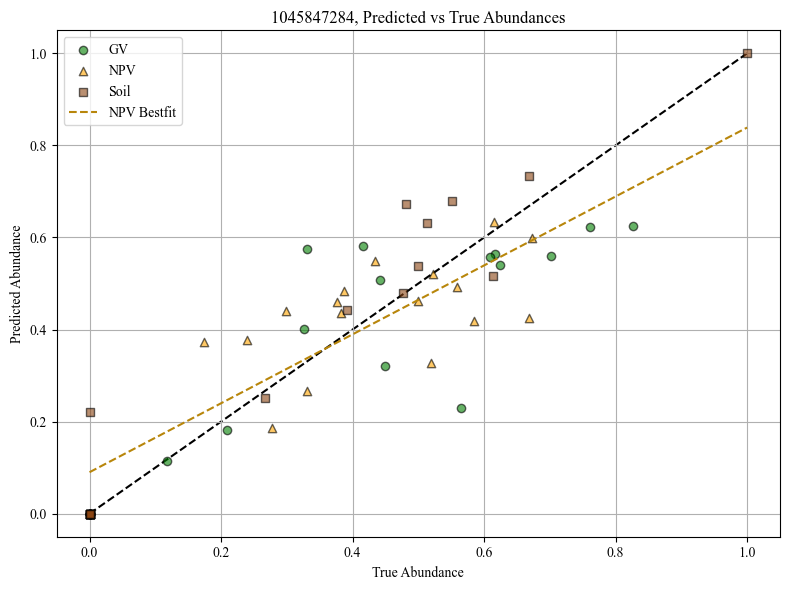

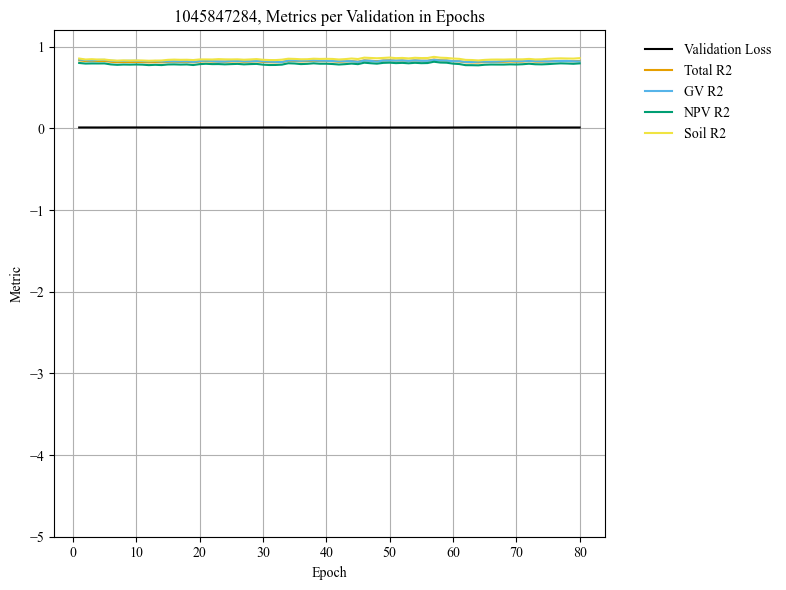

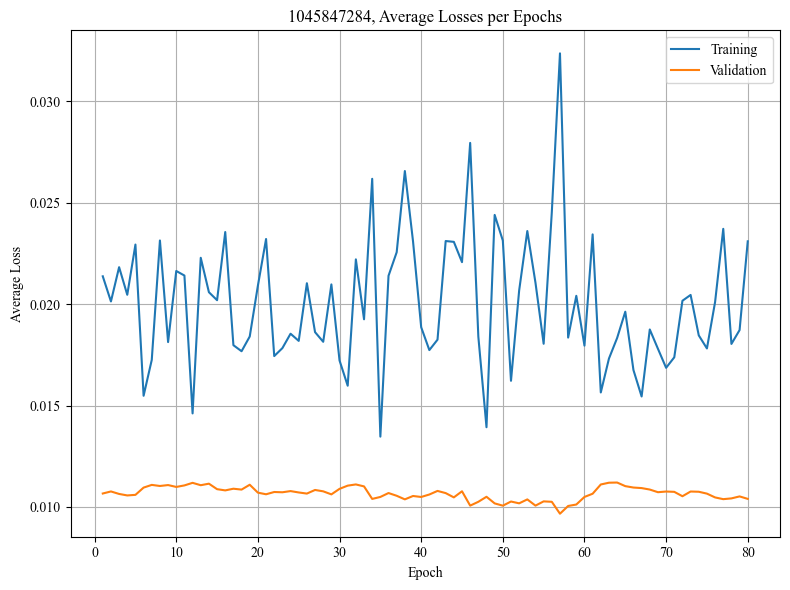

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009655
Epoch 1/80, Step 2/5, Train Loss: 0.022065
Epoch 1/80, Step 3/5, Train Loss: 0.017889
Epoch 1/80, Step 4/5, Train Loss: 0.020349
Epoch 1/80, Step 5/5, Train Loss: 0.014485
Epoch 1/80 complete. Train Loss: 0.016889, Val Loss: 0.007133
Epoch 2/80, Step 1/5, Train Loss: 0.012313
Epoch 2/80, Step 2/5, Train Loss: 0.013221
Epoch 2/80, Step 3/5, Train Loss: 0.016747
Epoch 2/80, Step 4/5, Train Loss: 0.018643
Epoch 2/80, Step 5/5, Train Loss: 0.008046
Epoch 2/80 complete. Train Loss: 0.013794, Val Loss: 0.006835
Epoch 3/80, Step 1/5, Train Loss: 0.012195
Epoch 3/80, Step 2/5, Train Loss: 0.032221
Epoch 3/80, Step 3/5, Train Loss: 0.016373
Epoch 3/80, Step 4/5, Train Loss: 0.018079
Epoch 3/80, Step 5/5, Train Loss: 0.028285
Epoch 3/80 complete. Train Loss: 0.021431, Val Loss: 0.006700
Epoch 4/80, Step 1/5, Train Loss: 0.008141
Epoch 4/80, Step 2/5, Train Loss: 0.028277
Epoch 4/80, Step 3/5, Train Loss: 0.021935
Epoch 4/80, Step 4/5, Train Loss: 0.0157

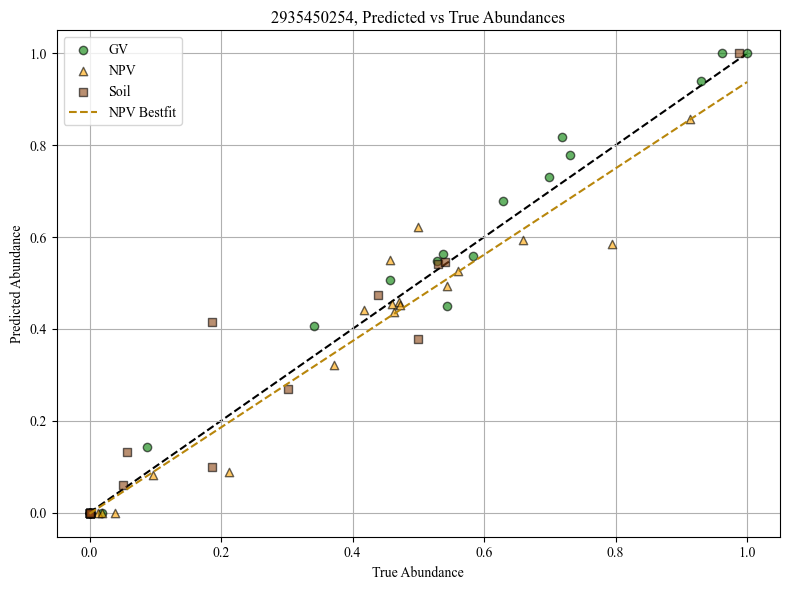

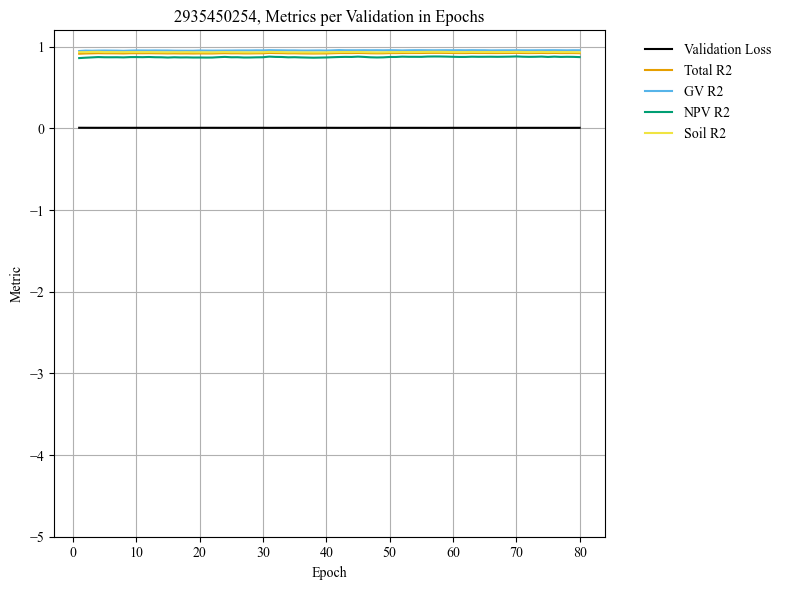

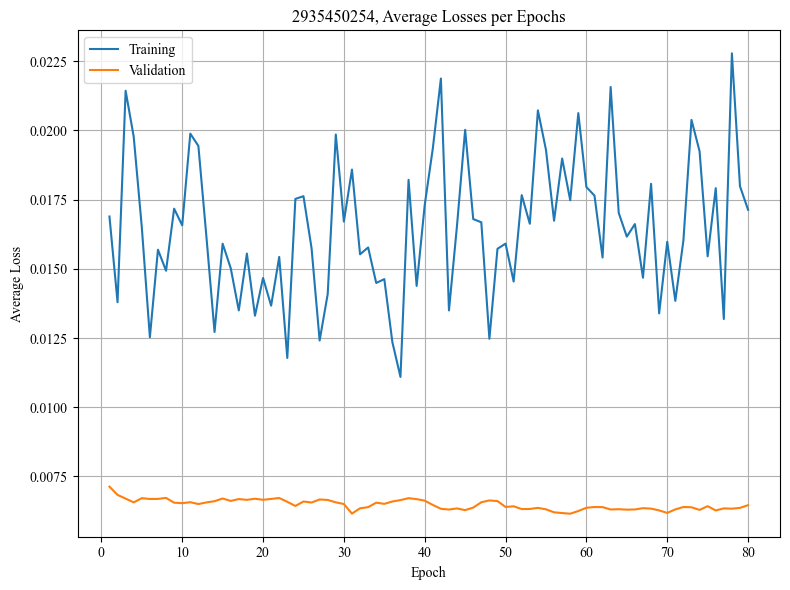

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011834
Epoch 1/80, Step 2/5, Train Loss: 0.017302
Epoch 1/80, Step 3/5, Train Loss: 0.020380
Epoch 1/80, Step 4/5, Train Loss: 0.013936
Epoch 1/80, Step 5/5, Train Loss: 0.027498
Epoch 1/80 complete. Train Loss: 0.018190, Val Loss: 0.007550
Epoch 2/80, Step 1/5, Train Loss: 0.015304
Epoch 2/80, Step 2/5, Train Loss: 0.011316
Epoch 2/80, Step 3/5, Train Loss: 0.013575
Epoch 2/80, Step 4/5, Train Loss: 0.018843
Epoch 2/80, Step 5/5, Train Loss: 0.024558
Epoch 2/80 complete. Train Loss: 0.016719, Val Loss: 0.007454
Epoch 3/80, Step 1/5, Train Loss: 0.017970
Epoch 3/80, Step 2/5, Train Loss: 0.015178
Epoch 3/80, Step 3/5, Train Loss: 0.033376
Epoch 3/80, Step 4/5, Train Loss: 0.019891
Epoch 3/80, Step 5/5, Train Loss: 0.020388
Epoch 3/80 complete. Train Loss: 0.021361, Val Loss: 0.007480
Epoch 4/80, Step 1/5, Train Loss: 0.009659
Epoch 4/80, Step 2/5, Train Loss: 0.012599
Epoch 4/80, Step 3/5, Train Loss: 0.011851
Epoch 4/80, Step 4/5, Train Loss: 0.0211

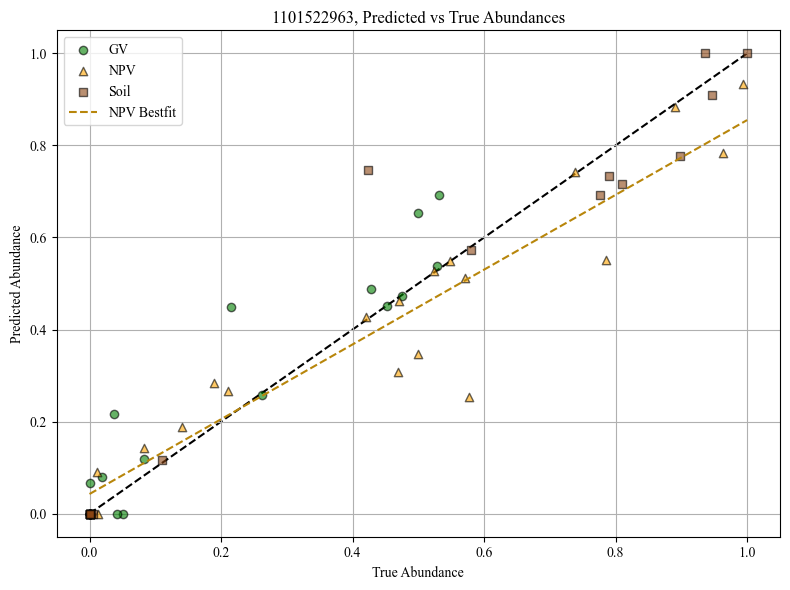

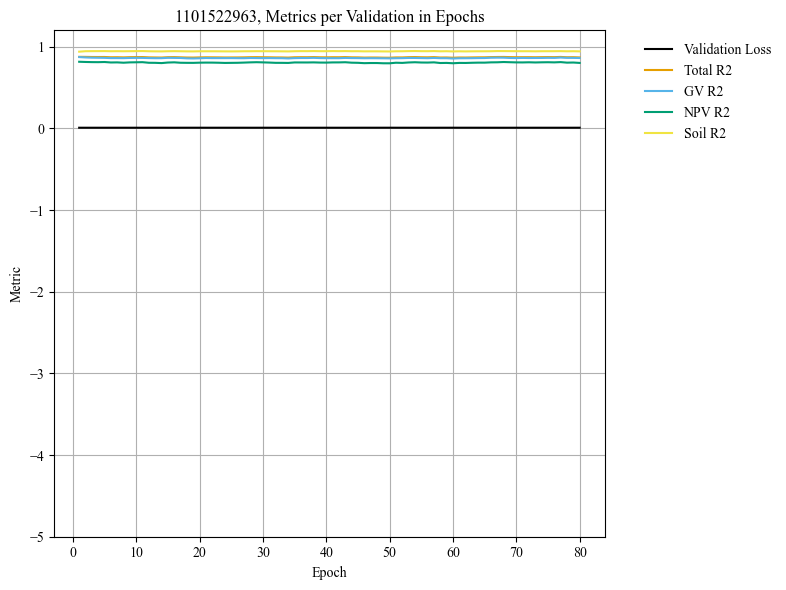

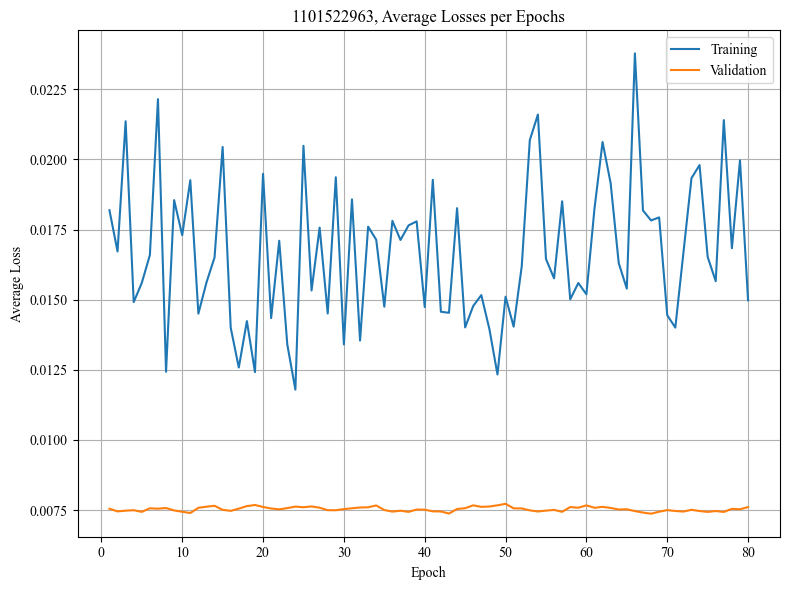

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007595
Epoch 1/80, Step 2/5, Train Loss: 0.006109
Epoch 1/80, Step 3/5, Train Loss: 0.013794
Epoch 1/80, Step 4/5, Train Loss: 0.010886
Epoch 1/80, Step 5/5, Train Loss: 0.012377
Epoch 1/80 complete. Train Loss: 0.010152, Val Loss: 0.006811
Epoch 2/80, Step 1/5, Train Loss: 0.009030
Epoch 2/80, Step 2/5, Train Loss: 0.016843
Epoch 2/80, Step 3/5, Train Loss: 0.015838
Epoch 2/80, Step 4/5, Train Loss: 0.006694
Epoch 2/80, Step 5/5, Train Loss: 0.014939
Epoch 2/80 complete. Train Loss: 0.012669, Val Loss: 0.006708
Epoch 3/80, Step 1/5, Train Loss: 0.014491
Epoch 3/80, Step 2/5, Train Loss: 0.017869
Epoch 3/80, Step 3/5, Train Loss: 0.009885
Epoch 3/80, Step 4/5, Train Loss: 0.005856
Epoch 3/80, Step 5/5, Train Loss: 0.006994
Epoch 3/80 complete. Train Loss: 0.011019, Val Loss: 0.006706
Epoch 4/80, Step 1/5, Train Loss: 0.022875
Epoch 4/80, Step 2/5, Train Loss: 0.011814
Epoch 4/80, Step 3/5, Train Loss: 0.025041
Epoch 4/80, Step 4/5, Train Loss: 0.0174

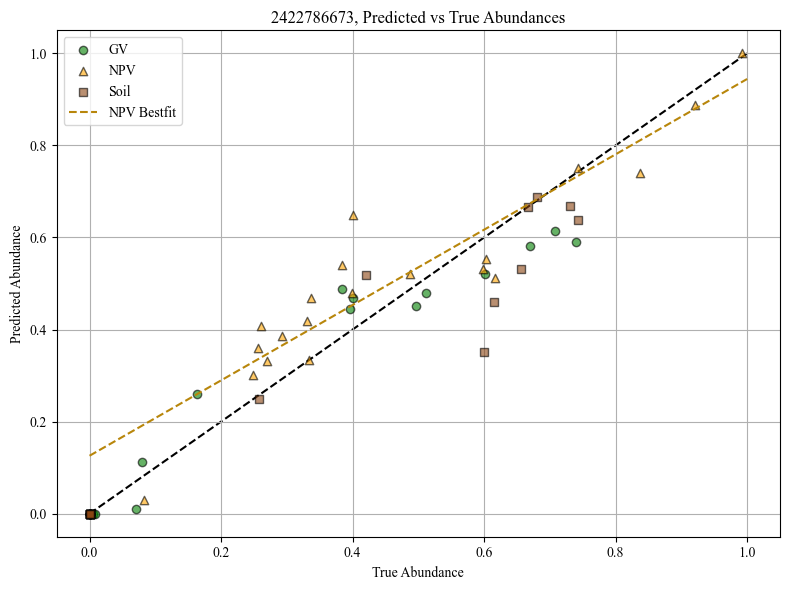

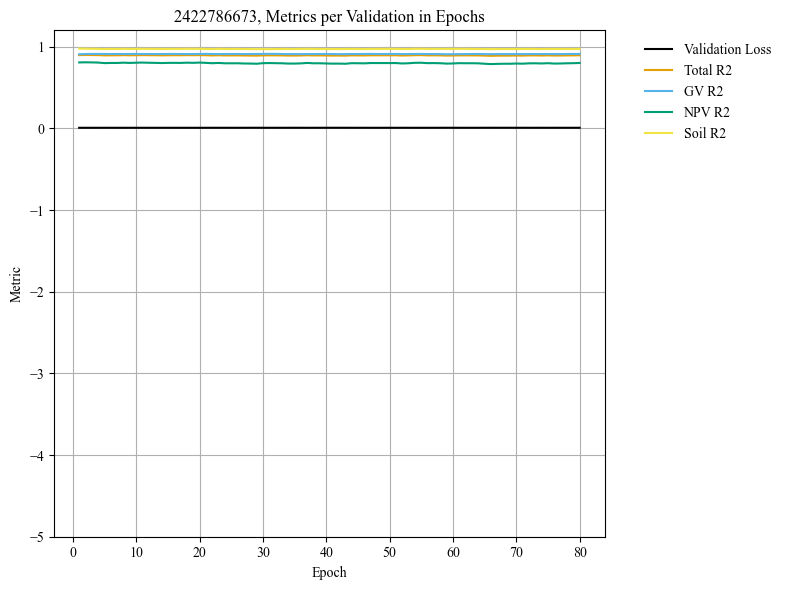

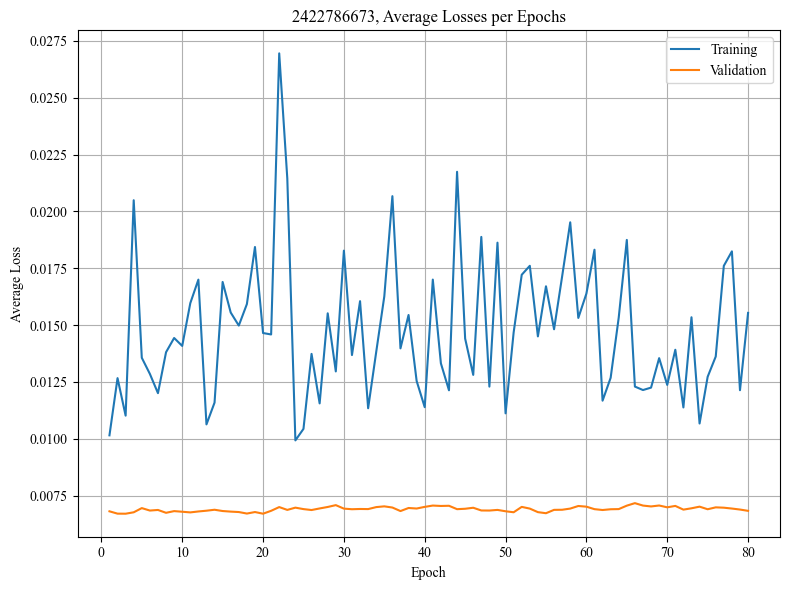

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007697
Epoch 1/80, Step 2/5, Train Loss: 0.023454
Epoch 1/80, Step 3/5, Train Loss: 0.011166
Epoch 1/80, Step 4/5, Train Loss: 0.012985
Epoch 1/80, Step 5/5, Train Loss: 0.016415
Epoch 1/80 complete. Train Loss: 0.014343, Val Loss: 0.008541
Epoch 2/80, Step 1/5, Train Loss: 0.019527
Epoch 2/80, Step 2/5, Train Loss: 0.005746
Epoch 2/80, Step 3/5, Train Loss: 0.021903
Epoch 2/80, Step 4/5, Train Loss: 0.021539
Epoch 2/80, Step 5/5, Train Loss: 0.016700
Epoch 2/80 complete. Train Loss: 0.017083, Val Loss: 0.008407
Epoch 3/80, Step 1/5, Train Loss: 0.022016
Epoch 3/80, Step 2/5, Train Loss: 0.017783
Epoch 3/80, Step 3/5, Train Loss: 0.032879
Epoch 3/80, Step 4/5, Train Loss: 0.012154
Epoch 3/80, Step 5/5, Train Loss: 0.028367
Epoch 3/80 complete. Train Loss: 0.022640, Val Loss: 0.008370
Epoch 4/80, Step 1/5, Train Loss: 0.012177
Epoch 4/80, Step 2/5, Train Loss: 0.011149
Epoch 4/80, Step 3/5, Train Loss: 0.012651
Epoch 4/80, Step 4/5, Train Loss: 0.0191

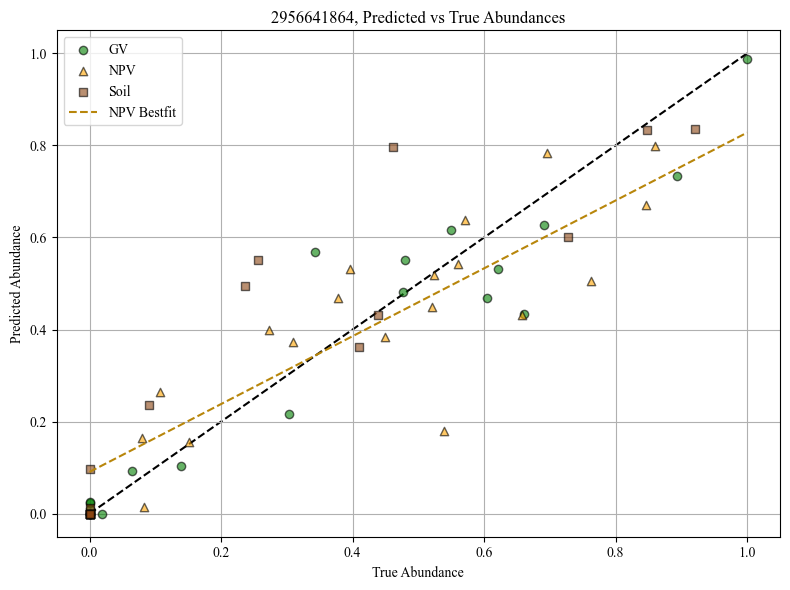

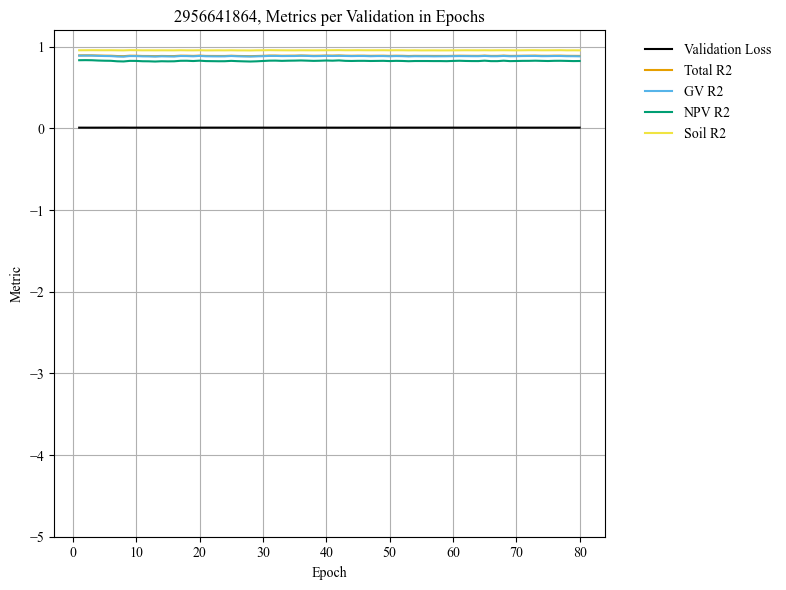

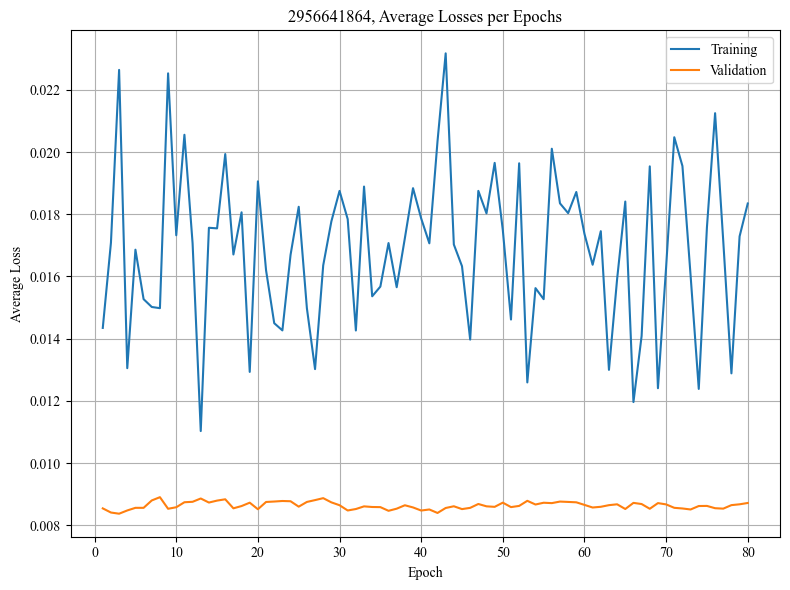

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019024
Epoch 1/80, Step 2/5, Train Loss: 0.005982
Epoch 1/80, Step 3/5, Train Loss: 0.008150
Epoch 1/80, Step 4/5, Train Loss: 0.015780
Epoch 1/80, Step 5/5, Train Loss: 0.024309
Epoch 1/80 complete. Train Loss: 0.014649, Val Loss: 0.011358
Epoch 2/80, Step 1/5, Train Loss: 0.011979
Epoch 2/80, Step 2/5, Train Loss: 0.018385
Epoch 2/80, Step 3/5, Train Loss: 0.016368
Epoch 2/80, Step 4/5, Train Loss: 0.006881
Epoch 2/80, Step 5/5, Train Loss: 0.009199
Epoch 2/80 complete. Train Loss: 0.012562, Val Loss: 0.010631
Epoch 3/80, Step 1/5, Train Loss: 0.024276
Epoch 3/80, Step 2/5, Train Loss: 0.015169
Epoch 3/80, Step 3/5, Train Loss: 0.030528
Epoch 3/80, Step 4/5, Train Loss: 0.009195
Epoch 3/80, Step 5/5, Train Loss: 0.017272
Epoch 3/80 complete. Train Loss: 0.019288, Val Loss: 0.010329
Epoch 4/80, Step 1/5, Train Loss: 0.015152
Epoch 4/80, Step 2/5, Train Loss: 0.014380
Epoch 4/80, Step 3/5, Train Loss: 0.012967
Epoch 4/80, Step 4/5, Train Loss: 0.0107

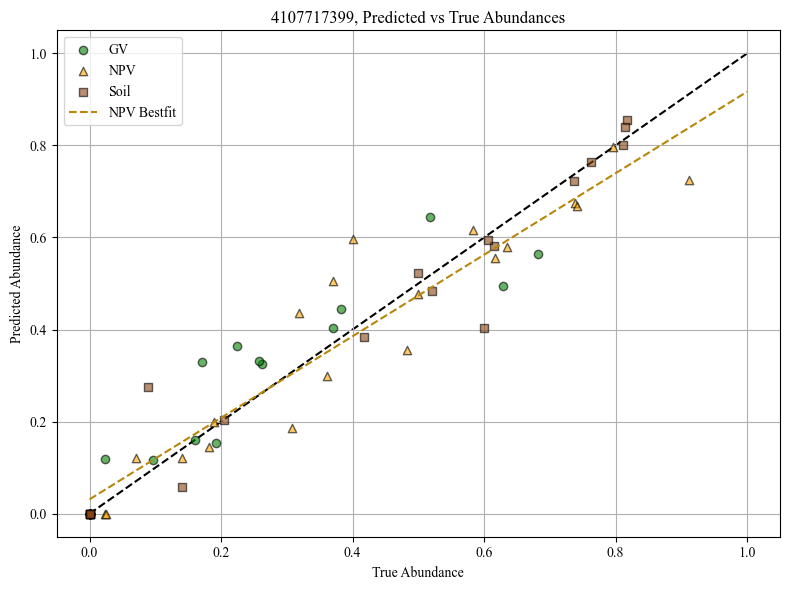

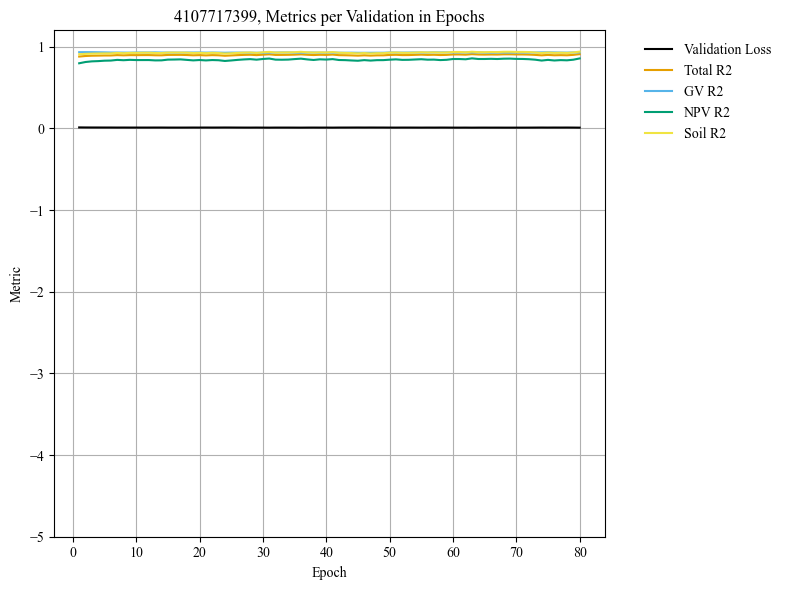

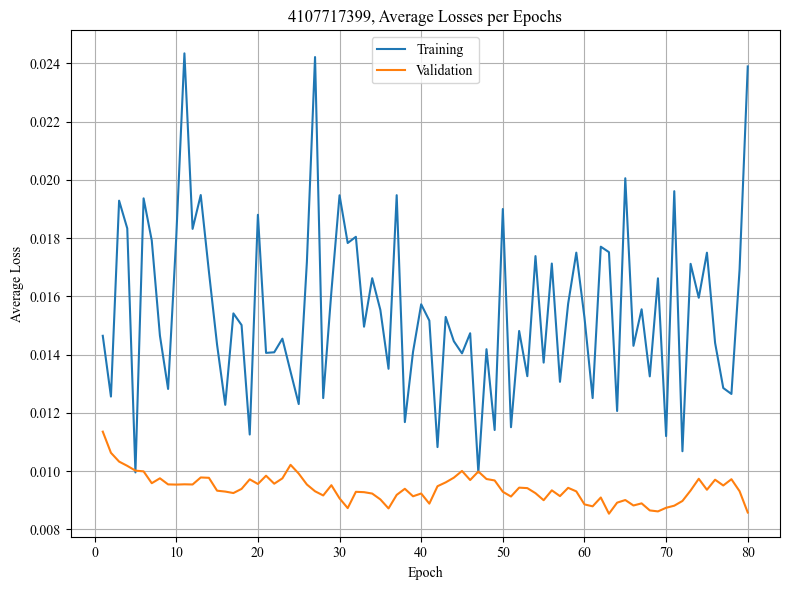

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.019339
Epoch 1/80, Step 2/5, Train Loss: 0.009027
Epoch 1/80, Step 3/5, Train Loss: 0.015034
Epoch 1/80, Step 4/5, Train Loss: 0.038948
Epoch 1/80, Step 5/5, Train Loss: 0.020639
Epoch 1/80 complete. Train Loss: 0.020597, Val Loss: 0.004742
Epoch 2/80, Step 1/5, Train Loss: 0.009020
Epoch 2/80, Step 2/5, Train Loss: 0.026840
Epoch 2/80, Step 3/5, Train Loss: 0.009251
Epoch 2/80, Step 4/5, Train Loss: 0.007775
Epoch 2/80, Step 5/5, Train Loss: 0.016736
Epoch 2/80 complete. Train Loss: 0.013924, Val Loss: 0.004470
Epoch 3/80, Step 1/5, Train Loss: 0.006809
Epoch 3/80, Step 2/5, Train Loss: 0.026884
Epoch 3/80, Step 3/5, Train Loss: 0.006619
Epoch 3/80, Step 4/5, Train Loss: 0.009535
Epoch 3/80, Step 5/5, Train Loss: 0.023610
Epoch 3/80 complete. Train Loss: 0.014691, Val Loss: 0.004410
Epoch 4/80, Step 1/5, Train Loss: 0.023955
Epoch 4/80, Step 2/5, Train Loss: 0.011409
Epoch 4/80, Step 3/5, Train Loss: 0.019907
Epoch 4/80, Step 4/5, Train Loss: 0.0053

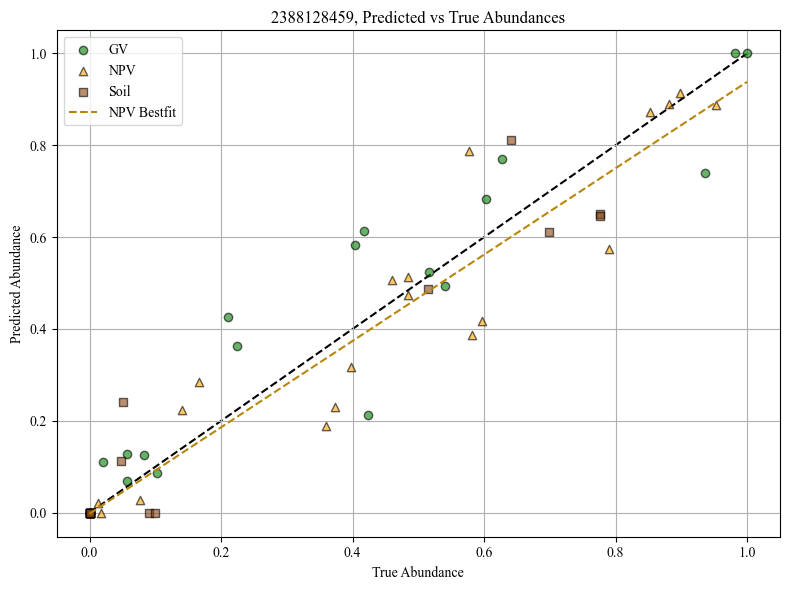

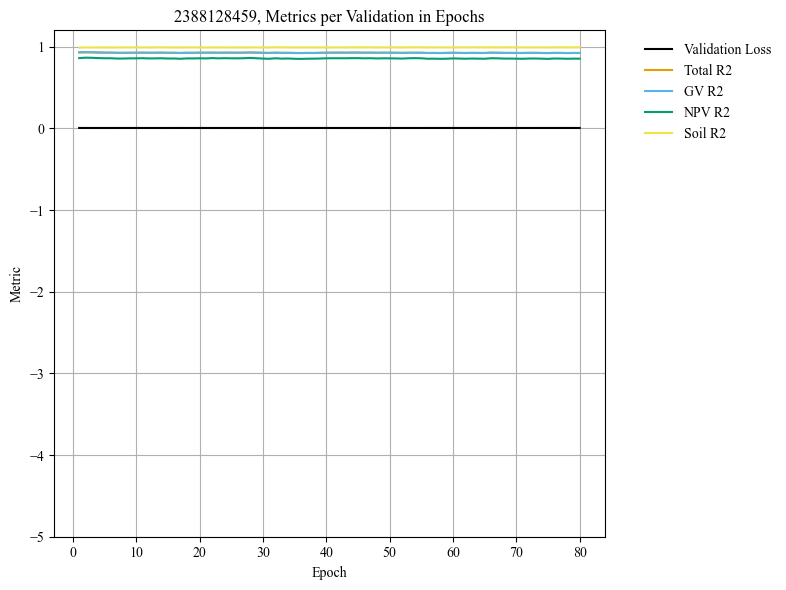

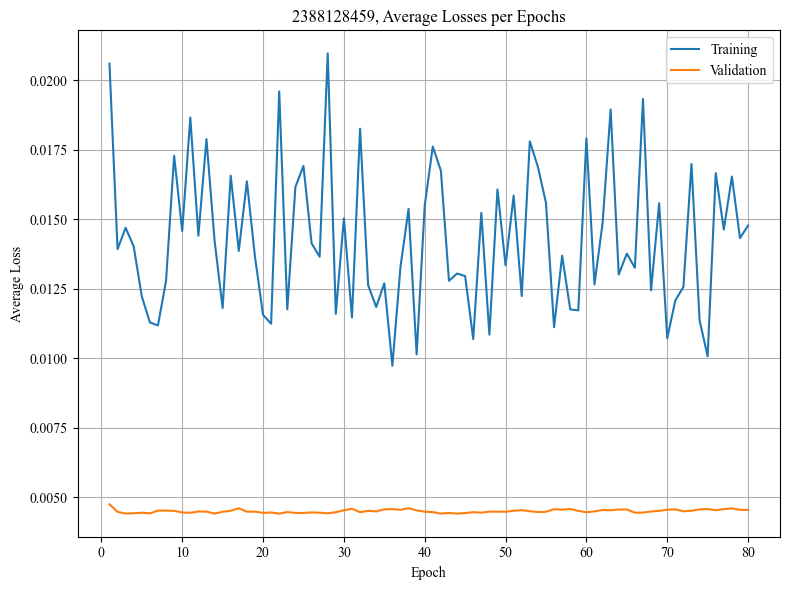

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.020907
Epoch 1/80, Step 2/5, Train Loss: 0.013130
Epoch 1/80, Step 3/5, Train Loss: 0.023494
Epoch 1/80, Step 4/5, Train Loss: 0.025328
Epoch 1/80, Step 5/5, Train Loss: 0.036579
Epoch 1/80 complete. Train Loss: 0.023888, Val Loss: 0.013743
Epoch 2/80, Step 1/5, Train Loss: 0.018957
Epoch 2/80, Step 2/5, Train Loss: 0.030086
Epoch 2/80, Step 3/5, Train Loss: 0.010789
Epoch 2/80, Step 4/5, Train Loss: 0.036892
Epoch 2/80, Step 5/5, Train Loss: 0.022166
Epoch 2/80 complete. Train Loss: 0.023778, Val Loss: 0.012065
Epoch 3/80, Step 1/5, Train Loss: 0.024379
Epoch 3/80, Step 2/5, Train Loss: 0.016033
Epoch 3/80, Step 3/5, Train Loss: 0.043946
Epoch 3/80, Step 4/5, Train Loss: 0.012213
Epoch 3/80, Step 5/5, Train Loss: 0.010852
Epoch 3/80 complete. Train Loss: 0.021484, Val Loss: 0.011212
Epoch 4/80, Step 1/5, Train Loss: 0.042063
Epoch 4/80, Step 2/5, Train Loss: 0.009774
Epoch 4/80, Step 3/5, Train Loss: 0.015610
Epoch 4/80, Step 4/5, Train Loss: 0.0135

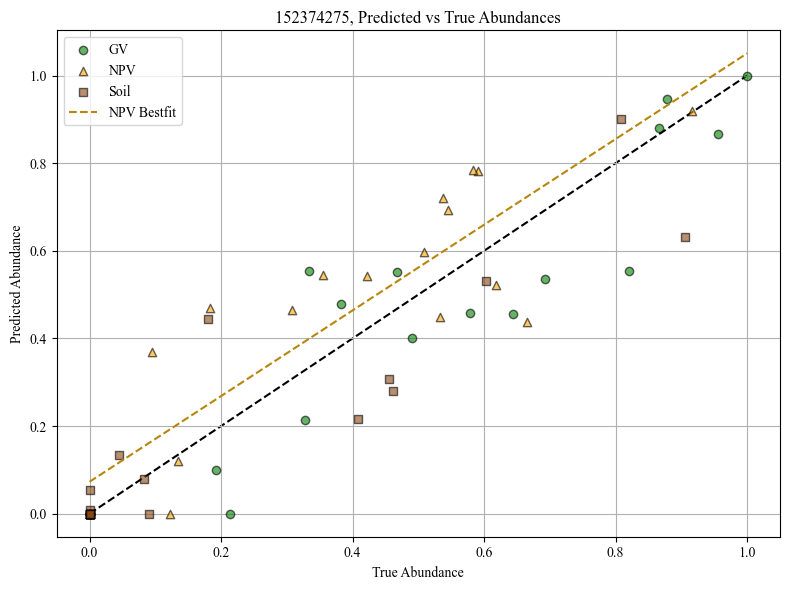

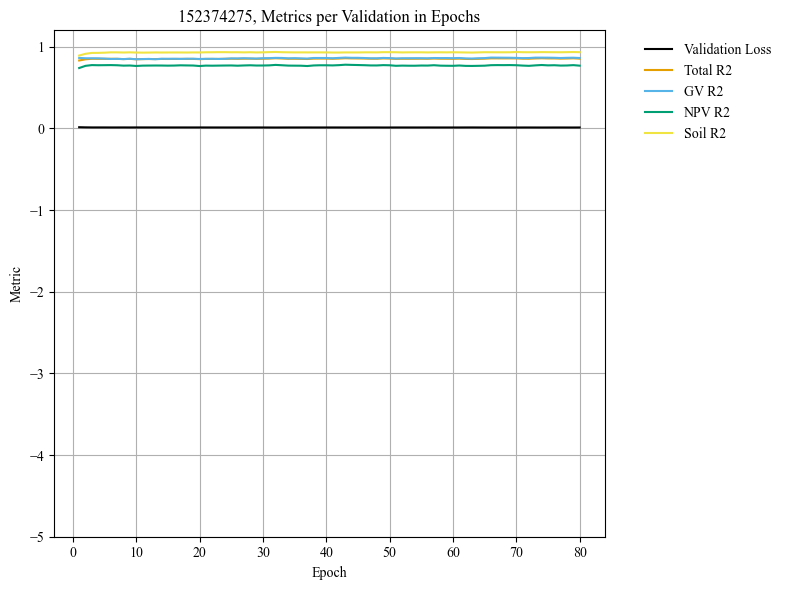

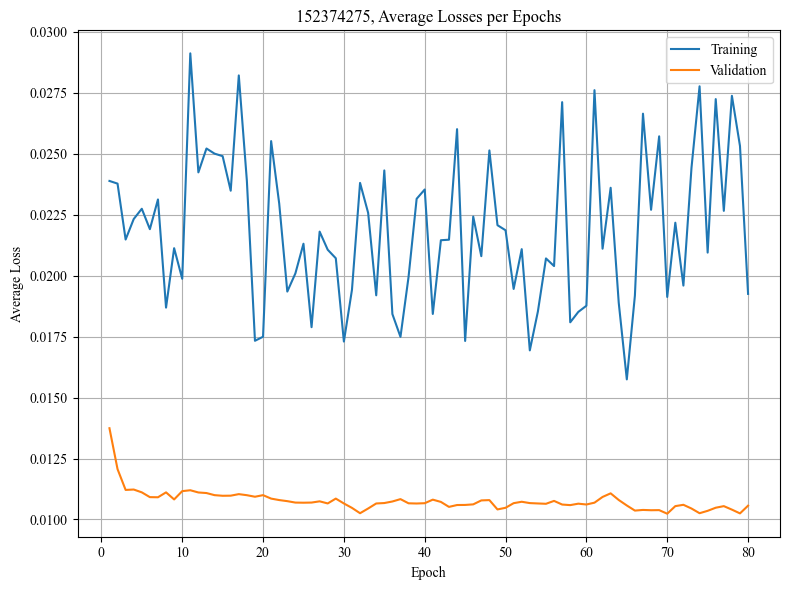

Testing complete


In [48]:
# Run the monte carlo cross validation loop

cnn_64_dict = {}

for seed in mccv_seeds:
    torch.manual_seed(seed) # Set this as the global seed for all random ops in torch and numpy, just to be safe
    np.random.default_rng(seed)

    dataloaders = get_data(save_path=save_path, seed=seed, spec_range=[900, 1690], batch_size=batch_size, n_train=n_train, n_val=n_val, n_test=n_test)
    model = load_frozen(model_cfg, statedict_path, 'CNN').to(device)
    active_params = filter(lambda p: p.requires_grad, model.parameters()) # Filter the active params only
    optimizer = torch.optim.AdamW(active_params, lr=lr, weight_decay=weight_decay) # Only pass in the active params to the optim
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epoch*n_tb_epoch, eta_min=1e-6)
    loss = nn.MSELoss()

    model_dict = train_model(
        model=model,
        loss_fn=loss,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        configured_data=dataloaders,
        n_epoch=epoch,
        n_tb_epoch=n_tb_epoch,
        device=device,
        dtype=torch.float32,
        save_dir=str('results/'+str(seed)),
        model_name=str(seed),
        save_artifacts=True # Will only save metrics, artifacts are unnecessary
    )
    
    cnn_64_dict[seed] = model_dict

In [49]:
import pickle
with open('cnn_64_dict.pkl', 'wb') as fp:
    pickle.dump(cnn_64_dict, fp)

NPV R^2 MCCV Results (M=50)
Mean (μ): 0.7859
Std (σ): ±0.1357
Min-Max: 0.4034-0.9527
Final Reported Metric: 0.7859 ± 0.1357


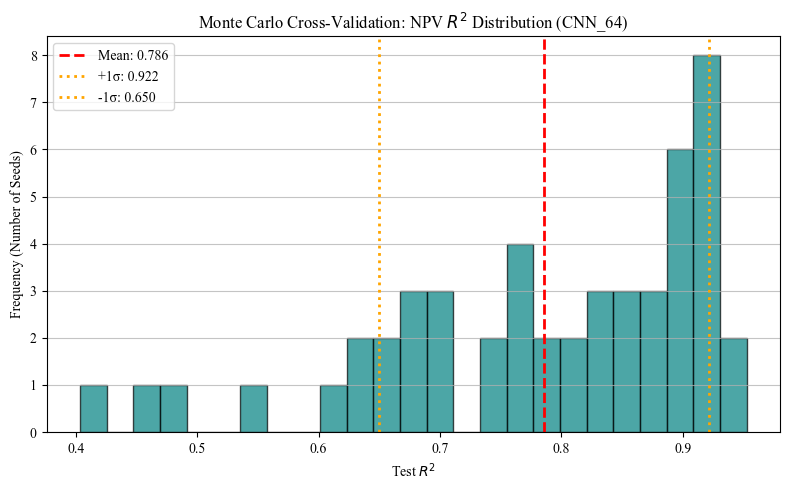

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Extract the NPV R2 metrics
npv_r2_list = [
    model_dict['metrics_total'][0][5] 
    for seed, model_dict in cnn_64_dict.items()
]
npv_r2_array = np.array(npv_r2_list)

# Calculate the core statistical bounds
# Used ddof=1 for the unbiased sample standard deviation
mu_npv = np.mean(npv_r2_array)
sigma_npv = np.std(npv_r2_array, ddof=1)
min_npv = np.min(npv_r2_array)
max_npv = np.max(npv_r2_array)

# Plot stuff
print(f"NPV R^2 MCCV Results (M={len(npv_r2_array)})")
print(f"Mean (μ): {mu_npv:.4f}")
print(f"Std (σ): ±{sigma_npv:.4f}")
print(f"Min-Max: {min_npv:.4f}-{max_npv:.4f}")
print(f"Final Reported Metric: {mu_npv:.4f} ± {sigma_npv:.4f}")
plt.figure(figsize=(8, 5))
plt.hist(npv_r2_array, bins=25, color='teal', edgecolor='black', alpha=0.7)
plt.axvline(mu_npv, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mu_npv:.3f}')
plt.axvline(mu_npv + sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'+1σ: {(mu_npv + sigma_npv):.3f}')
plt.axvline(mu_npv - sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'-1σ: {(mu_npv - sigma_npv):.3f}')
plt.title('Monte Carlo Cross-Validation: NPV $R^2$ Distribution (CNN_64)')
plt.xlabel('Test $R^2$')
plt.ylabel('Frequency (Number of Seeds)')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.savefig('mccv_npv_r2_distribution.svg')
plt.show()